In [46]:
import os
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.nn.parameter import Parameter
import matplotlib.pyplot as plt
import operato
from functools import reduce
from functools import partial
from timeit import default_timer
from utilities3 import *
import scipy
import sys
from scipy.io import loadmat
from matplotlib.colors import ListedColormap

In [9]:
#################### fourier layer ############################################
class SpectralConv2d(nn.Module):
    def __init__(self, in_channels, out_channels, modes1, modes2):
        super(SpectralConv2d, self).__init__()
        """
        2D Fourier layer. It does FFT, linear transform, and Inverse FFT.    
        """
        self.in_channels = in_channels
        self.out_channels = out_channels
        self.modes1 = modes1 #Number of Fourier modes to multiply, at most floor(N/2) + 1
        self.modes2 = modes2
        self.scale = (1 / (in_channels * out_channels))
        self.weights1 = nn.Parameter(self.scale * torch.rand(in_channels, out_channels, self.modes1, self.modes2, dtype=torch.cfloat))
        self.weights2 = nn.Parameter(self.scale * torch.rand(in_channels, out_channels, self.modes1, self.modes2, dtype=torch.cfloat))
    # Complex multiplication
    def compl_mul2d(self, input, weights):
        # (batch, in_channel, x,y ), (in_channel, out_channel, x,y) -> (batch, out_channel, x,y)
        return torch.einsum("bixy,ioxy->boxy", input, weights)
    def forward(self, x):
        batchsize = x.shape[0]
        #Compute Fourier coeffcients up to factor of e^(- something constant)
        x_ft = torch.fft.rfft2(x)
        # Multiply relevant Fourier modes
        out_ft = torch.zeros(batchsize, self.out_channels,  x.size(-2), x.size(-1)//2 + 1, dtype=torch.cfloat, device=x.device)
        out_ft[:, :, :self.modes1, :self.modes2] = \
            self.compl_mul2d(x_ft[:, :, :self.modes1, :self.modes2], self.weights1)
        out_ft[:, :, -self.modes1:, :self.modes2] = \
            self.compl_mul2d(x_ft[:, :, -self.modes1:, :self.modes2], self.weights2)
        #Return to physical space
        x = torch.fft.irfft2(out_ft, s=(x.size(-2), x.size(-1)))
        return x

In [3]:
class FNO2d(nn.Module):
    def __init__(self, modes1, modes2,  width):
        super(FNO2d, self).__init__()
        """
        The overall network. It contains 4 layers of the Fourier layer.
        1. Lift the input to the desire channel dimension by self.fc0 .
        2. 4 layers of the integral operators u' = (W + K)(u).
            W defined by self.w; K defined by self.conv .
        3. Project from the channel space to the output space by self.fc1 and self.fc2 .        
        input: the solution of the coefficient function and locations (a(x, y), x, y)
        input shape: (batchsize, x=s, y=s, c=3)
        output: the solution 
        output shape: (batchsize, x=s, y=s, c=1)
        """
        self.modes1 = modes1
        self.modes2 = modes2
        self.width = width
        self.fc0 = nn.Linear(3, self.width) # input channel is 3: (a(x, y), x, y)
        self.conv0 = SpectralConv2d(self.width, self.width, self.modes1, self.modes2)
        self.conv1 = SpectralConv2d(self.width, self.width, self.modes1, self.modes2)
        self.conv2 = SpectralConv2d(self.width, self.width, self.modes1, self.modes2)
        self.conv3 = SpectralConv2d(self.width, self.width, self.modes1, self.modes2)
        self.w0 = nn.Conv1d(self.width, self.width, 1)
        self.w1 = nn.Conv1d(self.width, self.width, 1)
        self.w2 = nn.Conv1d(self.width, self.width, 1)
        self.w3 = nn.Conv1d(self.width, self.width, 1)
        self.fc1 = nn.Linear(self.width, 128)
        self.fc2 = nn.Linear(128, 1)
    def forward(self, x):
        batchsize = x.shape[0]
        size_x, size_y = x.shape[1], x.shape[2]
        x = self.fc0(x)
        x = x.permute(0, 3, 1, 2)
        x1 = self.conv0(x)
        x2 = self.w0(x.view(batchsize, self.width, -1)).view(batchsize, self.width, size_x, size_y)
        x = x1 + x2
        x = F.relu(x)
        x1 = self.conv1(x)
        x2 = self.w1(x.view(batchsize, self.width, -1)).view(batchsize, self.width, size_x, size_y)
        x = x1 + x2
        x = F.relu(x)
        x1 = self.conv2(x)
        x2 = self.w2(x.view(batchsize, self.width, -1)).view(batchsize, self.width, size_x, size_y)
        x = x1 + x2
        x = F.relu(x)
        x1 = self.conv3(x)
        x2 = self.w3(x.view(batchsize, self.width, -1)).view(batchsize, self.width, size_x, size_y)
        x = x1 + x2
        x = x.permute(0, 2, 3, 1)
        x = self.fc1(x)
        x = F.relu(x)
        x = self.fc2(x)
        return x

In [70]:
def FNO_main(train_data_res, save_index):
    """
    train_data_res : resolution of the training data
    save_index : index of the saving folder
    """    
    #############################  configs ###################################
    TRAIN_PATH = 'fno_tr_pre.mat'
    TEST_PATH_INTER = 'fno_te_pre_inter.mat' 
    TEST_PATH_EXTRA = 'fno_te_pre_extra.mat'
    ntrain = 5   
    ntest = 5         
    batch_size = 5
    batch_size_test = 1
    learning_rate = 0.0005    
    epochs = 200
    step_size = 100
    gamma = 0.5    
    modes = 20
    width = 128   
    s = train_data_res
    r = (101-1) // (s-1) 
    ################################################################
    # load data and data normalization
    ################################################################
    reader = MatReader(TRAIN_PATH)
    x_train = reader.read_field('coe')[:ntrain,::r,::r][:,:s,:s]
    y_train = reader.read_field('train_y')[:ntrain,::r,::r][:,:s,:s]
    
    x_test=x_train
    y_test=y_train
      
    grids = []
    grid_all = np.linspace(0, 1, 101).reshape(101, 1).astype(np.float64)
    grids.append(grid_all[::r,:])
    grids.append(grid_all[::r,:])
    grid = np.vstack([xx.ravel() for xx in np.meshgrid(*grids)]).T
    grid = grid.reshape(1,s,s,2)
    grid = torch.tensor(grid, dtype=torch.float)
    x_train = torch.cat([x_train.reshape(ntrain,s,s,1), grid.repeat(ntrain,1,1,1)], dim=3)
    x_test = torch.cat([x_test.reshape(ntest,s,s,1), grid.repeat(ntest,1,1,1)], dim=3)
    
    train_loader = torch.utils.data.DataLoader(torch.utils.data.TensorDataset(x_train, y_train), batch_size=batch_size, shuffle=True)
    test_loader = torch.utils.data.DataLoader(torch.utils.data.TensorDataset(x_test, y_test), batch_size=batch_size, shuffle=False)
    
    ################################################################
    # training and evaluation
    ################################################################
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = FNO2d(modes, modes, width).to(device)
    # model = FNO2d(modes, modes, width).cuda()
    
    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate, weight_decay=1e-4)
    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=step_size, gamma=gamma)
    
    start_time = default_timer()
    myloss = LpLoss(size_average=False)
    for ep in range(epochs):
        model.train()
        t1 = default_timer()
        train_l2 = 0
        train_mse = 0
        for x, y in train_loader:
            # x, y = x.cuda(), y.cuda()
            x, y = x.to(device), y.to(device)
            
            optimizer.zero_grad()
            out = model(x).reshape(batch_size, s, s)
            
            
            mse = F.mse_loss(out.view(batch_size, -1), y.view(batch_size, -1), reduction='mean')
            mse.backward()
            
            loss = myloss(out.view(batch_size,-1), y.view(batch_size,-1))
    
            optimizer.step()
            train_mse += mse.item()
            train_l2 += loss.item()
            
        scheduler.step()
    
        model.eval()
        test_l2 = 0.0
        with torch.no_grad():
            for x, y in test_loader:
                # x, y = x.cuda(), y.cuda()
                x, y = x.to(device), y.to(device)
                out = model(x).reshape(batch_size, s, s)
                test_l2 += myloss(out.view(batch_size,-1), y.view(batch_size,-1)).item()
                # show all figures
                num_images=5
                fig, axs = plt.subplots(1, num_images, figsize=(15, 5))  
                for i in range(num_images): 
                    img = out[i].cpu().numpy()
                    axs[i].imshow(img, cmap='jet')
                    axs[i].set_title(f"Image {i+1}")
                    axs[i].axis('off')  
                plt.colorbar(axs[0].images[0], ax=axs, location='right')  
                plt.show()

    
        train_mse /= len(train_loader)
        train_l2/= ntrain
        test_l2 /= ntest
    
        t2 = default_timer()
        print("Epoch: %d, time: %.3f, Train Loss: %.3e, Train l2: %.4f, Test l2: %.4f" 
                  % ( ep, t2-t1, train_mse, train_l2, test_l2) )

    elapsed = default_timer() - start_time
   
    # ====================================
    # saving settings
    # ====================================
    current_directory = os.getcwd()
    resolution = "TrainRes_"+str(train_data_res)
    folder_index = str(save_index)
    
    results_dir = "/results/" + resolution +"/" + folder_index +"/"
    save_results_to = current_directory + results_dir
    if not os.path.exists(save_results_to):
        os.makedirs(save_results_to)
        
    model_dir = "/model/" + resolution +"/" + folder_index +"/"
    save_models_to = current_directory + model_dir
    if not os.path.exists(save_models_to):
        os.makedirs(save_models_to)
        
    ################################################################
    # testing (interpolation)
    ################################################################
    torch.save(model, save_models_to+'fourier_burger')
    
    test_data_res = train_data_res
    s = test_data_res
    r = (101-1) // (s-1) 
    
    reader.load_file(TEST_PATH_INTER)
    x_test = reader.read_field('coet2')[:ntest,::r,::r][:,:s,:s]
    y_test = reader.read_field('test_yinter')[:ntest,::r,::r][:,:s,:s]
    ntest = 1
    batch_size_test = 1

    
    grids = []
    grids.append(grid_all[::r,:])
    grids.append(grid_all[::r,:])
    grid = np.vstack([xx.ravel() for xx in np.meshgrid(*grids)]).T
    grid = grid.reshape(1,s,s,2)
    grid = torch.tensor(grid, dtype=torch.float)
    x_test = torch.cat([x_test.reshape(ntest,s,s,1), grid.repeat(ntest,1,1,1)], dim=3)
    test_loader = torch.utils.data.DataLoader(torch.utils.data.TensorDataset(x_test, y_test), batch_size=batch_size_test, shuffle=False)
    
    pred = torch.zeros(y_test.shape)
    index = 0
    t1 = default_timer()
    test_l2 = 0
    with torch.no_grad():
        for x, y in test_loader:
            # x, y = x.cuda(), y.cuda()
            x, y = x.to(device), y.to(device)
            out = model(x).reshape(1, s, s)
            
            pred[index:index+1,:,:] = out
    
            test_l2 += np.linalg.norm(out.view(1, -1).cpu().numpy() 
                                      - y.view(1, -1).cpu().numpy()) / np.linalg.norm(y.view(1, -1).cpu().numpy())
            index = index + 1
    t2 = default_timer()
    testing_time = t2-t1
     
    test_l2 = test_l2/index    
    
    scipy.io.savemat(save_results_to+'FNO_burger_test_inter_'+str(test_data_res)+'.mat', 
                        mdict={'x_test': reader.read_field('coet2')[:ntest,::r,::r][:,:s,:s].numpy(),
                               'y_test': y_test.numpy(), 
                               'y_pred': pred.cpu().numpy(),
                               'testing_time': testing_time})

    ################################################################
    # testing (extrapolation)
    ################################################################
    
    test_data_res = train_data_res
    s = test_data_res
    r = (101-1) // (s-1) 
    
    reader.load_file(TEST_PATH_EXTRA)
    x_test = reader.read_field('coet1')[:ntest,::r,::r][:,:s,:s]
    y_test = reader.read_field('test_yextra')[:ntest,::r,::r][:,:s,:s]
    ntest = 1
    batch_size_test = 1

    
    grids = []
    grids.append(grid_all[::r,:])
    grids.append(grid_all[::r,:])
    grid = np.vstack([xx.ravel() for xx in np.meshgrid(*grids)]).T
    grid = grid.reshape(1,s,s,2)
    grid = torch.tensor(grid, dtype=torch.float)
    x_test = torch.cat([x_test.reshape(ntest,s,s,1), grid.repeat(ntest,1,1,1)], dim=3)
    test_loader = torch.utils.data.DataLoader(torch.utils.data.TensorDataset(x_test, y_test), batch_size=batch_size_test, shuffle=False)
    
    pred = torch.zeros(y_test.shape)
    index = 0
    t1 = default_timer()
    test_l2 = 0
    with torch.no_grad():
        for x, y in test_loader:
            # x, y = x.cuda(), y.cuda()
            x, y = x.to(device), y.to(device)
            out = model(x).reshape(1, s, s)
            
            pred[index:index+1,:,:] = out
    
            test_l2 += np.linalg.norm(out.view(1, -1).cpu().numpy() 
                                      - y.view(1, -1).cpu().numpy()) / np.linalg.norm(y.view(1, -1).cpu().numpy())
            index = index + 1
    t2 = default_timer()
    testing_time = t2-t1
     
    test_l2 = test_l2/index    
    
    scipy.io.savemat(save_results_to+'FNO_burger_test_extra_'+str(test_data_res)+'.mat', 
                        mdict={'x_test': reader.read_field('coet1')[:ntest,::r,::r][:,:s,:s].numpy(),
                               'y_test': y_test.numpy(), 
                               'y_pred': pred.cpu().numpy(),
                               'testing_time': testing_time})

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


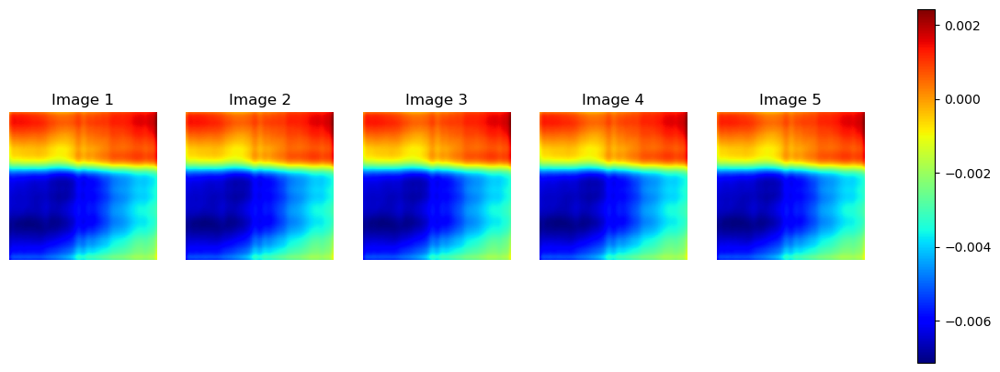

Epoch: 0, time: 3.128, Train Loss: 5.357e-02, Train l2: 1.0074, Test l2: 0.9897
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


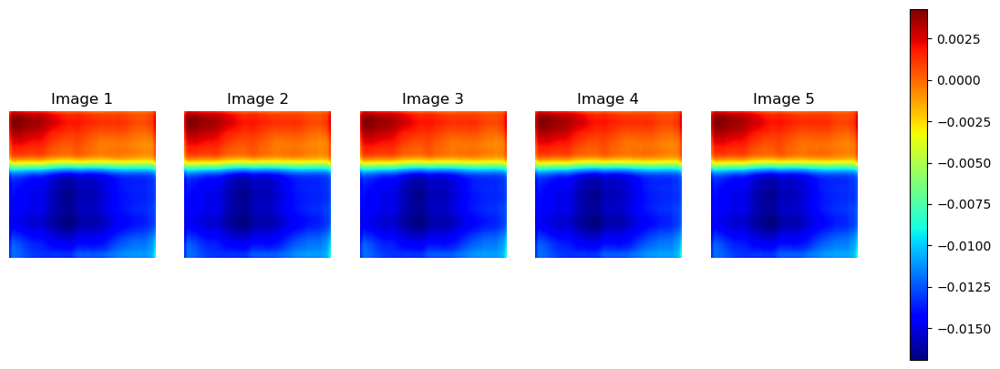

Epoch: 1, time: 2.532, Train Loss: 5.177e-02, Train l2: 0.9897, Test l2: 0.9747
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


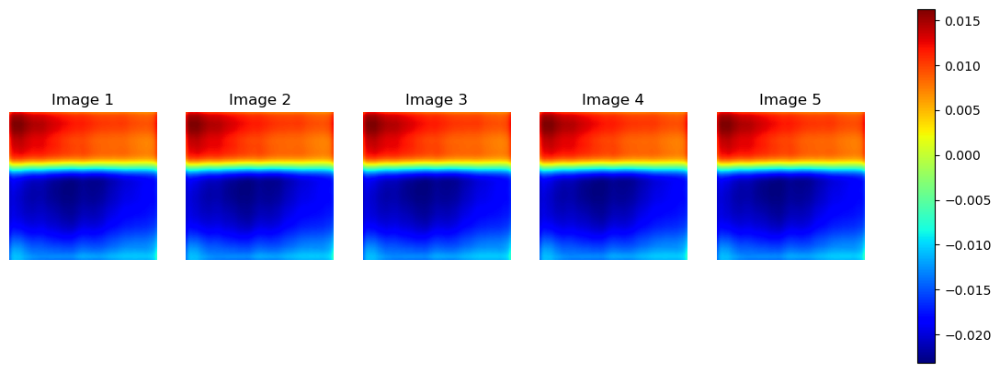

Epoch: 2, time: 2.434, Train Loss: 5.023e-02, Train l2: 0.9747, Test l2: 0.9489
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


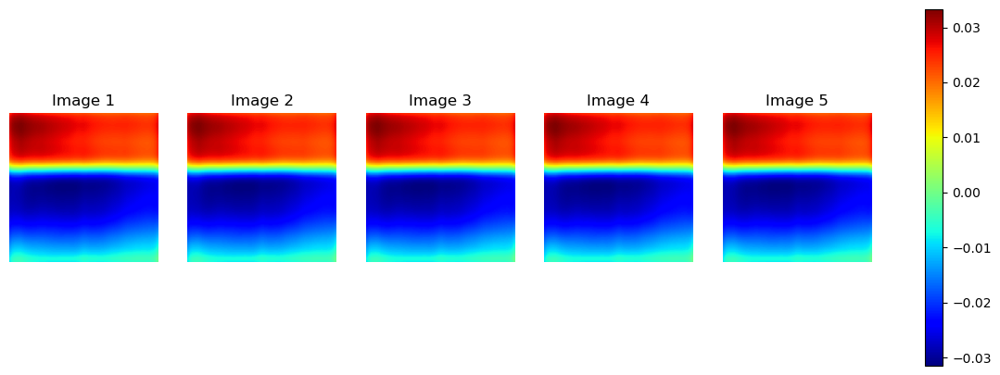

Epoch: 3, time: 2.579, Train Loss: 4.767e-02, Train l2: 0.9489, Test l2: 0.9115
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


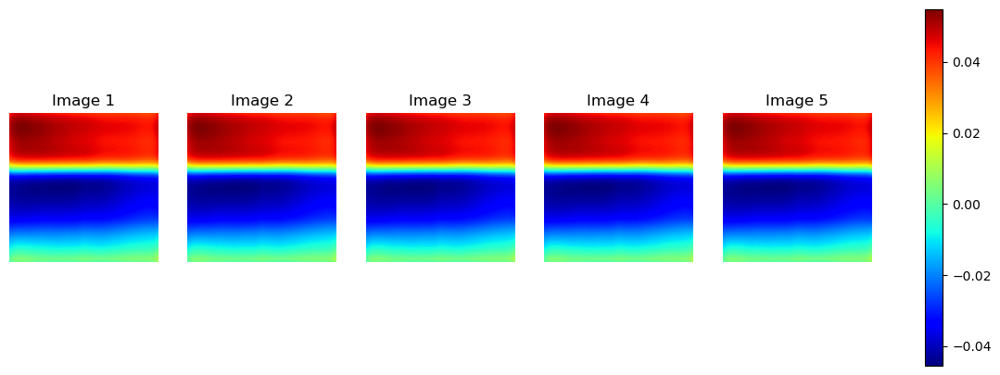

Epoch: 4, time: 2.463, Train Loss: 4.407e-02, Train l2: 0.9115, Test l2: 0.8588
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


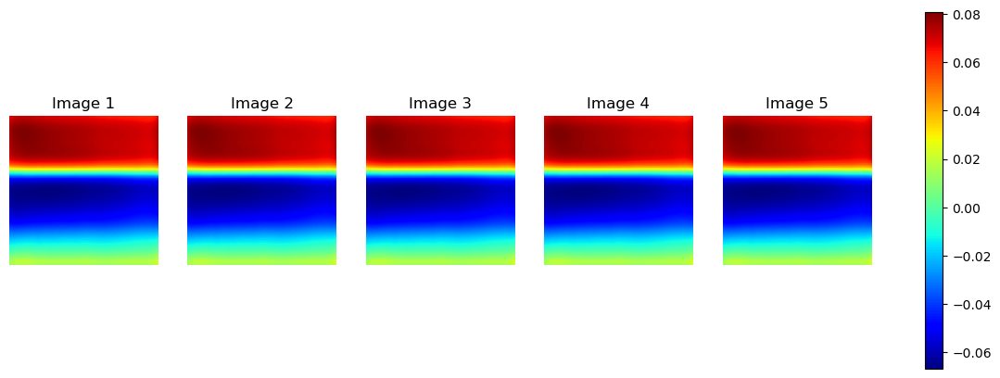

Epoch: 5, time: 2.482, Train Loss: 3.922e-02, Train l2: 0.8588, Test l2: 0.7872
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


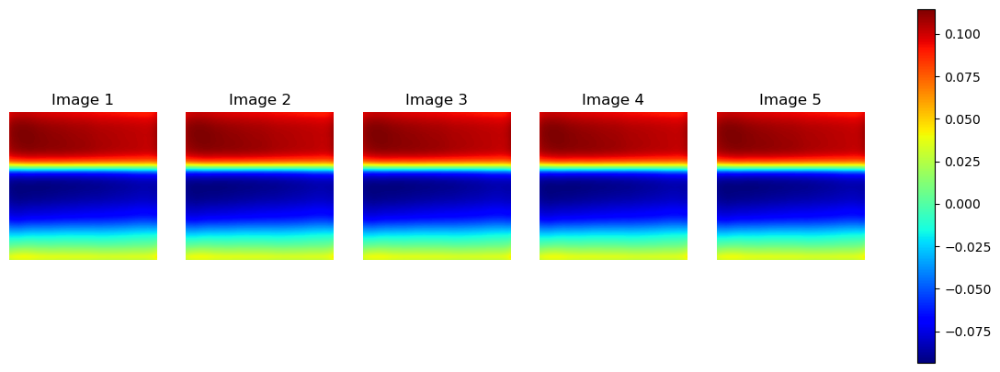

Epoch: 6, time: 2.871, Train Loss: 3.307e-02, Train l2: 0.7872, Test l2: 0.7004
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


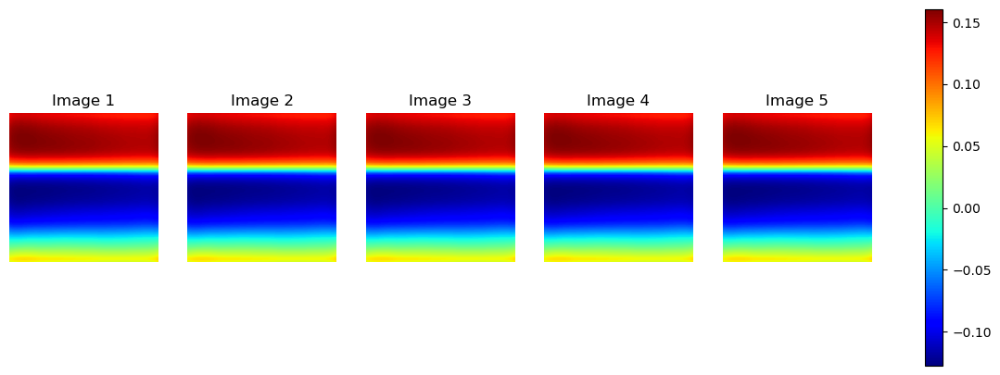

Epoch: 7, time: 2.482, Train Loss: 2.629e-02, Train l2: 0.7004, Test l2: 0.5970
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


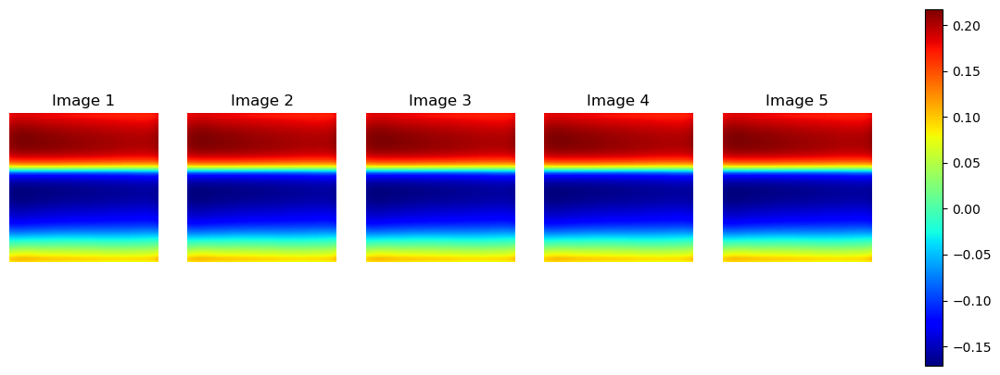

Epoch: 8, time: 2.569, Train Loss: 1.914e-02, Train l2: 0.5970, Test l2: 0.4915
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


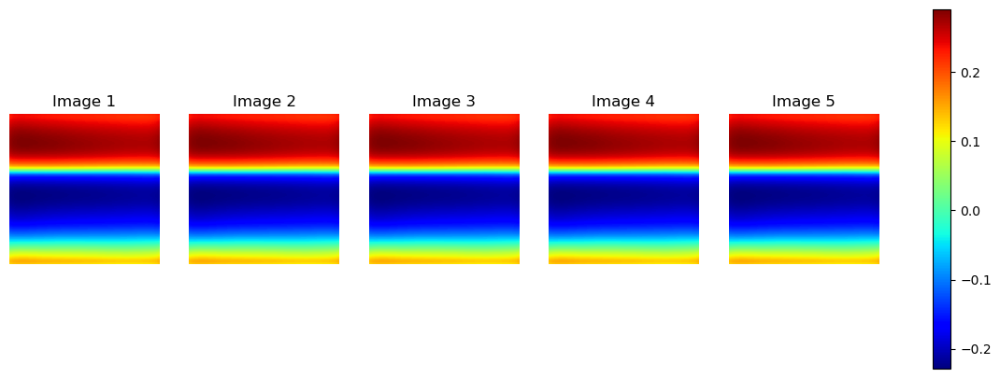

Epoch: 9, time: 2.478, Train Loss: 1.284e-02, Train l2: 0.4915, Test l2: 0.4175
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


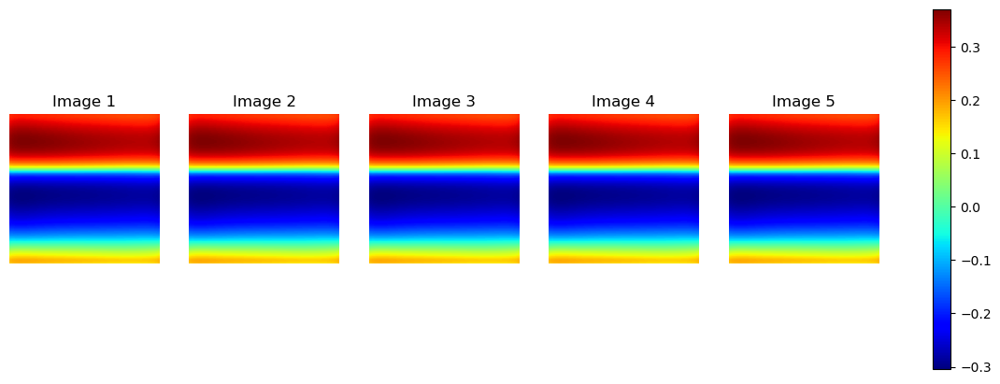

Epoch: 10, time: 2.409, Train Loss: 8.886e-03, Train l2: 0.4175, Test l2: 0.4360
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


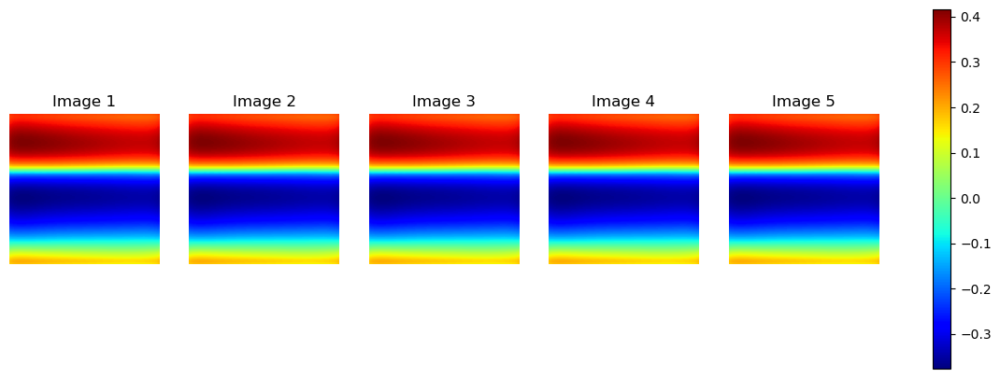

Epoch: 11, time: 2.437, Train Loss: 9.502e-03, Train l2: 0.4360, Test l2: 0.4945
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


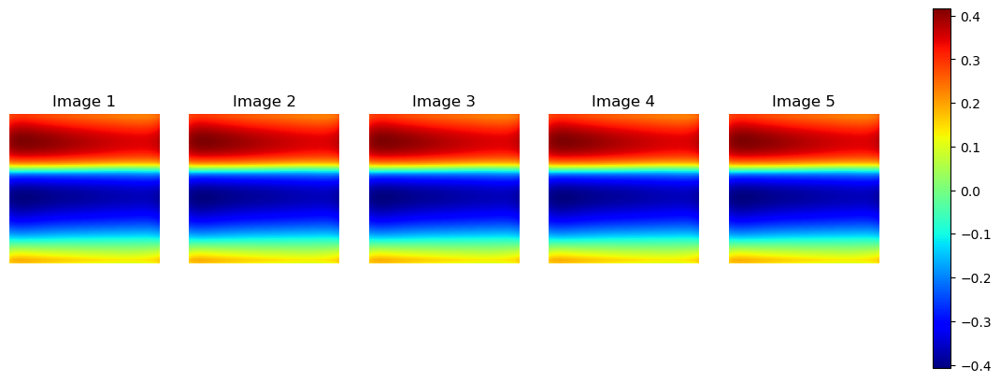

Epoch: 12, time: 2.636, Train Loss: 1.230e-02, Train l2: 0.4945, Test l2: 0.4837
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


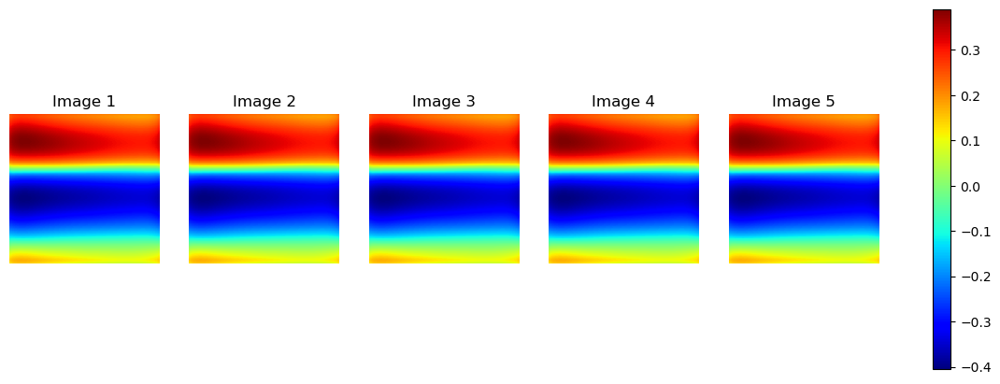

Epoch: 13, time: 2.505, Train Loss: 1.180e-02, Train l2: 0.4837, Test l2: 0.4156
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


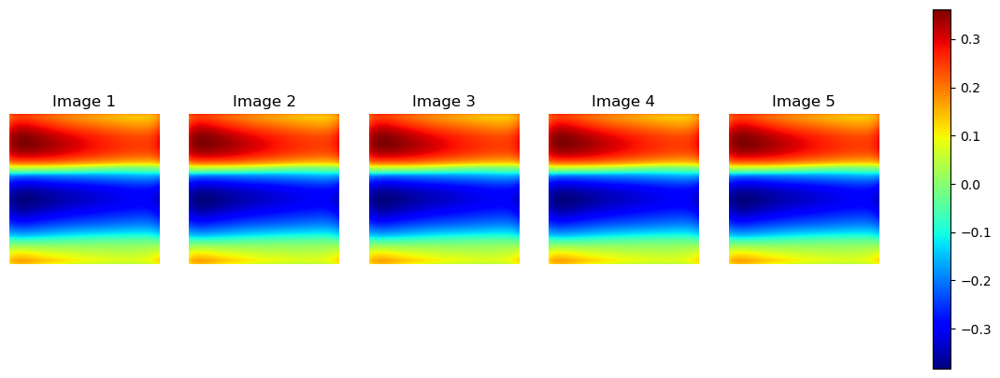

Epoch: 14, time: 2.413, Train Loss: 8.700e-03, Train l2: 0.4156, Test l2: 0.3450
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


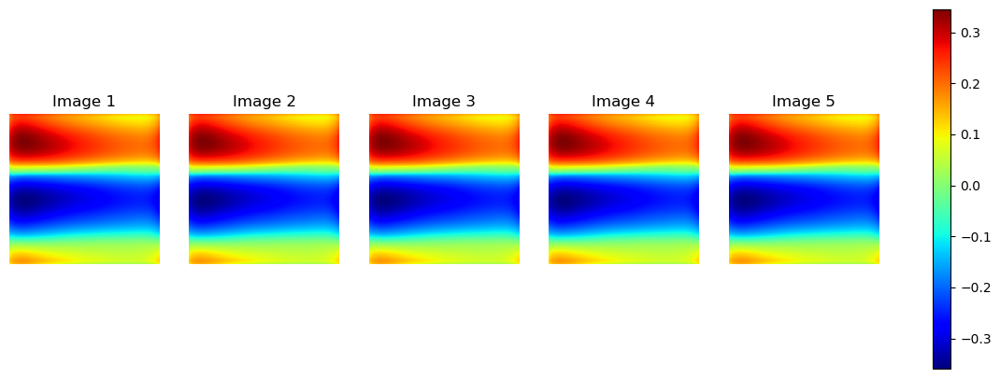

Epoch: 15, time: 2.442, Train Loss: 5.976e-03, Train l2: 0.3450, Test l2: 0.3056
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


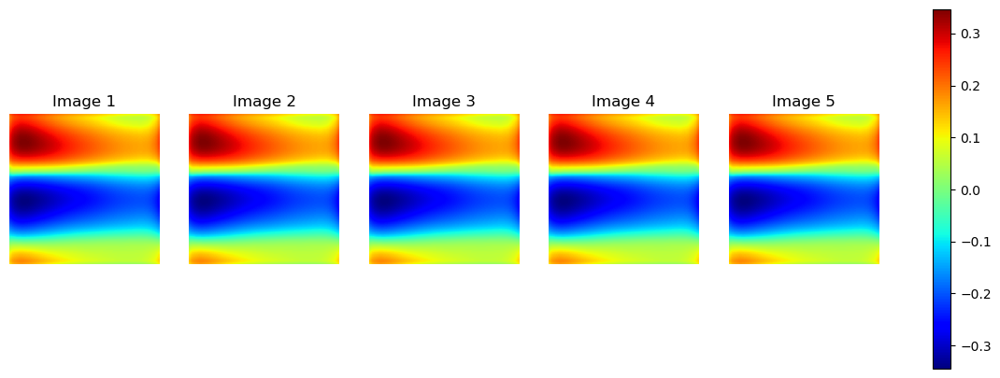

Epoch: 16, time: 2.424, Train Loss: 4.811e-03, Train l2: 0.3056, Test l2: 0.2947
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


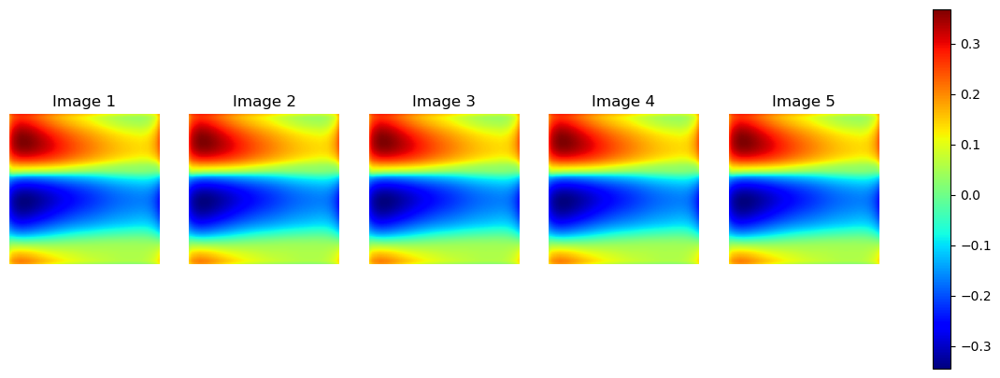

Epoch: 17, time: 2.545, Train Loss: 4.757e-03, Train l2: 0.2947, Test l2: 0.2913
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


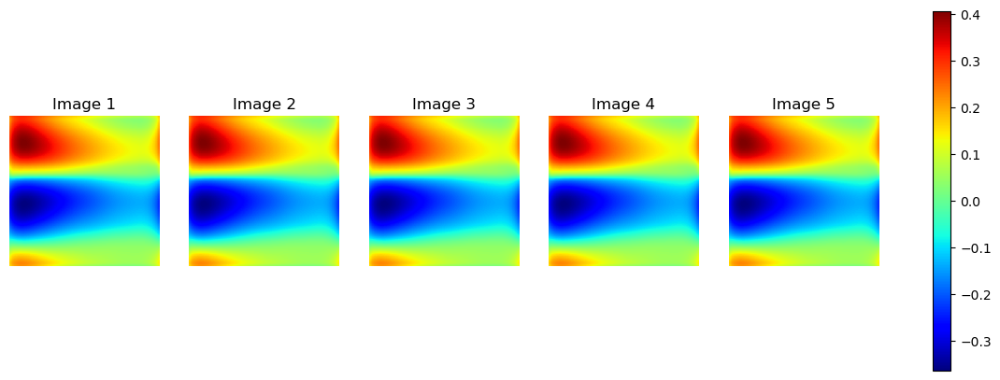

Epoch: 18, time: 2.599, Train Loss: 4.916e-03, Train l2: 0.2913, Test l2: 0.2813
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


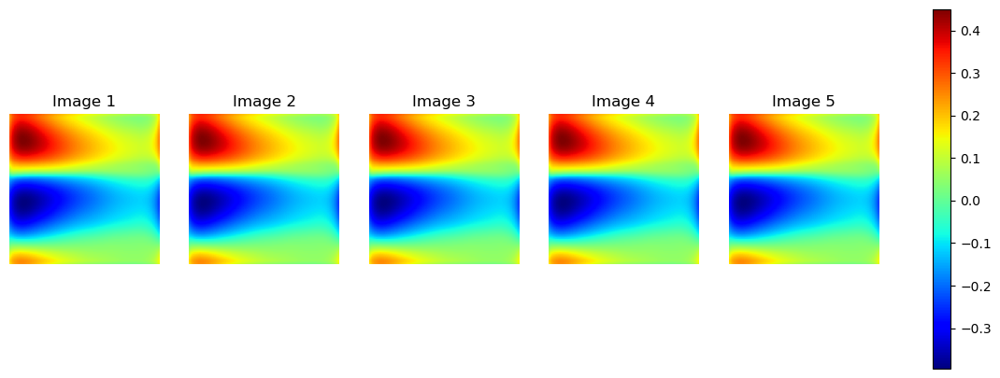

Epoch: 19, time: 2.440, Train Loss: 4.765e-03, Train l2: 0.2813, Test l2: 0.2637
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


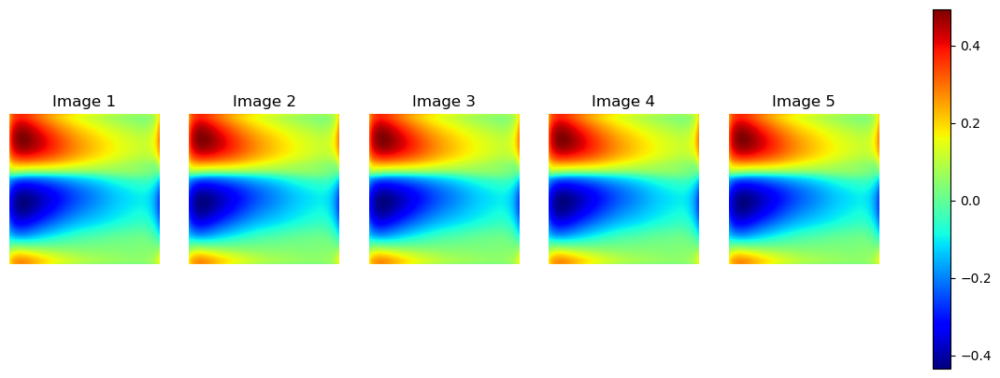

Epoch: 20, time: 2.414, Train Loss: 4.276e-03, Train l2: 0.2637, Test l2: 0.2435
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


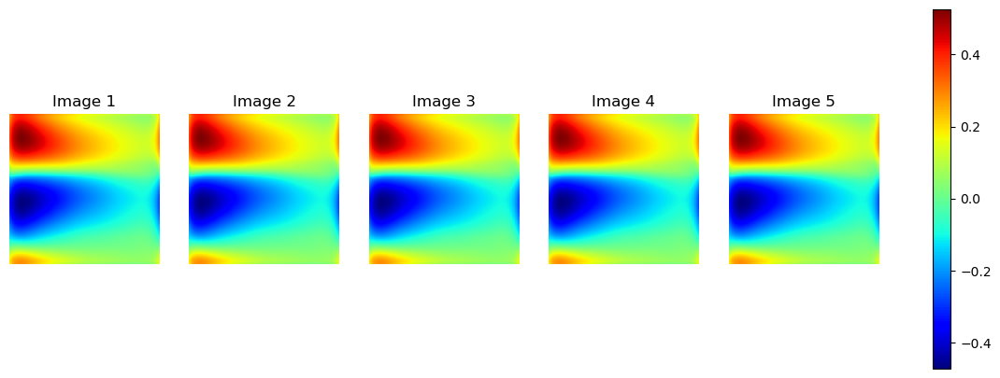

Epoch: 21, time: 2.444, Train Loss: 3.624e-03, Train l2: 0.2435, Test l2: 0.2263
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


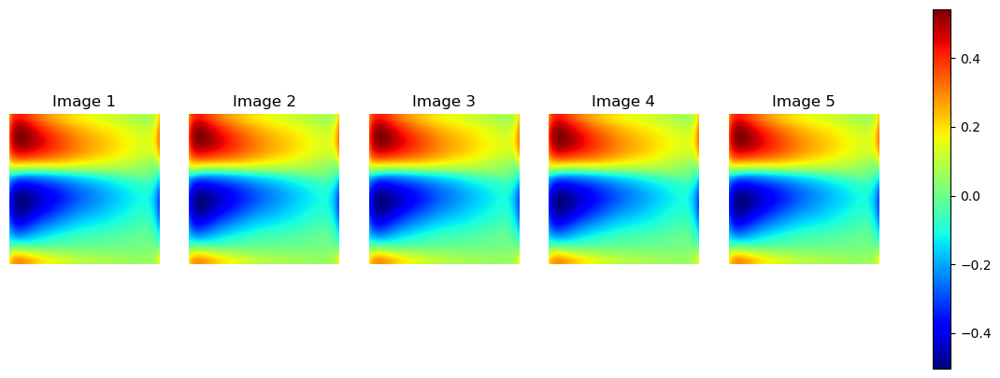

Epoch: 22, time: 2.446, Train Loss: 3.016e-03, Train l2: 0.2263, Test l2: 0.2175
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


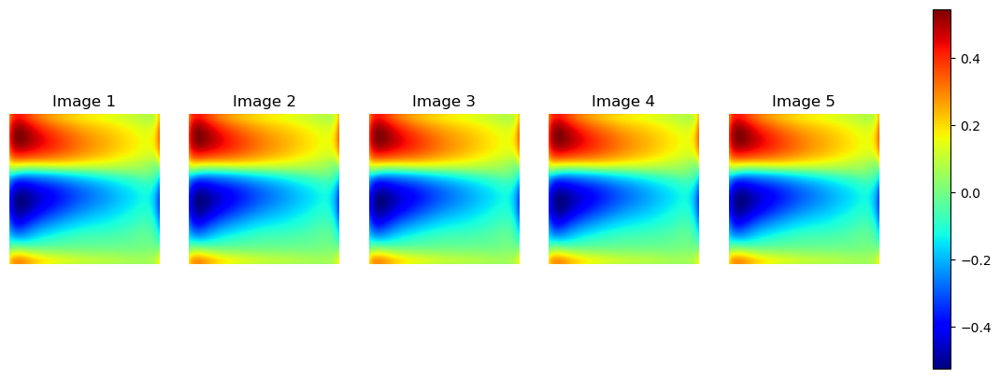

Epoch: 23, time: 2.470, Train Loss: 2.644e-03, Train l2: 0.2175, Test l2: 0.2199
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


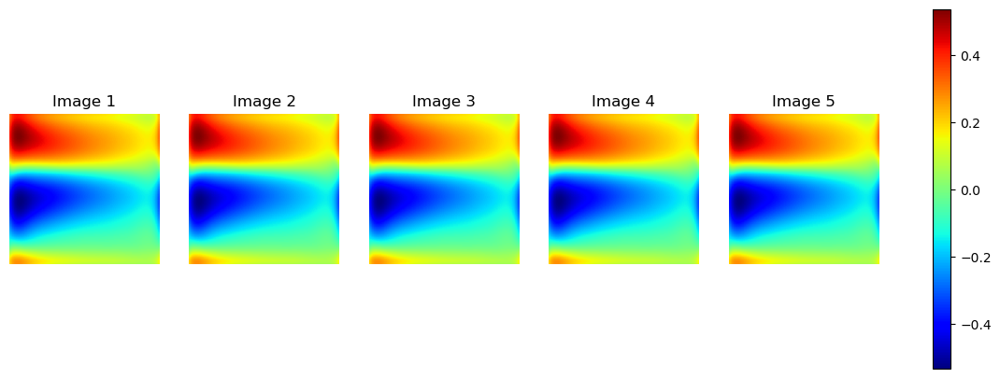

Epoch: 24, time: 2.425, Train Loss: 2.596e-03, Train l2: 0.2199, Test l2: 0.2277
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


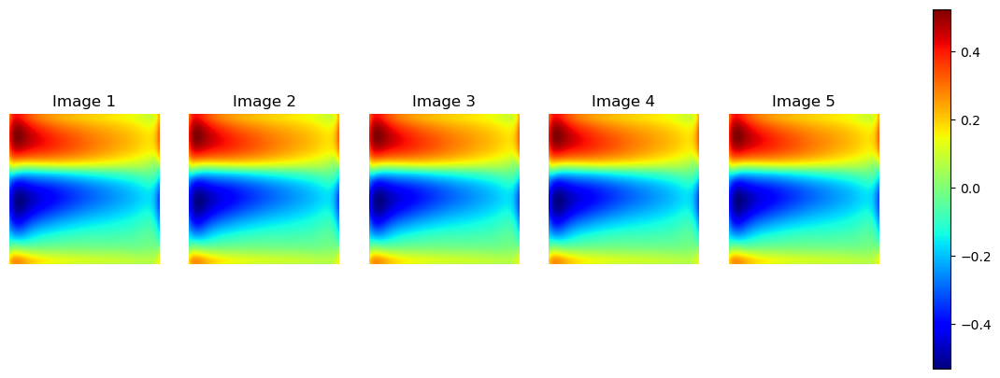

Epoch: 25, time: 2.586, Train Loss: 2.732e-03, Train l2: 0.2277, Test l2: 0.2305
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


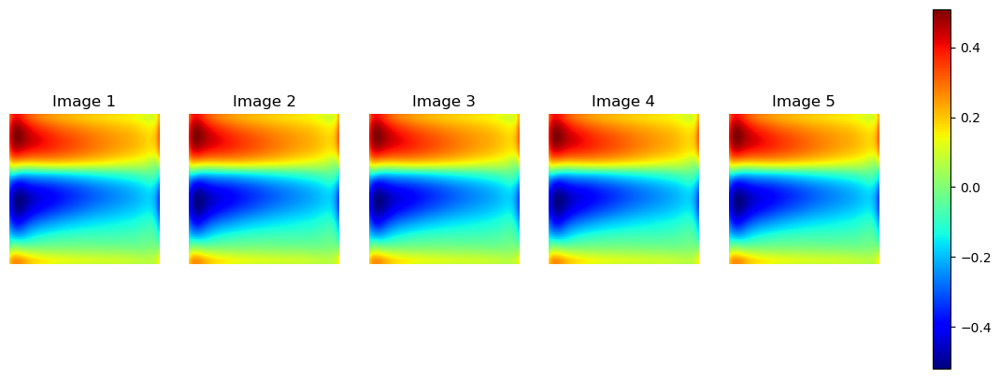

Epoch: 26, time: 2.510, Train Loss: 2.791e-03, Train l2: 0.2305, Test l2: 0.2242
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


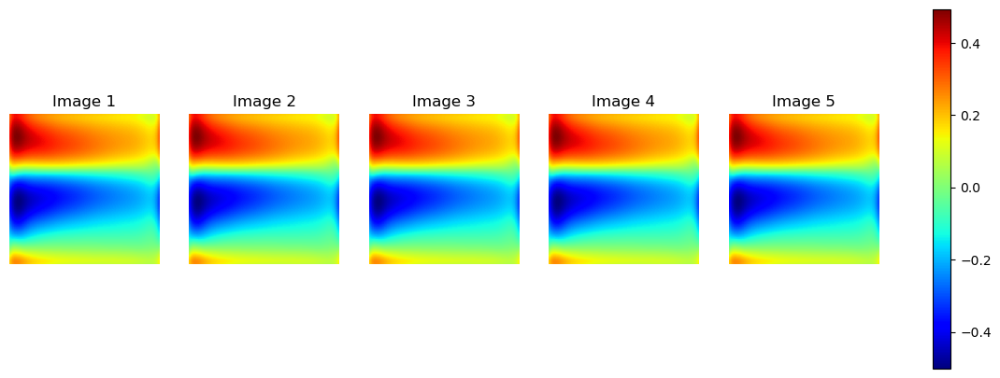

Epoch: 27, time: 2.485, Train Loss: 2.656e-03, Train l2: 0.2242, Test l2: 0.2133
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


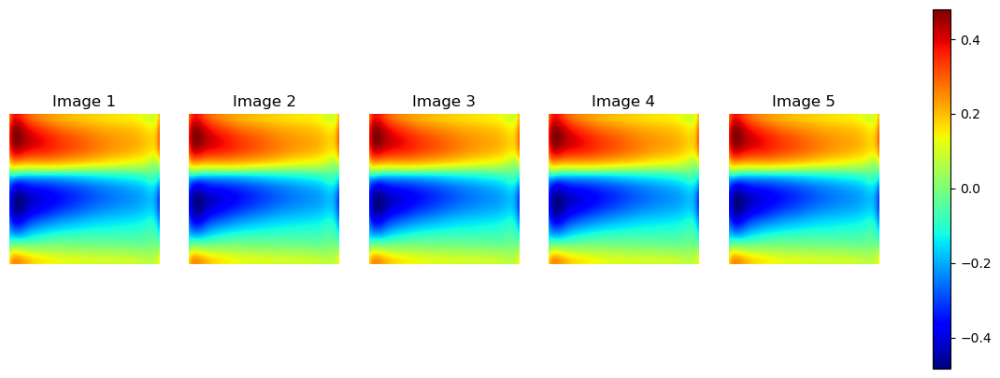

Epoch: 28, time: 2.405, Train Loss: 2.430e-03, Train l2: 0.2133, Test l2: 0.2050
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


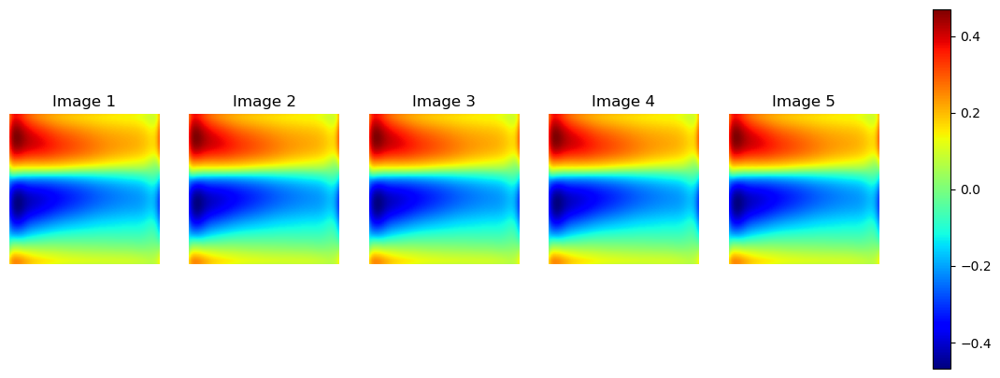

Epoch: 29, time: 2.434, Train Loss: 2.273e-03, Train l2: 0.2050, Test l2: 0.2027
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


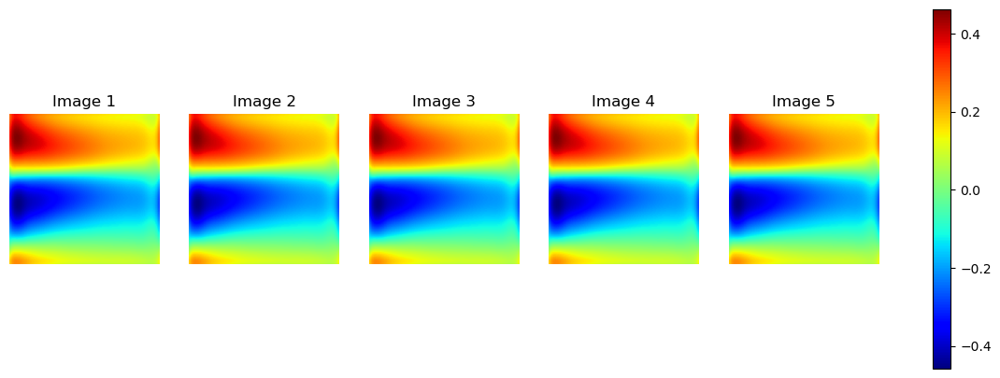

Epoch: 30, time: 2.399, Train Loss: 2.248e-03, Train l2: 0.2027, Test l2: 0.2029
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


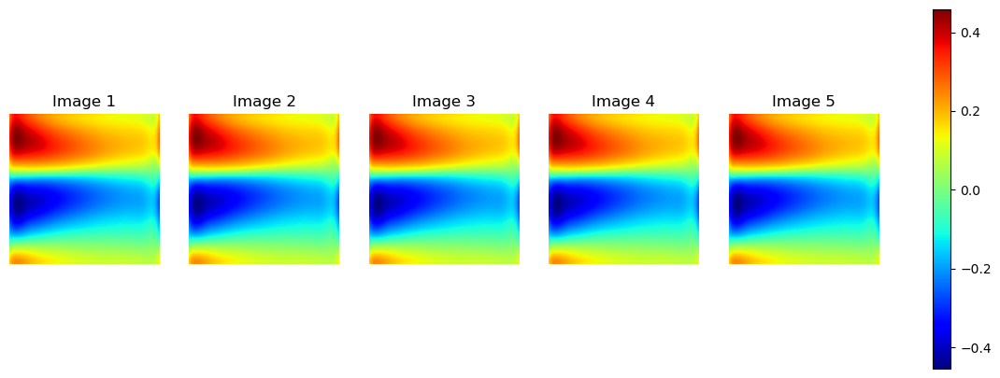

Epoch: 31, time: 2.613, Train Loss: 2.292e-03, Train l2: 0.2029, Test l2: 0.2011
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


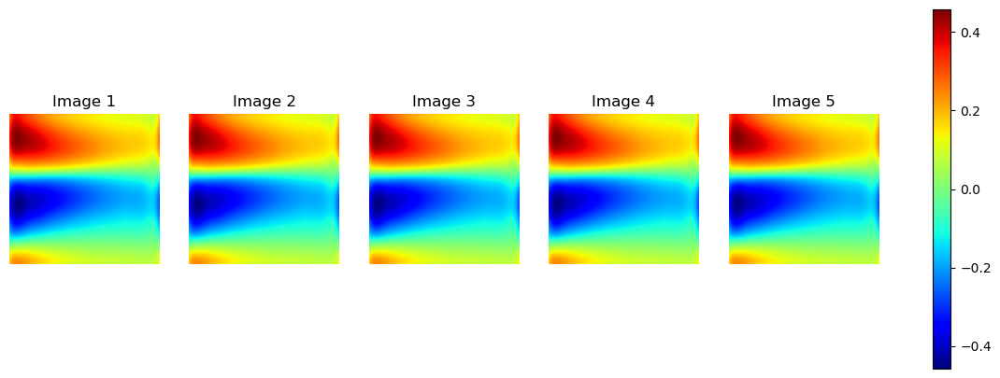

Epoch: 32, time: 2.413, Train Loss: 2.302e-03, Train l2: 0.2011, Test l2: 0.1958
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


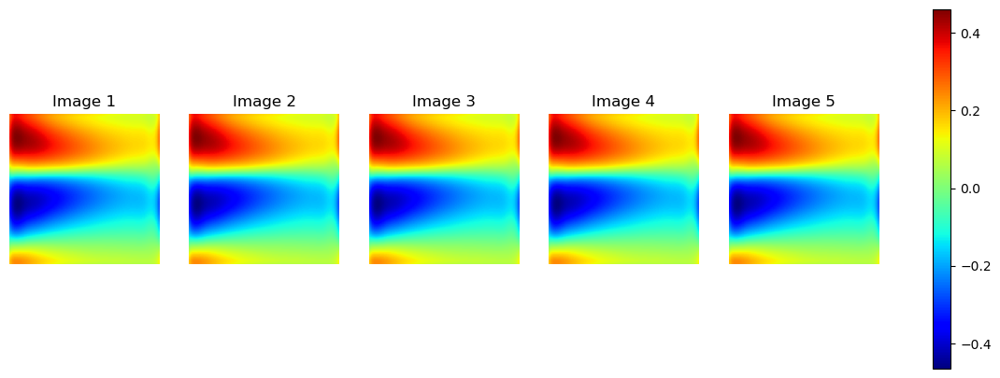

Epoch: 33, time: 2.479, Train Loss: 2.237e-03, Train l2: 0.1958, Test l2: 0.1889
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


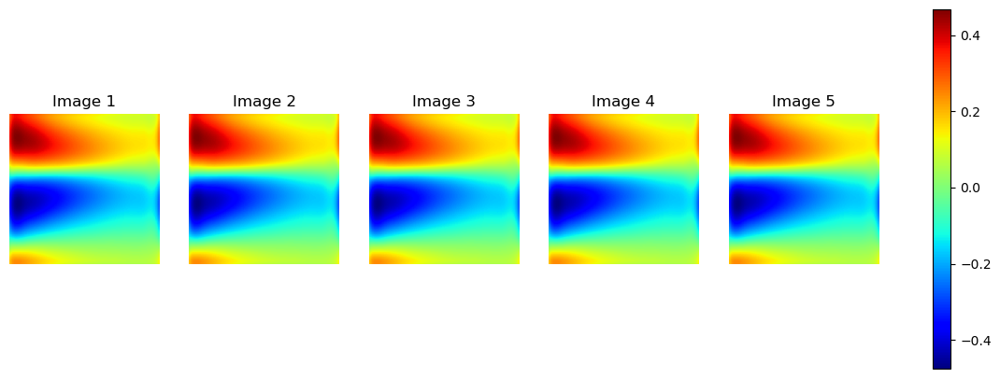

Epoch: 34, time: 2.439, Train Loss: 2.126e-03, Train l2: 0.1889, Test l2: 0.1841
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


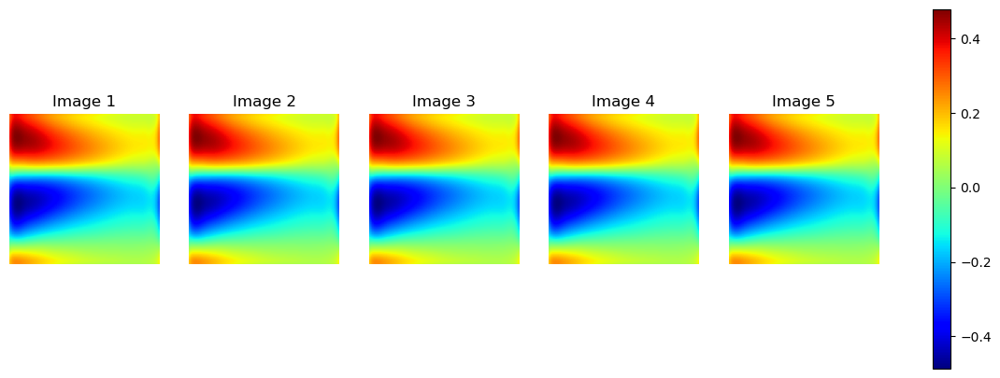

Epoch: 35, time: 2.515, Train Loss: 2.030e-03, Train l2: 0.1841, Test l2: 0.1832
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


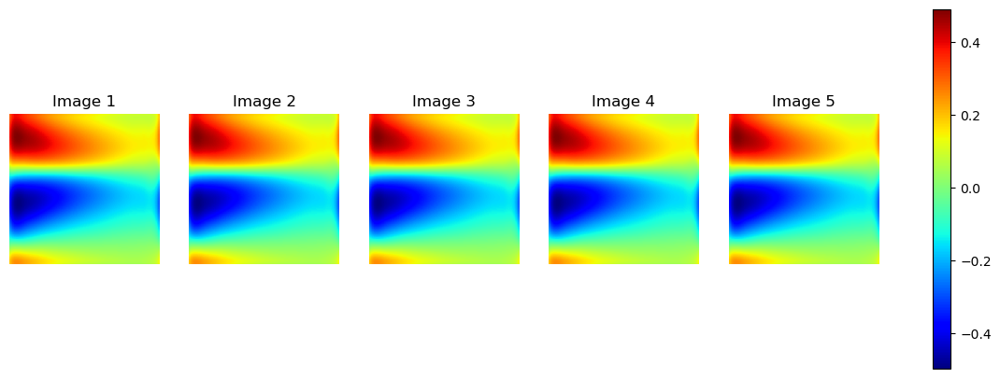

Epoch: 36, time: 2.457, Train Loss: 1.985e-03, Train l2: 0.1832, Test l2: 0.1853
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


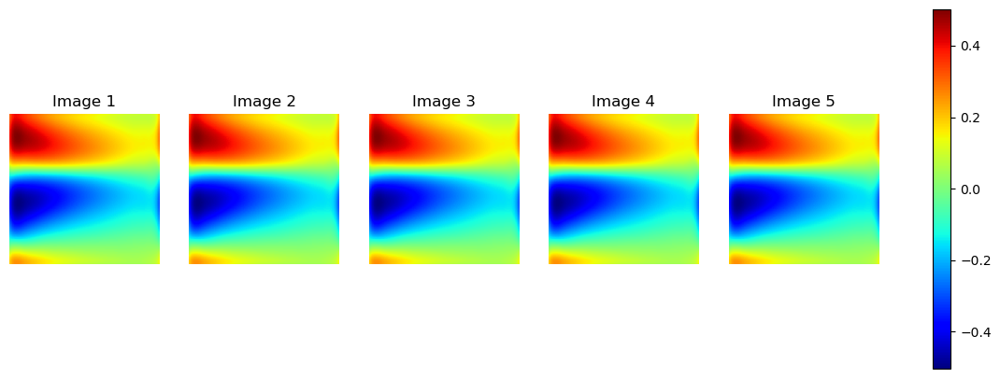

Epoch: 37, time: 2.424, Train Loss: 1.986e-03, Train l2: 0.1853, Test l2: 0.1877
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


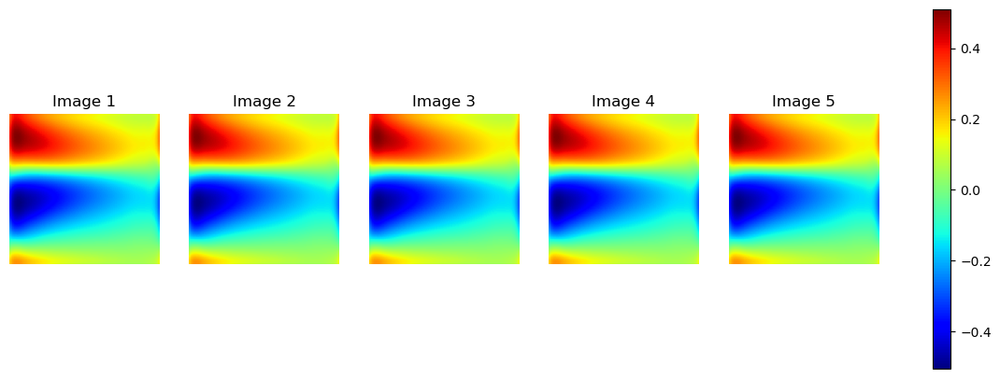

Epoch: 38, time: 2.587, Train Loss: 1.998e-03, Train l2: 0.1877, Test l2: 0.1885
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


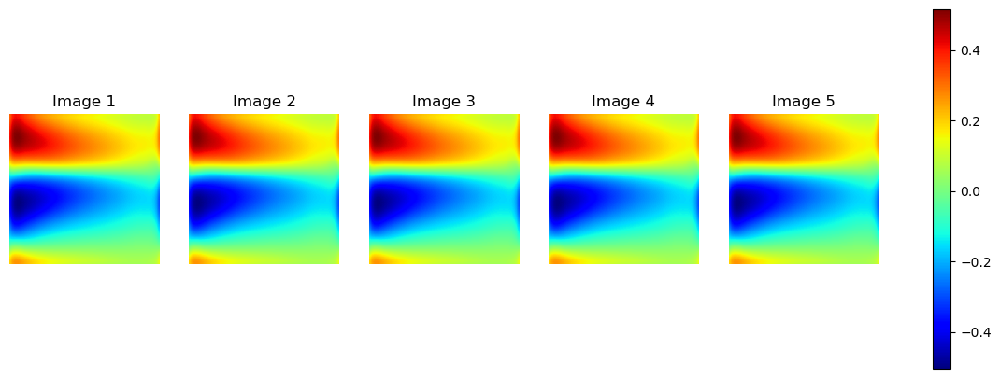

Epoch: 39, time: 2.446, Train Loss: 1.993e-03, Train l2: 0.1885, Test l2: 0.1871
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


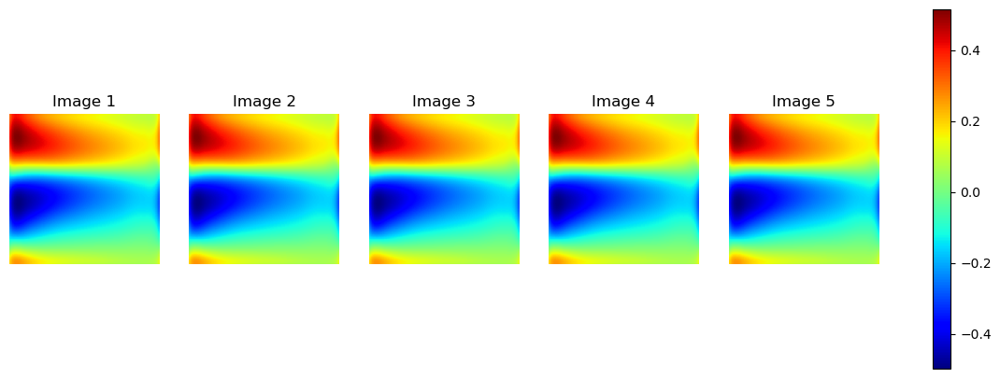

Epoch: 40, time: 2.420, Train Loss: 1.963e-03, Train l2: 0.1871, Test l2: 0.1845
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


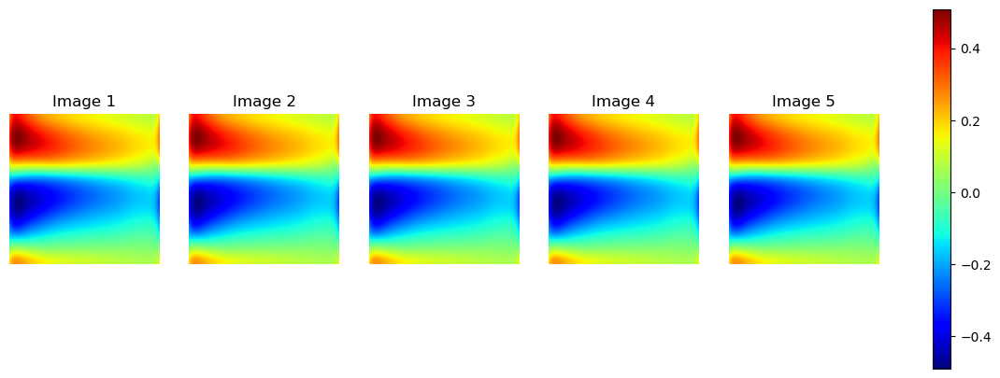

Epoch: 41, time: 2.424, Train Loss: 1.920e-03, Train l2: 0.1845, Test l2: 0.1820
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


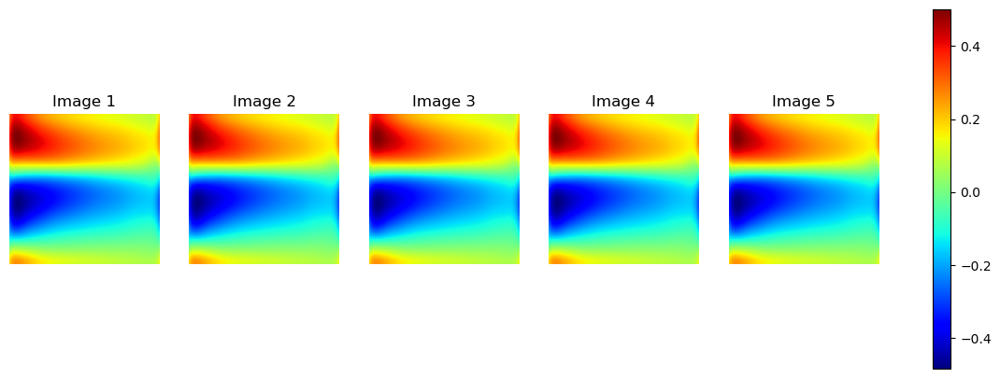

Epoch: 42, time: 2.397, Train Loss: 1.885e-03, Train l2: 0.1820, Test l2: 0.1805
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


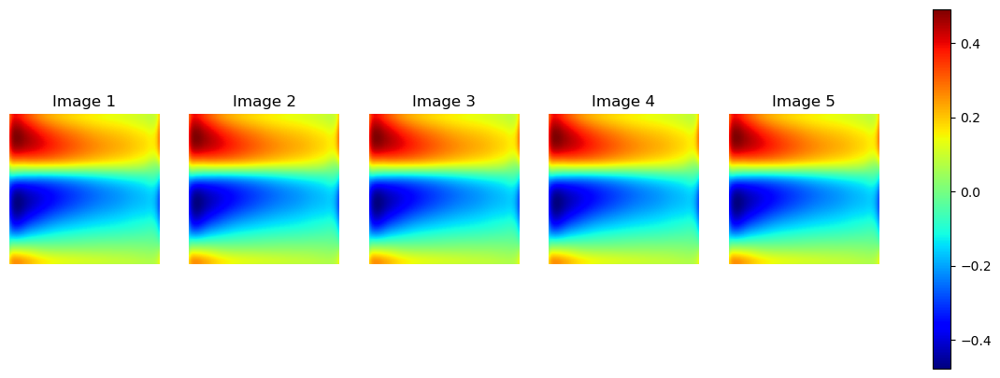

Epoch: 43, time: 2.448, Train Loss: 1.872e-03, Train l2: 0.1805, Test l2: 0.1801
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


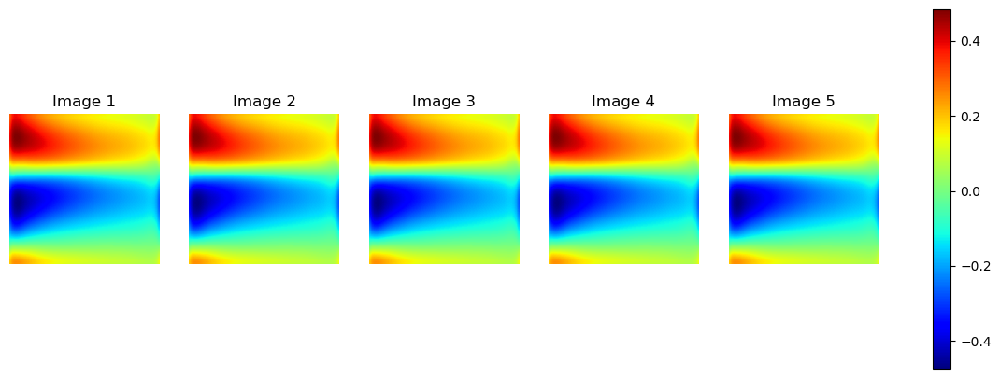

Epoch: 44, time: 2.590, Train Loss: 1.880e-03, Train l2: 0.1801, Test l2: 0.1799
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


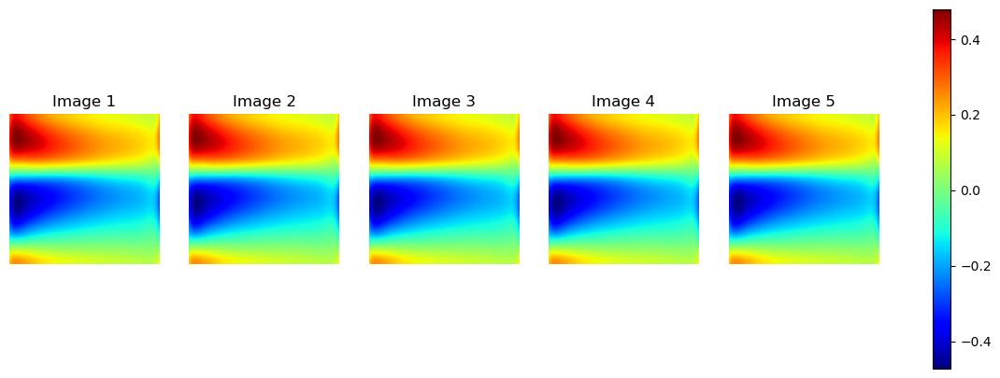

Epoch: 45, time: 2.547, Train Loss: 1.891e-03, Train l2: 0.1799, Test l2: 0.1790
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


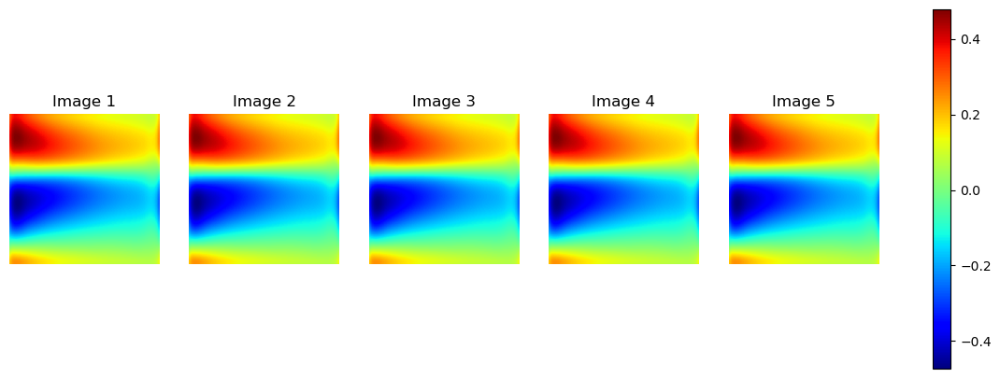

Epoch: 46, time: 2.416, Train Loss: 1.887e-03, Train l2: 0.1790, Test l2: 0.1774
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


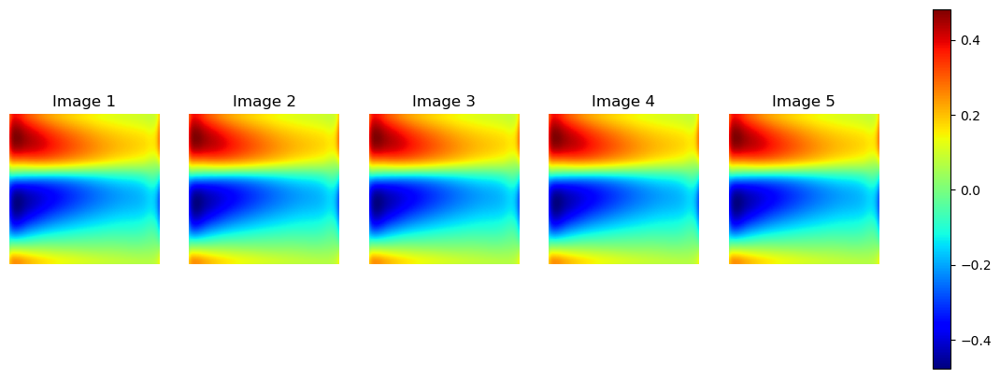

Epoch: 47, time: 2.453, Train Loss: 1.863e-03, Train l2: 0.1774, Test l2: 0.1757
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


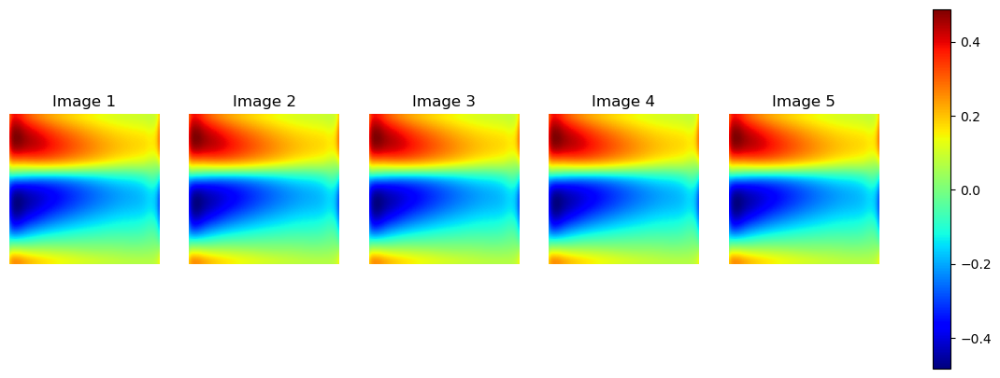

Epoch: 48, time: 2.434, Train Loss: 1.829e-03, Train l2: 0.1757, Test l2: 0.1747
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


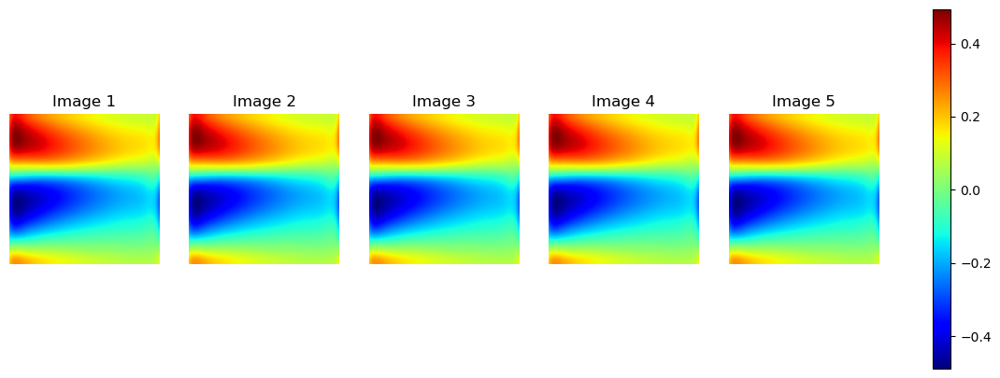

Epoch: 49, time: 2.417, Train Loss: 1.801e-03, Train l2: 0.1747, Test l2: 0.1746
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


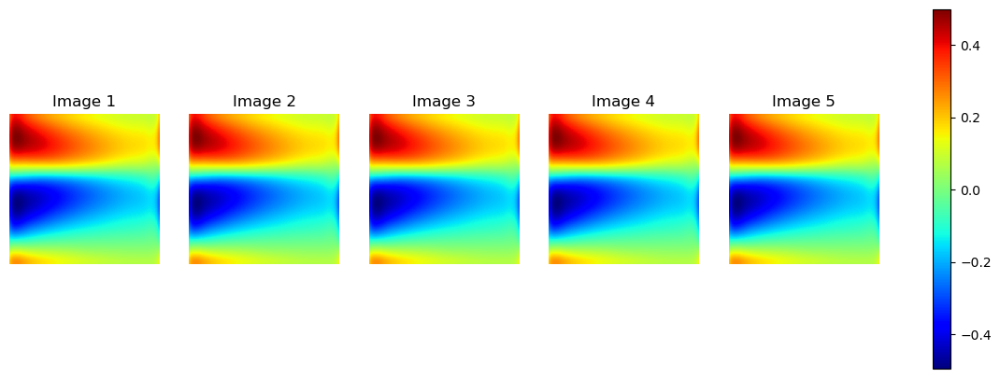

Epoch: 50, time: 2.446, Train Loss: 1.789e-03, Train l2: 0.1746, Test l2: 0.1749
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


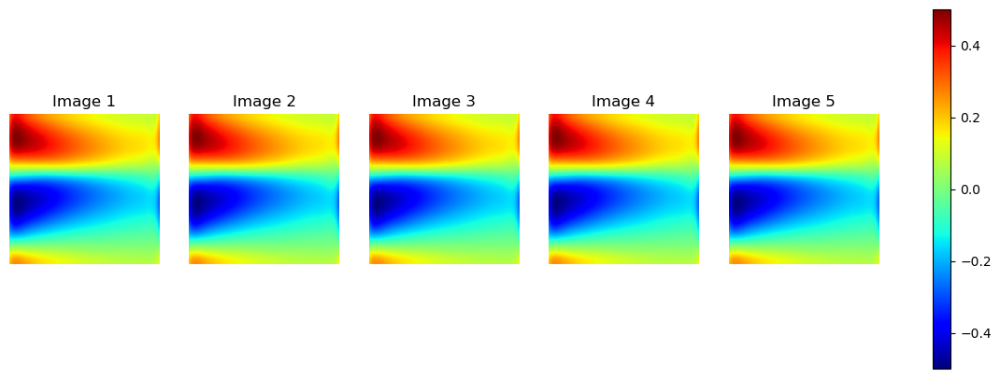

Epoch: 51, time: 2.629, Train Loss: 1.786e-03, Train l2: 0.1749, Test l2: 0.1748
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


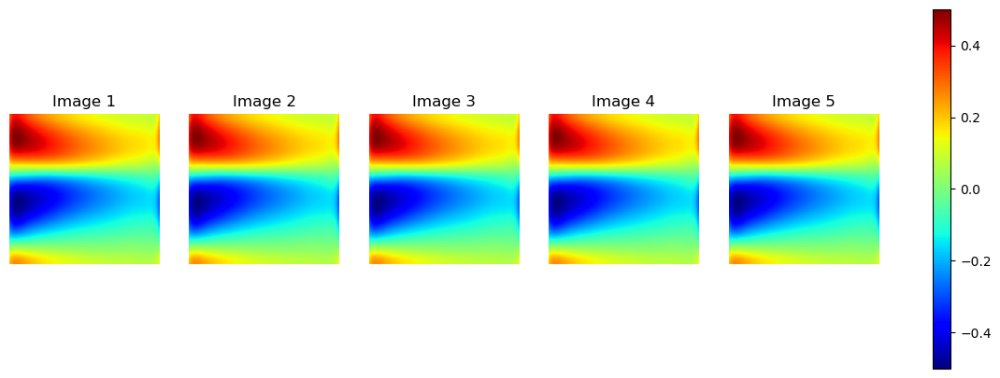

Epoch: 52, time: 2.731, Train Loss: 1.781e-03, Train l2: 0.1748, Test l2: 0.1738
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


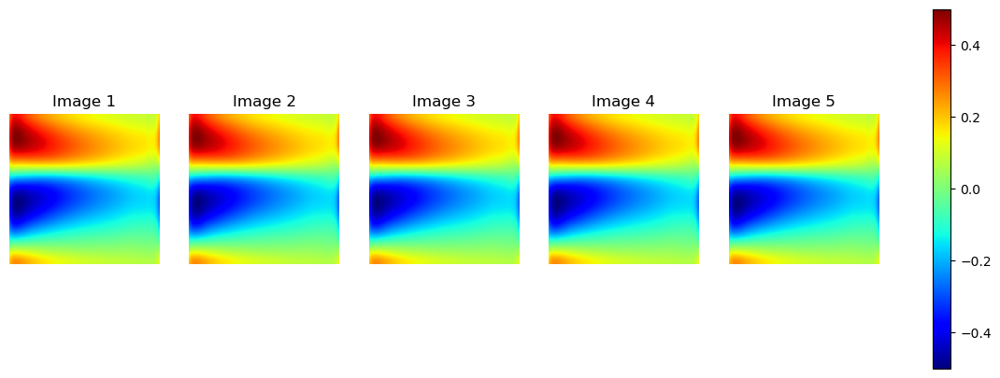

Epoch: 53, time: 2.470, Train Loss: 1.770e-03, Train l2: 0.1738, Test l2: 0.1724
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


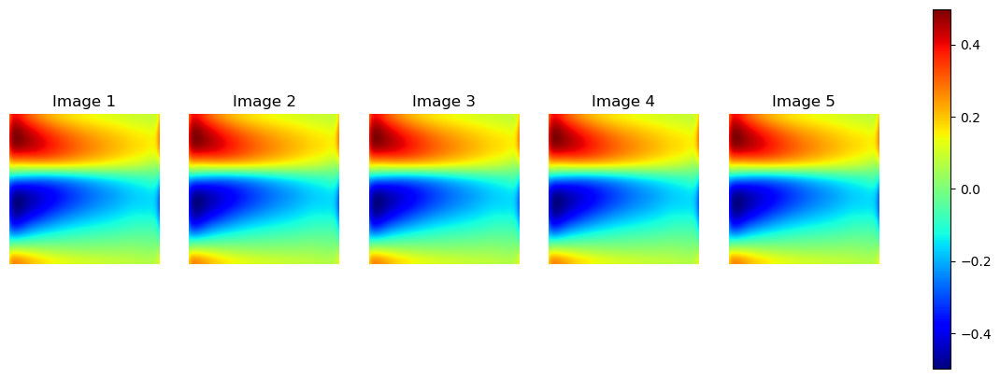

Epoch: 54, time: 2.515, Train Loss: 1.756e-03, Train l2: 0.1724, Test l2: 0.1709
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


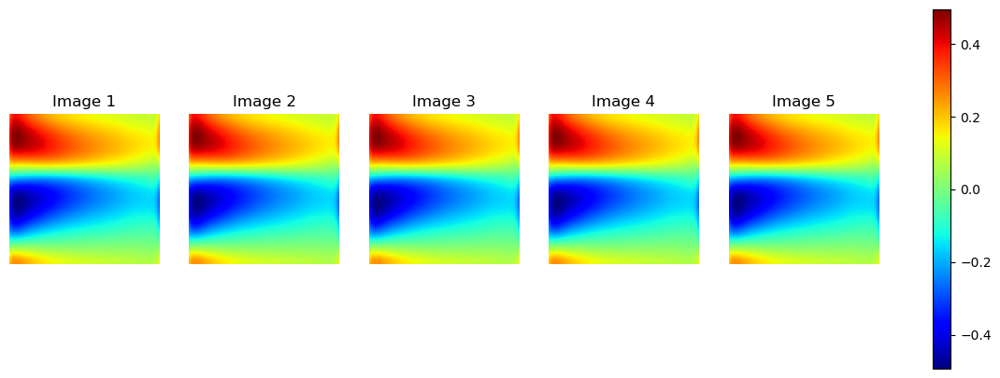

Epoch: 55, time: 2.399, Train Loss: 1.744e-03, Train l2: 0.1709, Test l2: 0.1700
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


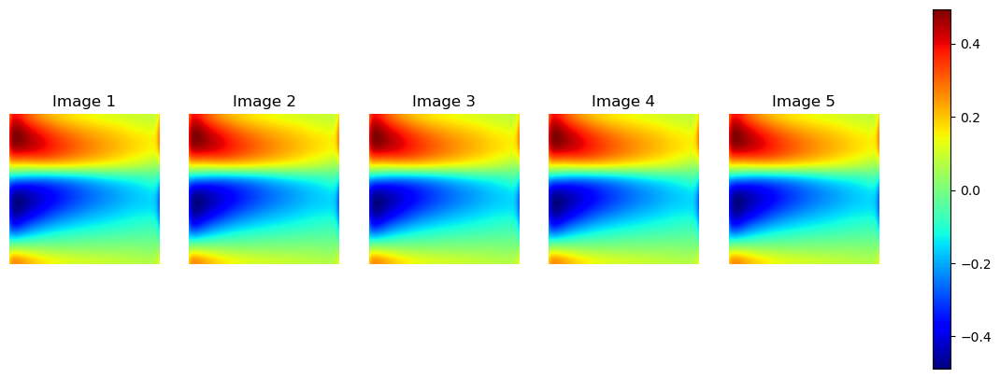

Epoch: 56, time: 2.406, Train Loss: 1.738e-03, Train l2: 0.1700, Test l2: 0.1696
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


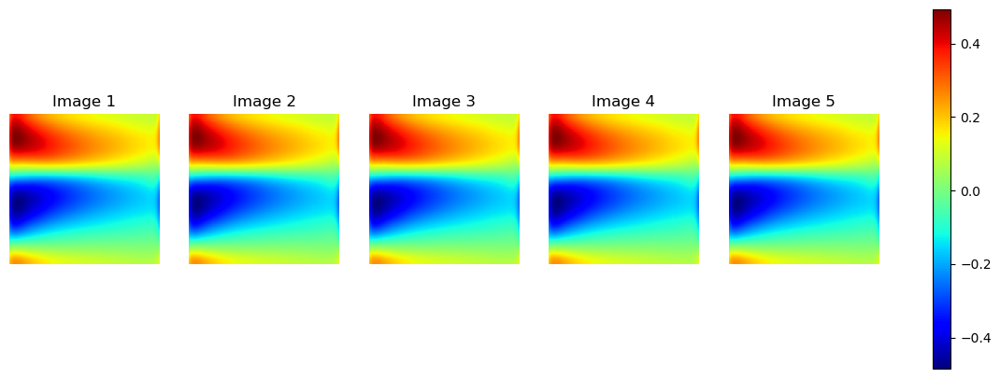

Epoch: 57, time: 2.604, Train Loss: 1.737e-03, Train l2: 0.1696, Test l2: 0.1695
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


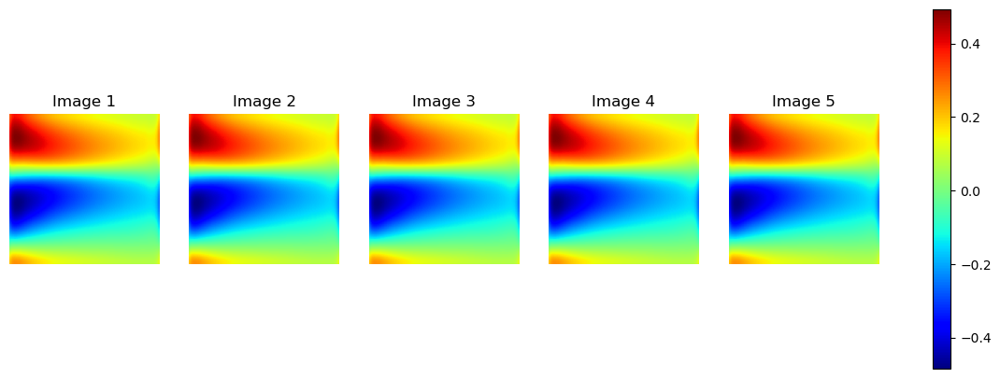

Epoch: 58, time: 2.450, Train Loss: 1.733e-03, Train l2: 0.1695, Test l2: 0.1694
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


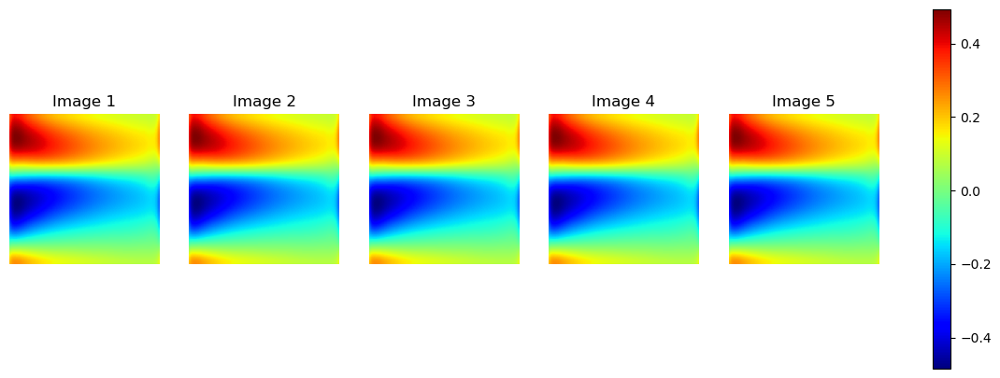

Epoch: 59, time: 2.437, Train Loss: 1.725e-03, Train l2: 0.1694, Test l2: 0.1694
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


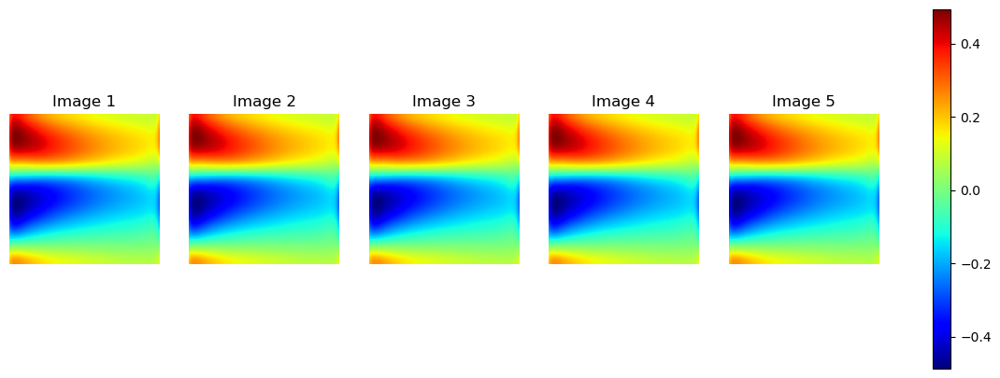

Epoch: 60, time: 2.400, Train Loss: 1.716e-03, Train l2: 0.1694, Test l2: 0.1694
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


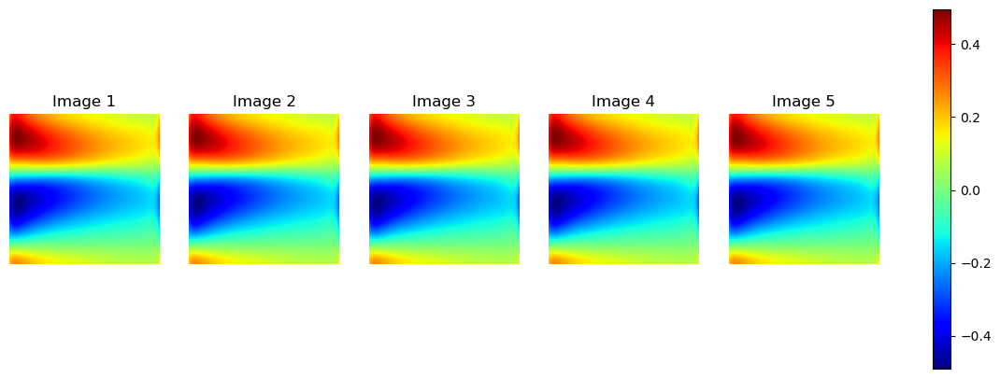

Epoch: 61, time: 2.439, Train Loss: 1.709e-03, Train l2: 0.1694, Test l2: 0.1694
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


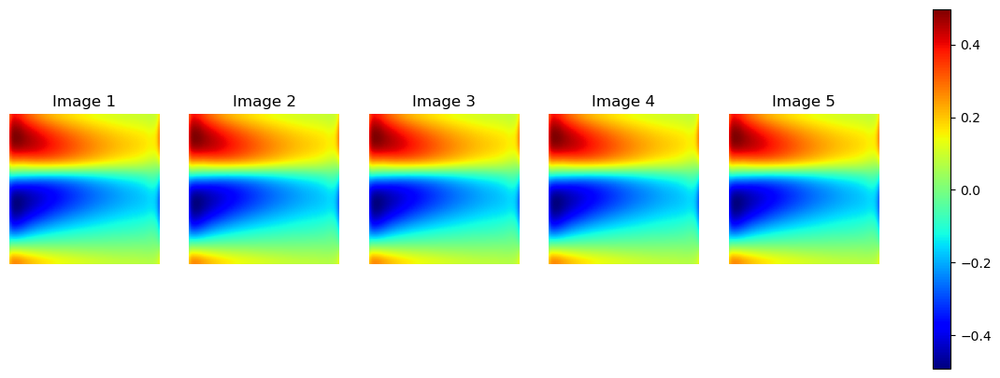

Epoch: 62, time: 2.387, Train Loss: 1.704e-03, Train l2: 0.1694, Test l2: 0.1690
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


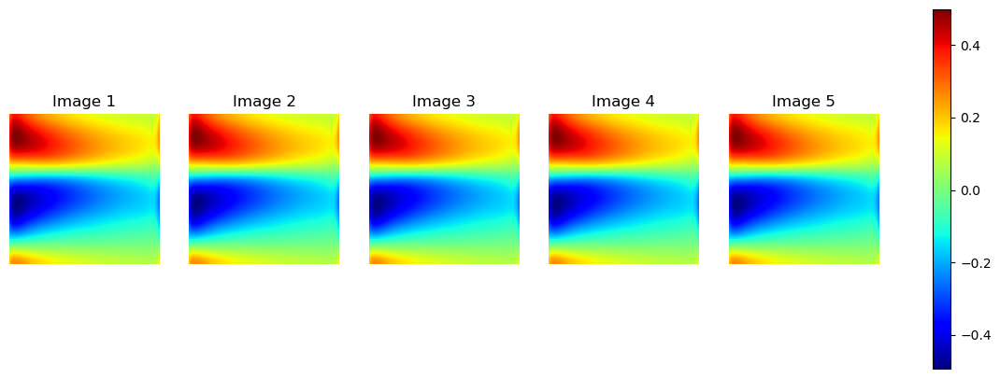

Epoch: 63, time: 2.566, Train Loss: 1.698e-03, Train l2: 0.1690, Test l2: 0.1682
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


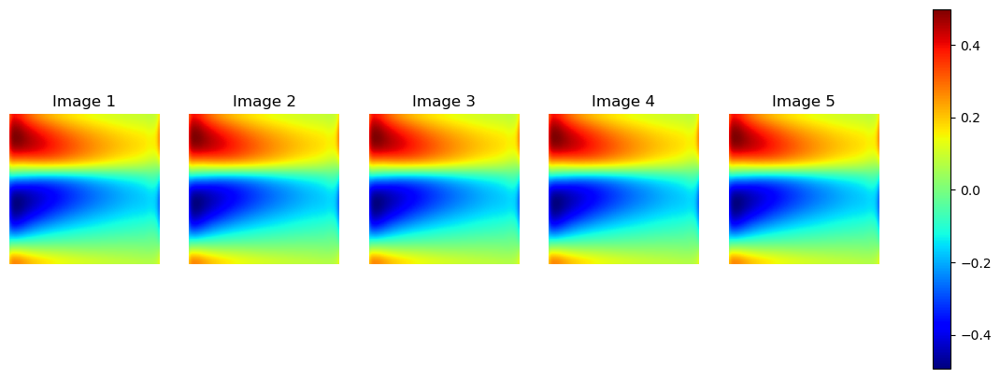

Epoch: 64, time: 2.599, Train Loss: 1.689e-03, Train l2: 0.1682, Test l2: 0.1671
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


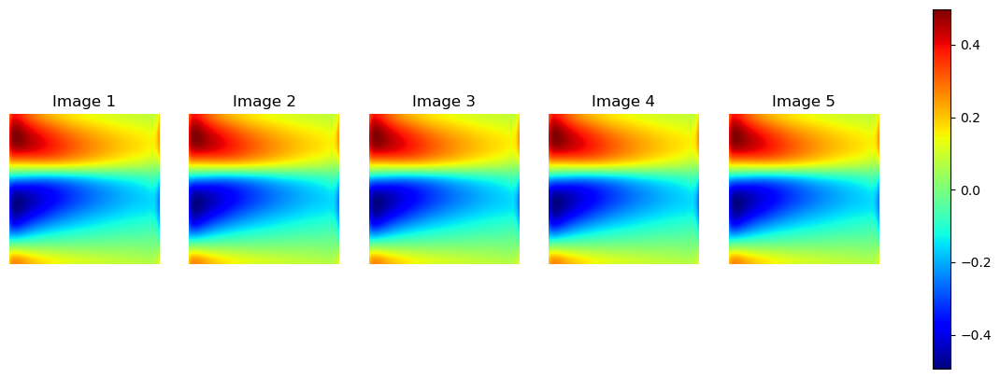

Epoch: 65, time: 2.427, Train Loss: 1.680e-03, Train l2: 0.1671, Test l2: 0.1660
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


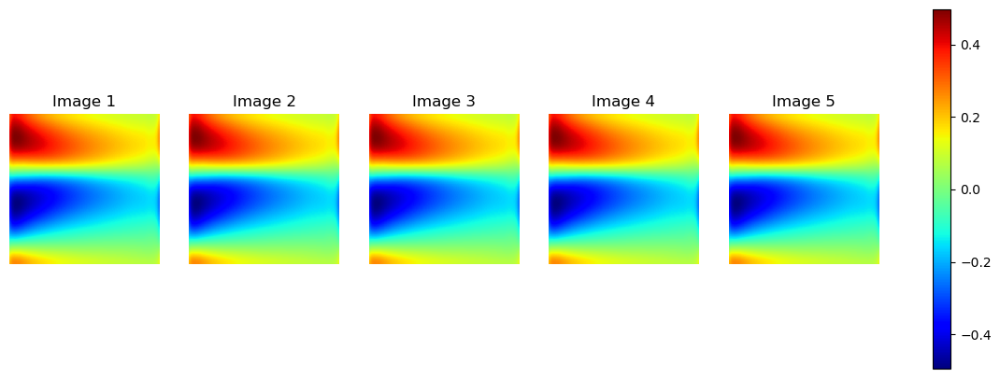

Epoch: 66, time: 2.456, Train Loss: 1.672e-03, Train l2: 0.1660, Test l2: 0.1652
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


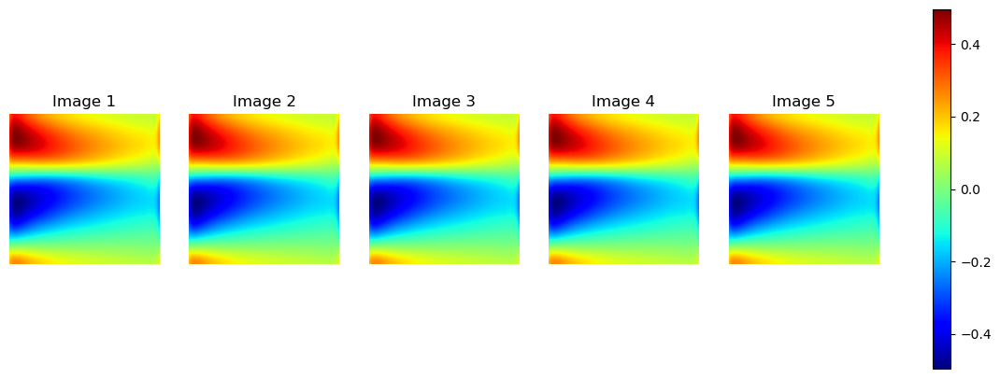

Epoch: 67, time: 2.451, Train Loss: 1.667e-03, Train l2: 0.1652, Test l2: 0.1648
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


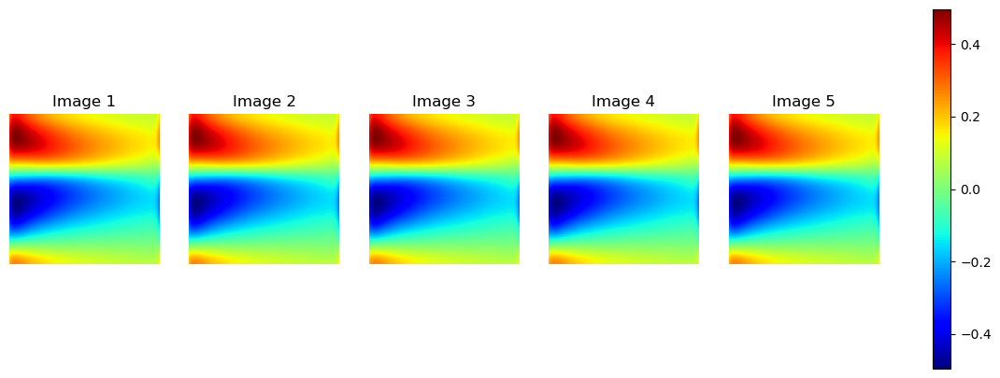

Epoch: 68, time: 2.465, Train Loss: 1.664e-03, Train l2: 0.1648, Test l2: 0.1645
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


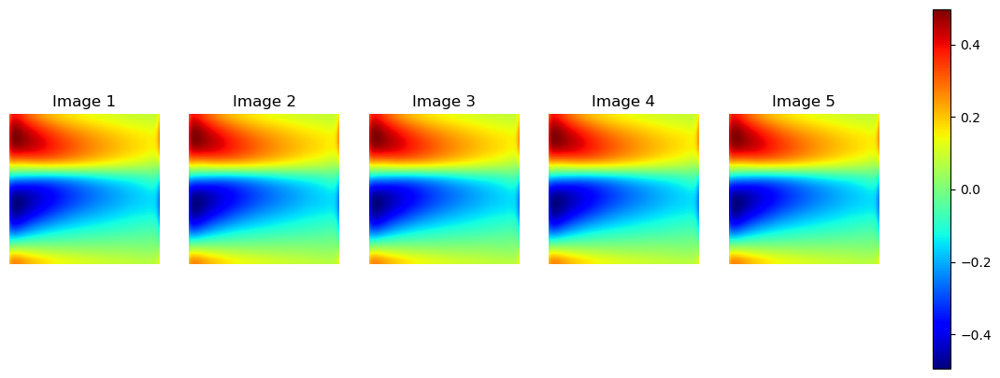

Epoch: 69, time: 2.459, Train Loss: 1.659e-03, Train l2: 0.1645, Test l2: 0.1643
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


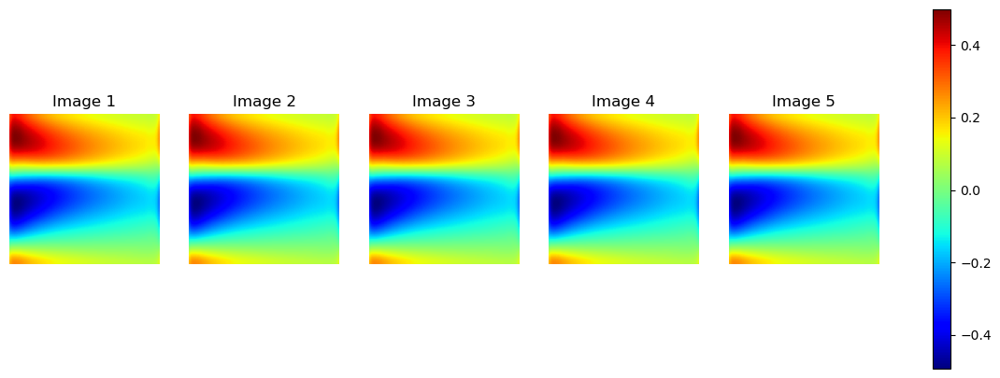

Epoch: 70, time: 2.633, Train Loss: 1.650e-03, Train l2: 0.1643, Test l2: 0.1643
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


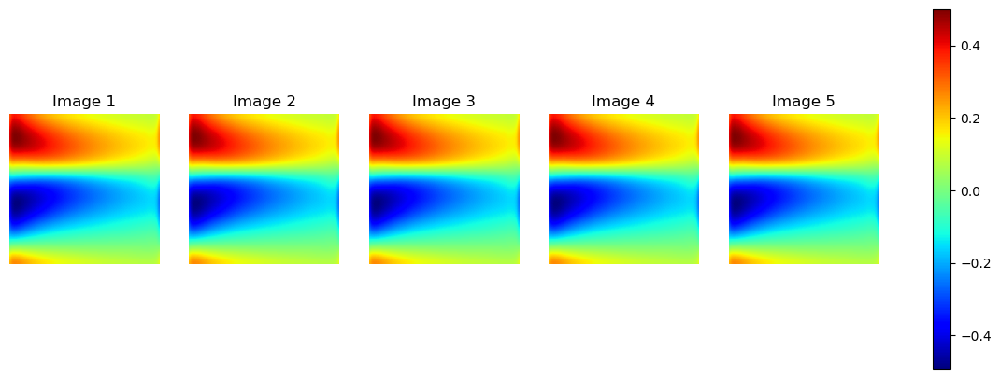

Epoch: 71, time: 2.646, Train Loss: 1.643e-03, Train l2: 0.1643, Test l2: 0.1644
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


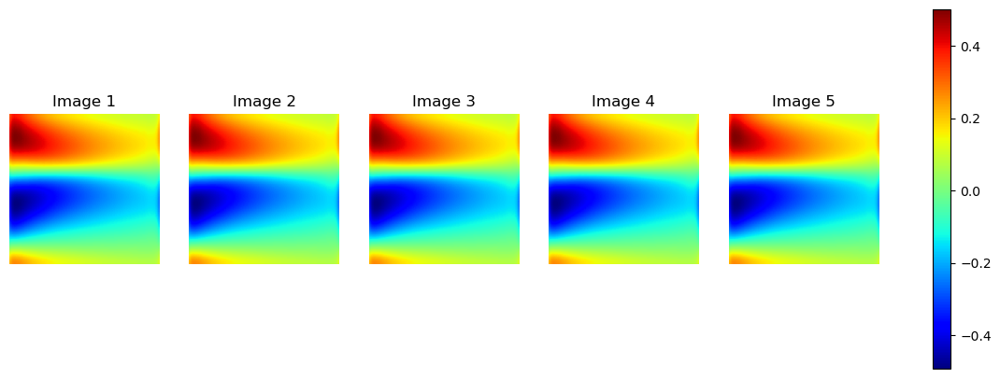

Epoch: 72, time: 2.570, Train Loss: 1.638e-03, Train l2: 0.1644, Test l2: 0.1643
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


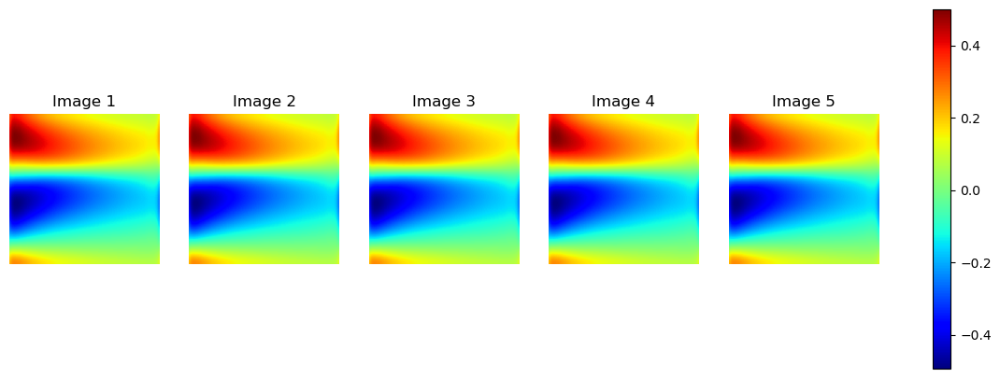

Epoch: 73, time: 2.596, Train Loss: 1.635e-03, Train l2: 0.1643, Test l2: 0.1639
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


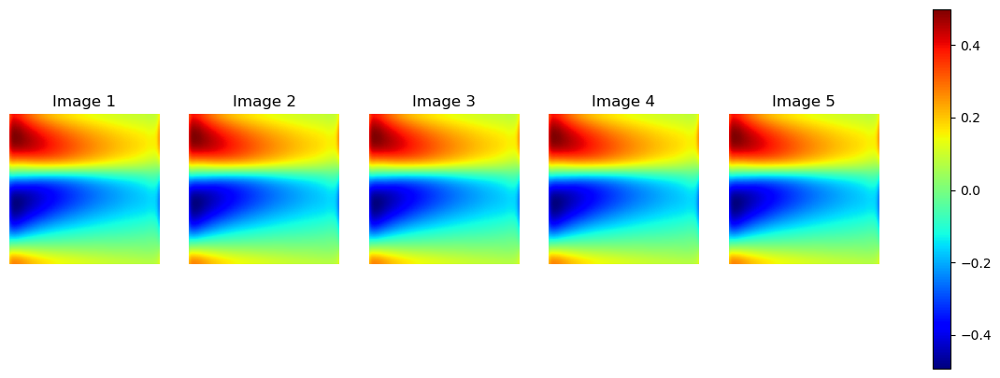

Epoch: 74, time: 2.591, Train Loss: 1.629e-03, Train l2: 0.1639, Test l2: 0.1632
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


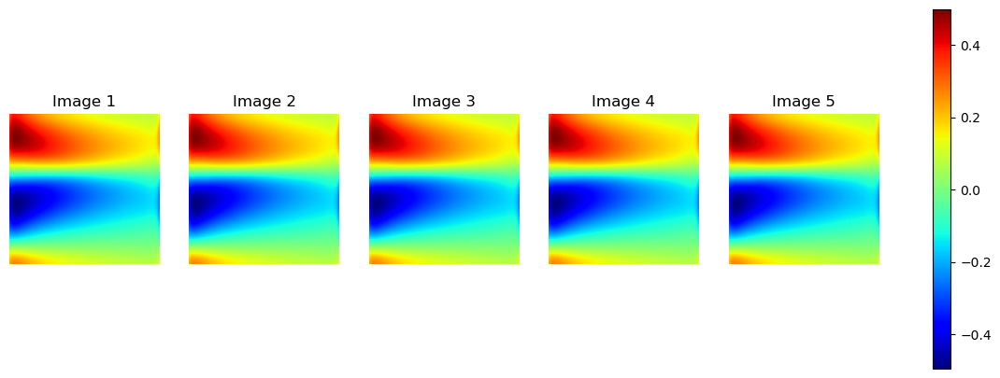

Epoch: 75, time: 2.464, Train Loss: 1.623e-03, Train l2: 0.1632, Test l2: 0.1624
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


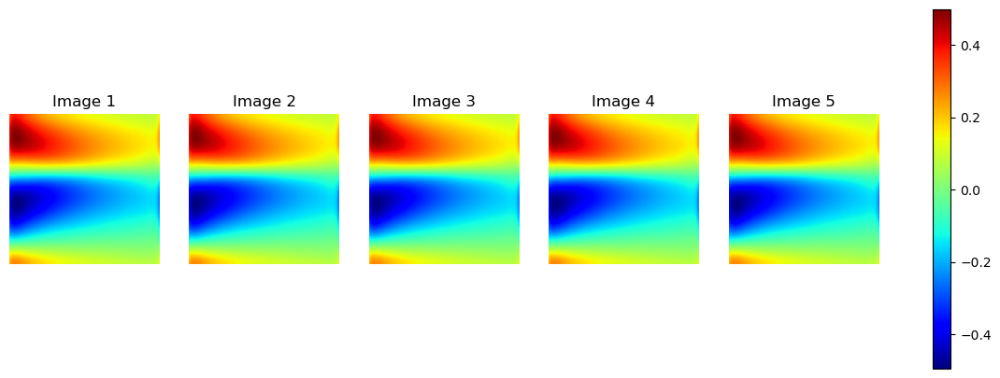

Epoch: 76, time: 2.631, Train Loss: 1.616e-03, Train l2: 0.1624, Test l2: 0.1616
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


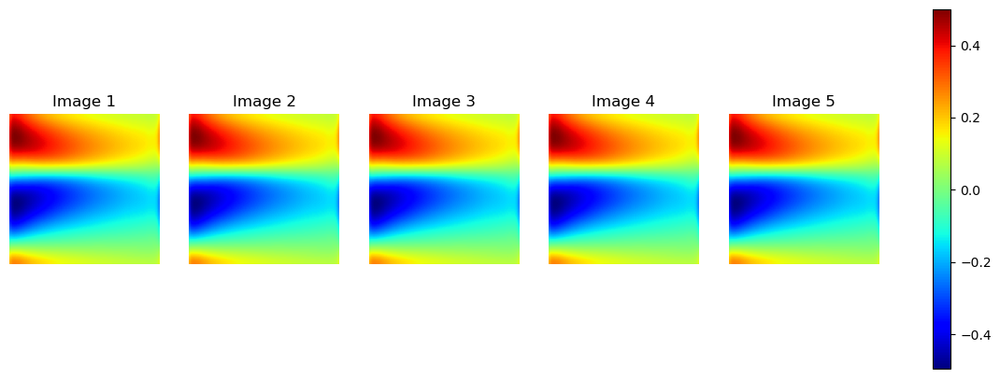

Epoch: 77, time: 2.449, Train Loss: 1.610e-03, Train l2: 0.1616, Test l2: 0.1610
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


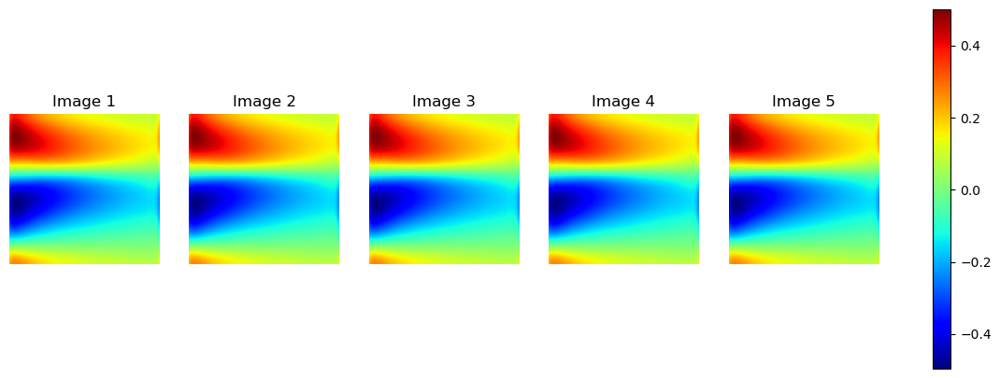

Epoch: 78, time: 2.408, Train Loss: 1.605e-03, Train l2: 0.1610, Test l2: 0.1607
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


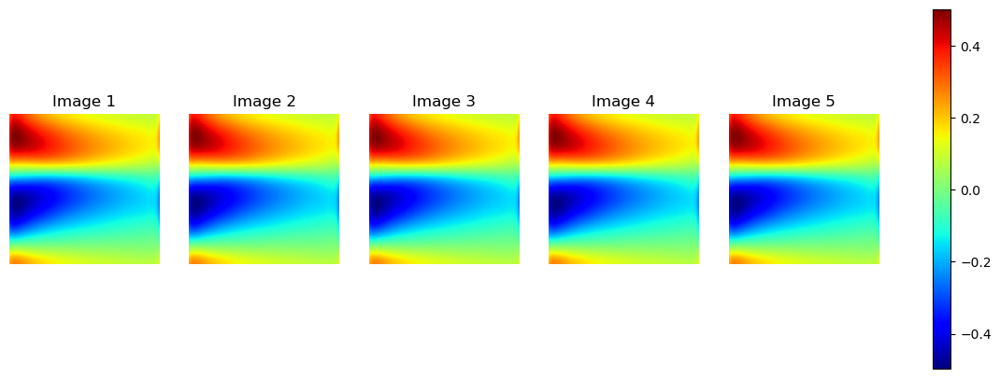

Epoch: 79, time: 2.394, Train Loss: 1.600e-03, Train l2: 0.1607, Test l2: 0.1605
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


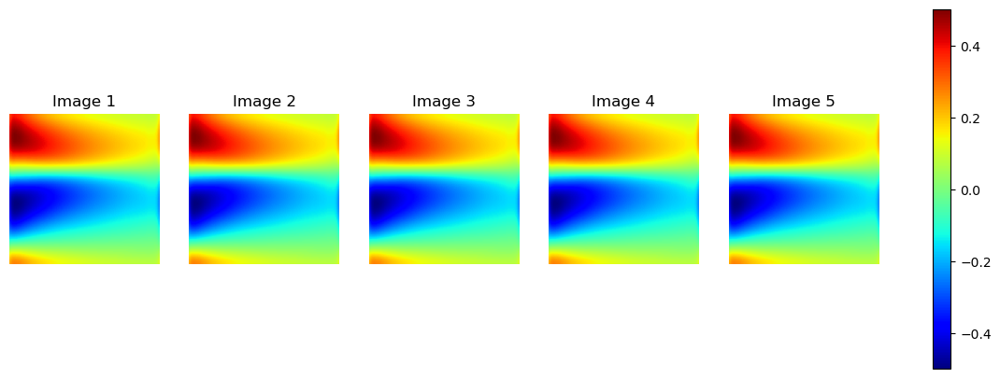

Epoch: 80, time: 2.407, Train Loss: 1.595e-03, Train l2: 0.1605, Test l2: 0.1603
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


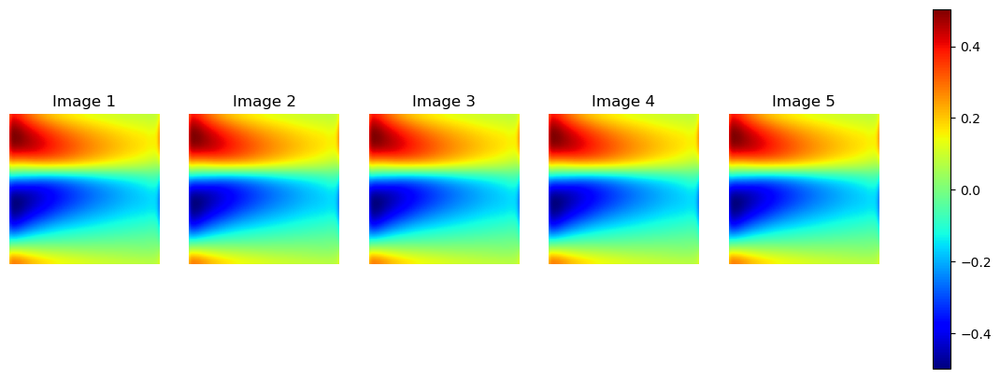

Epoch: 81, time: 2.423, Train Loss: 1.589e-03, Train l2: 0.1603, Test l2: 0.1601
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


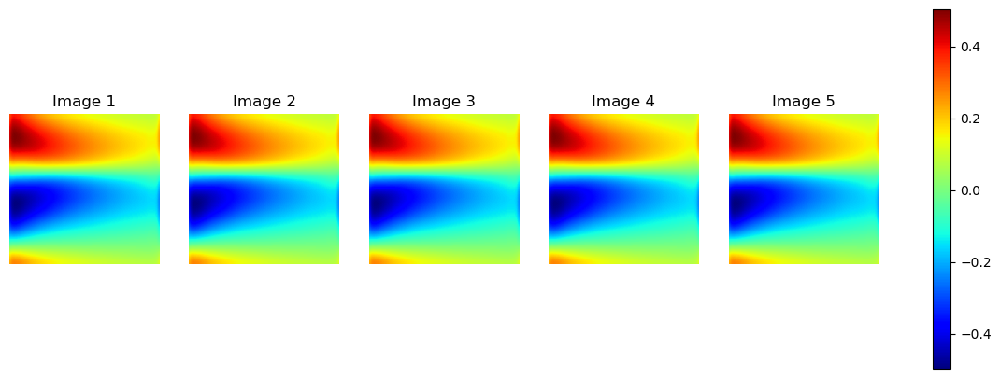

Epoch: 82, time: 2.529, Train Loss: 1.584e-03, Train l2: 0.1601, Test l2: 0.1597
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


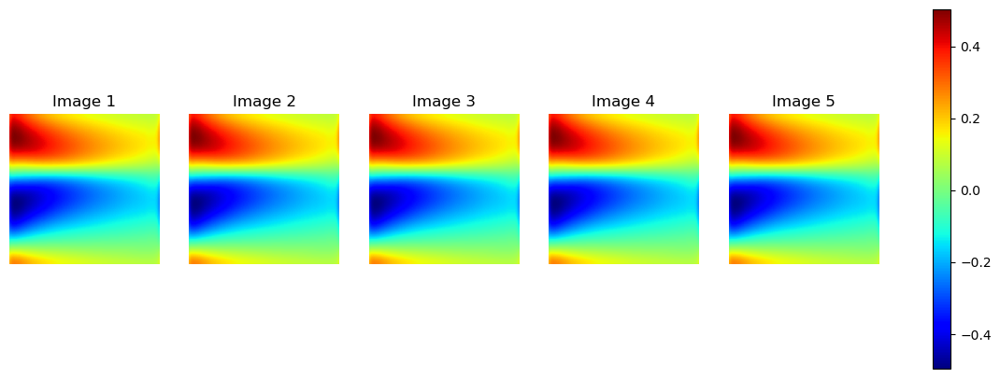

Epoch: 83, time: 2.655, Train Loss: 1.579e-03, Train l2: 0.1597, Test l2: 0.1592
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


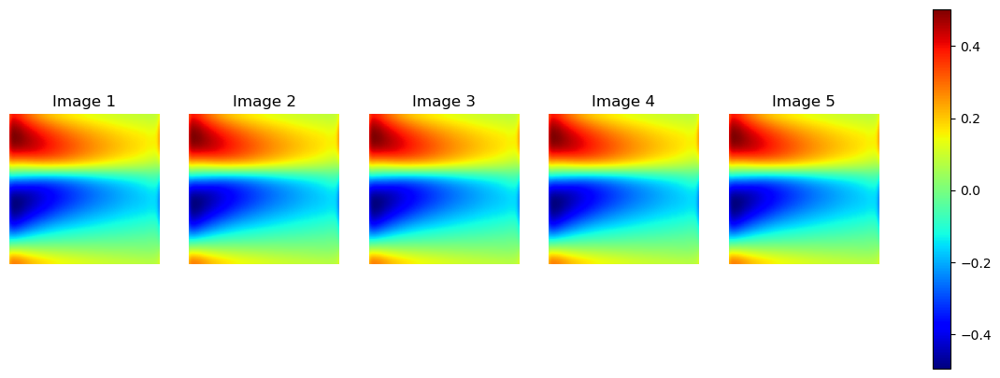

Epoch: 84, time: 2.438, Train Loss: 1.574e-03, Train l2: 0.1592, Test l2: 0.1586
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


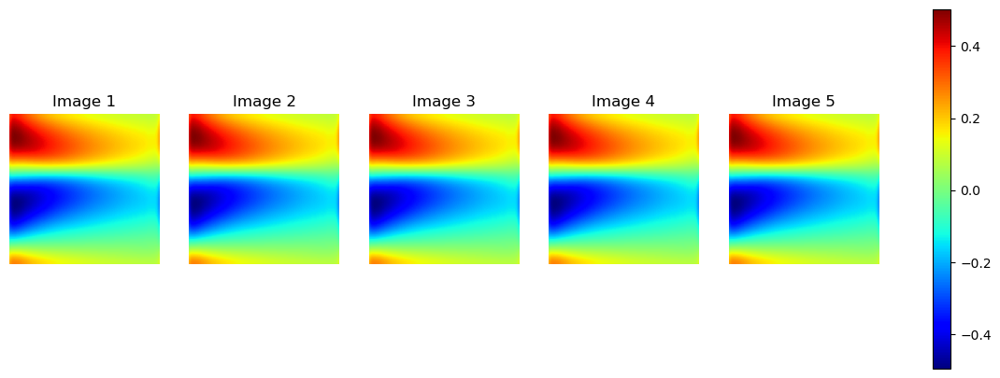

Epoch: 85, time: 2.404, Train Loss: 1.568e-03, Train l2: 0.1586, Test l2: 0.1583
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


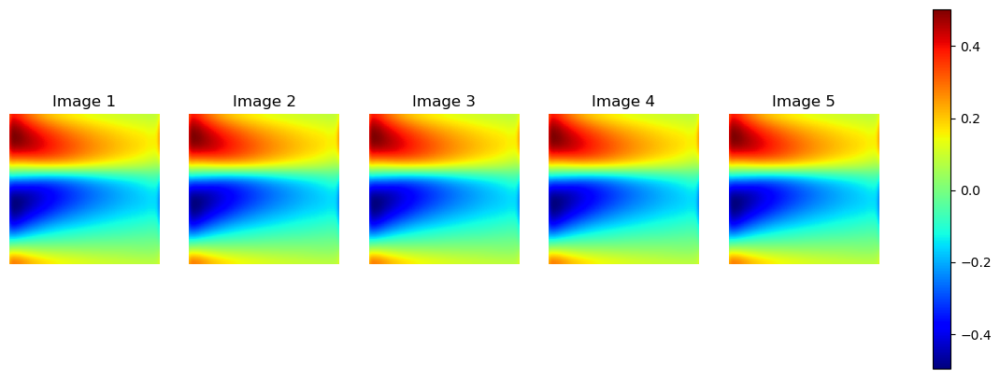

Epoch: 86, time: 2.428, Train Loss: 1.563e-03, Train l2: 0.1583, Test l2: 0.1580
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


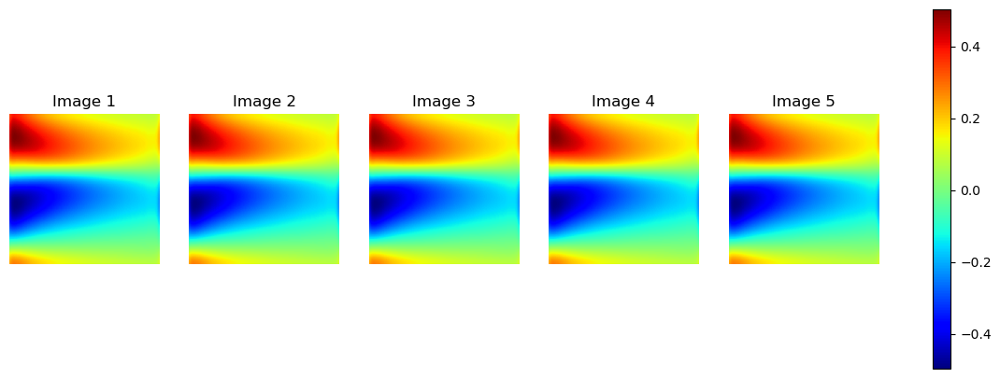

Epoch: 87, time: 2.469, Train Loss: 1.558e-03, Train l2: 0.1580, Test l2: 0.1577
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


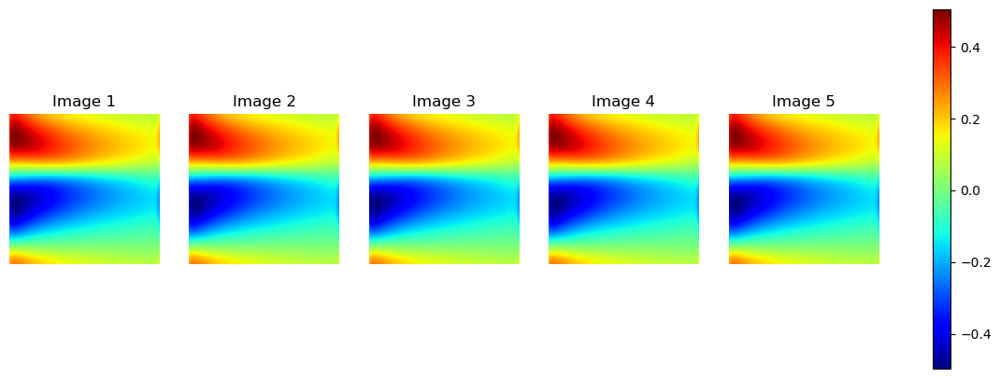

Epoch: 88, time: 2.464, Train Loss: 1.553e-03, Train l2: 0.1577, Test l2: 0.1573
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


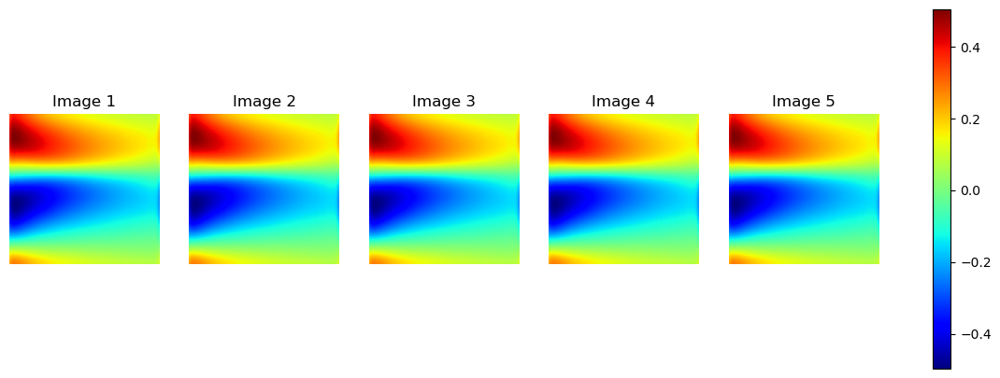

Epoch: 89, time: 2.552, Train Loss: 1.547e-03, Train l2: 0.1573, Test l2: 0.1568
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


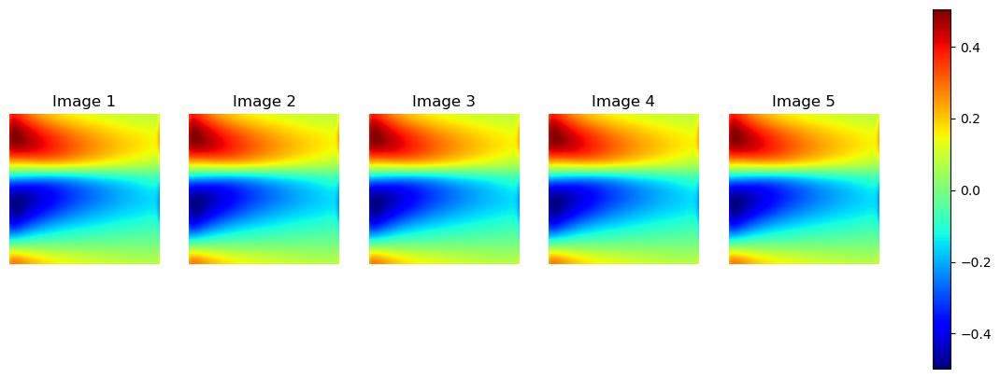

Epoch: 90, time: 2.423, Train Loss: 1.542e-03, Train l2: 0.1568, Test l2: 0.1563
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


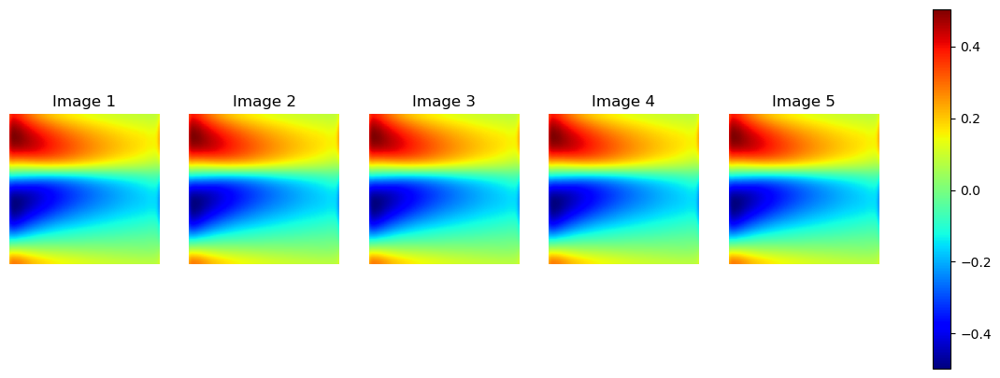

Epoch: 91, time: 2.402, Train Loss: 1.537e-03, Train l2: 0.1563, Test l2: 0.1560
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


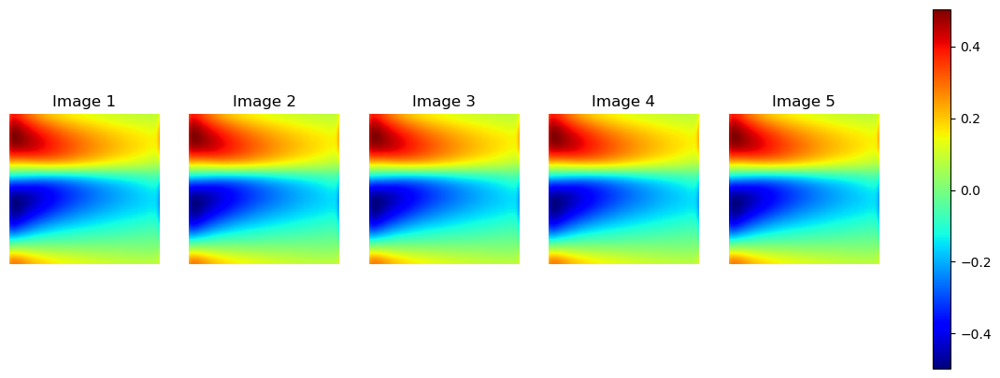

Epoch: 92, time: 2.464, Train Loss: 1.532e-03, Train l2: 0.1560, Test l2: 0.1557
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


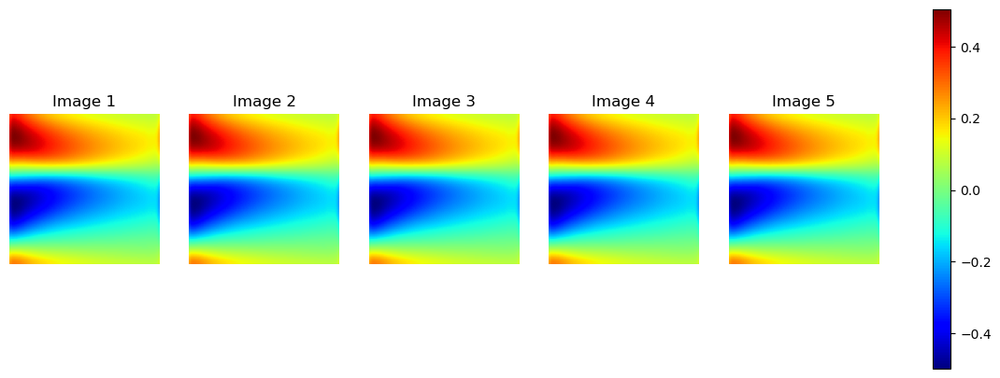

Epoch: 93, time: 2.389, Train Loss: 1.527e-03, Train l2: 0.1557, Test l2: 0.1554
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


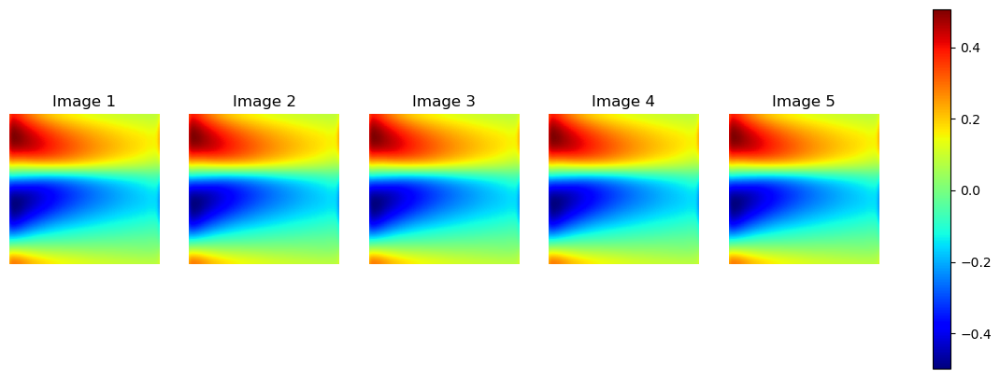

Epoch: 94, time: 2.427, Train Loss: 1.523e-03, Train l2: 0.1554, Test l2: 0.1550
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


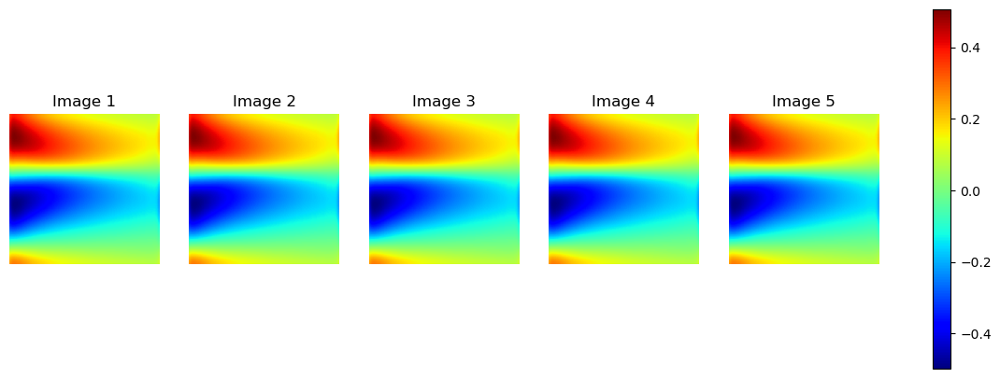

Epoch: 95, time: 2.377, Train Loss: 1.518e-03, Train l2: 0.1550, Test l2: 0.1546
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


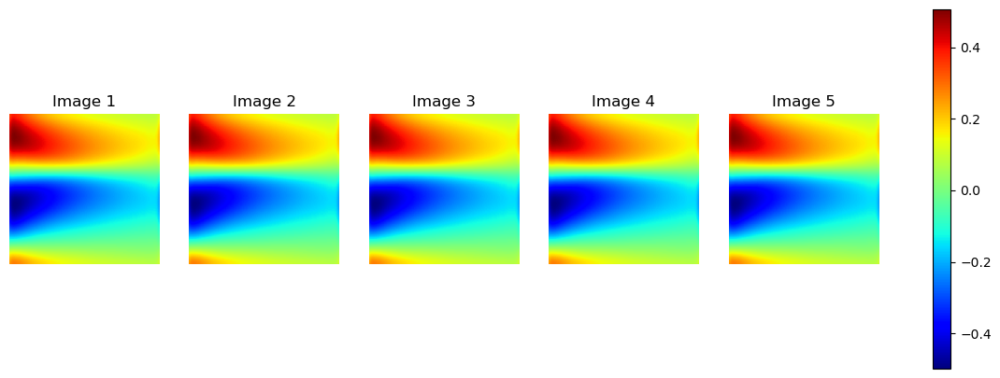

Epoch: 96, time: 2.604, Train Loss: 1.513e-03, Train l2: 0.1546, Test l2: 0.1543
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


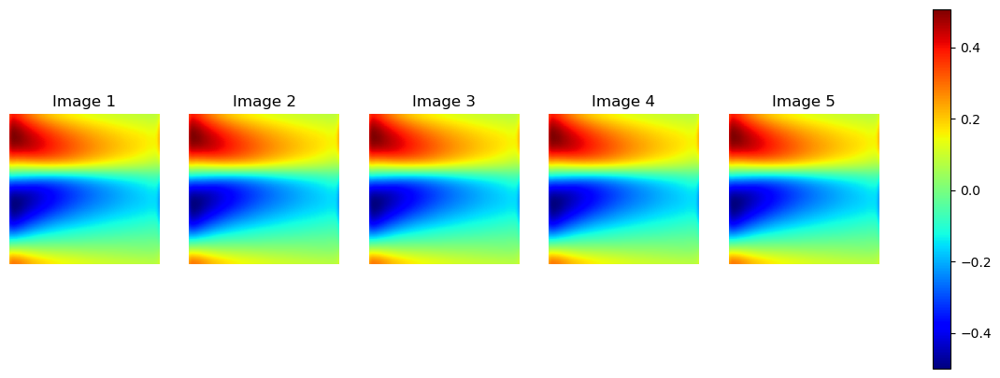

Epoch: 97, time: 2.420, Train Loss: 1.507e-03, Train l2: 0.1543, Test l2: 0.1539
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


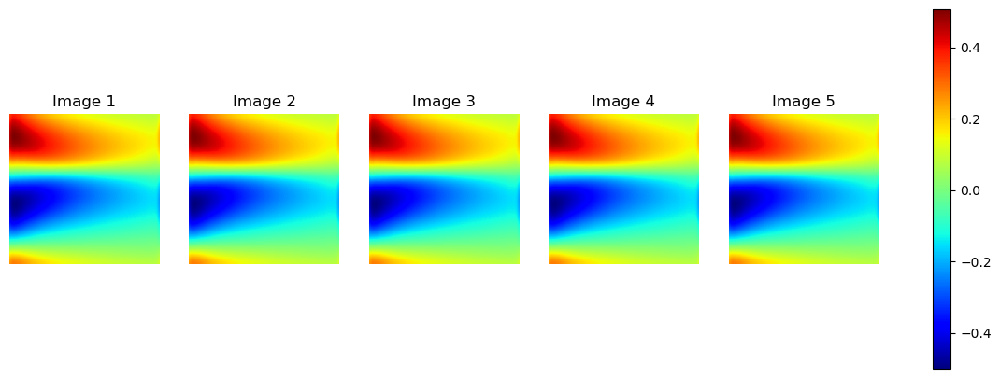

Epoch: 98, time: 2.420, Train Loss: 1.502e-03, Train l2: 0.1539, Test l2: 0.1535
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


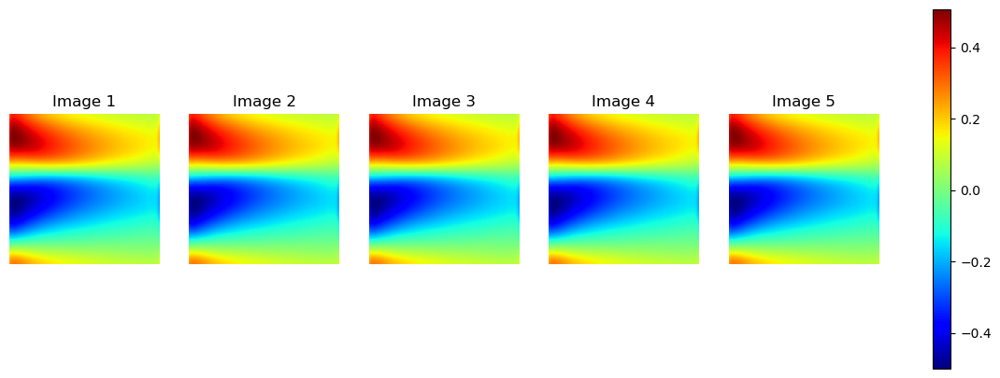

Epoch: 99, time: 2.406, Train Loss: 1.497e-03, Train l2: 0.1535, Test l2: 0.1531
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


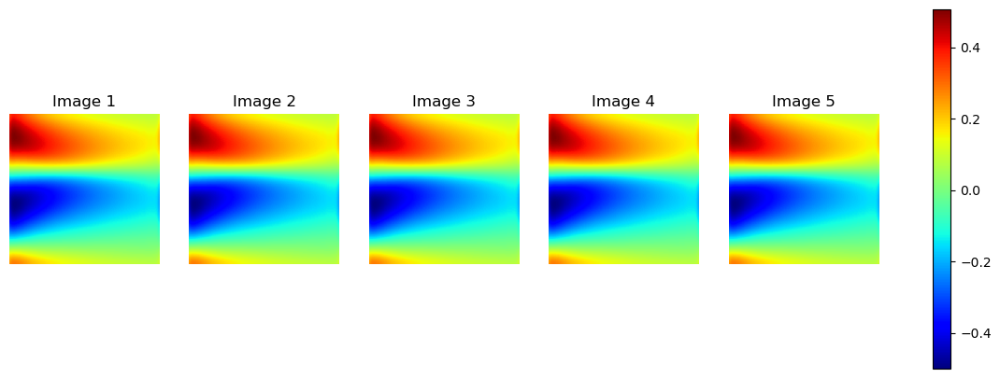

Epoch: 100, time: 2.448, Train Loss: 1.491e-03, Train l2: 0.1531, Test l2: 0.1529
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


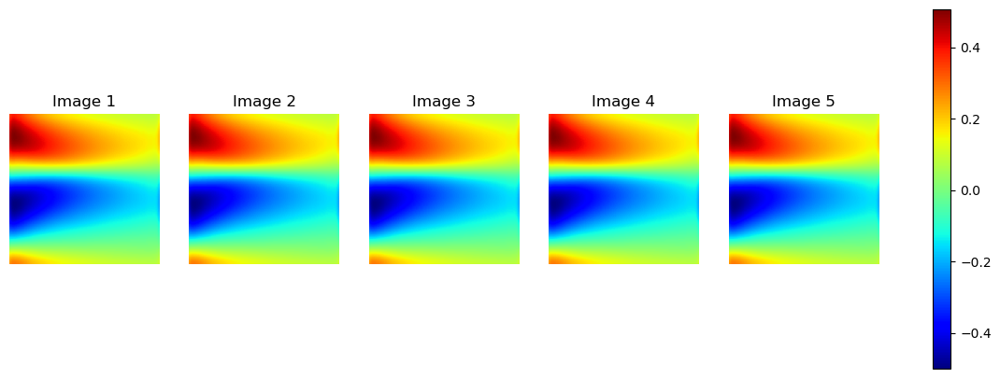

Epoch: 101, time: 2.495, Train Loss: 1.489e-03, Train l2: 0.1529, Test l2: 0.1527
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


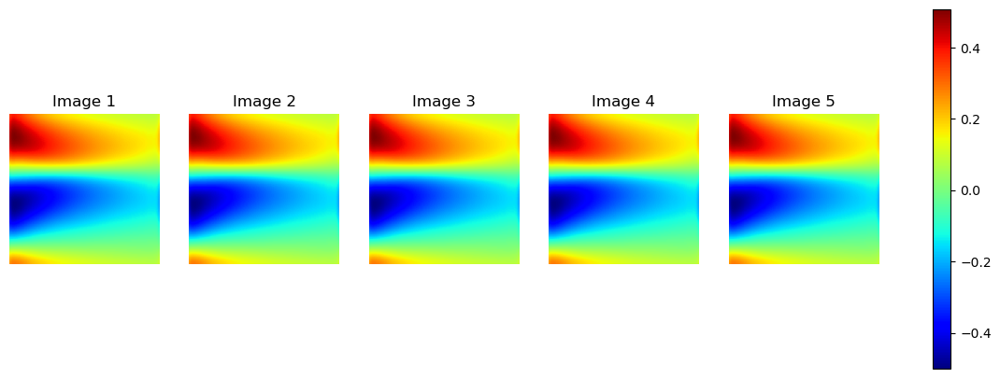

Epoch: 102, time: 2.614, Train Loss: 1.486e-03, Train l2: 0.1527, Test l2: 0.1526
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


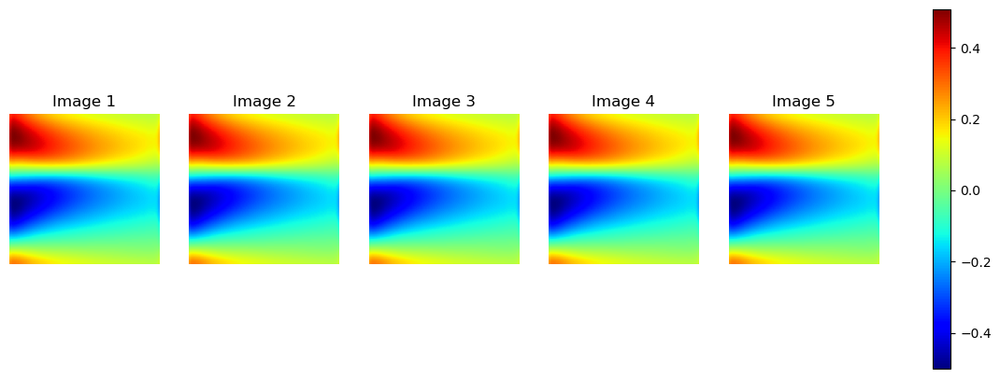

Epoch: 103, time: 2.447, Train Loss: 1.483e-03, Train l2: 0.1526, Test l2: 0.1524
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


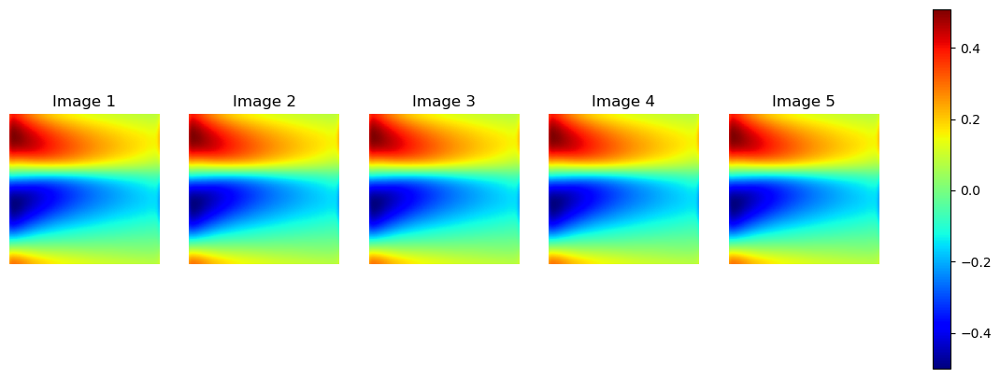

Epoch: 104, time: 2.428, Train Loss: 1.481e-03, Train l2: 0.1524, Test l2: 0.1522
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


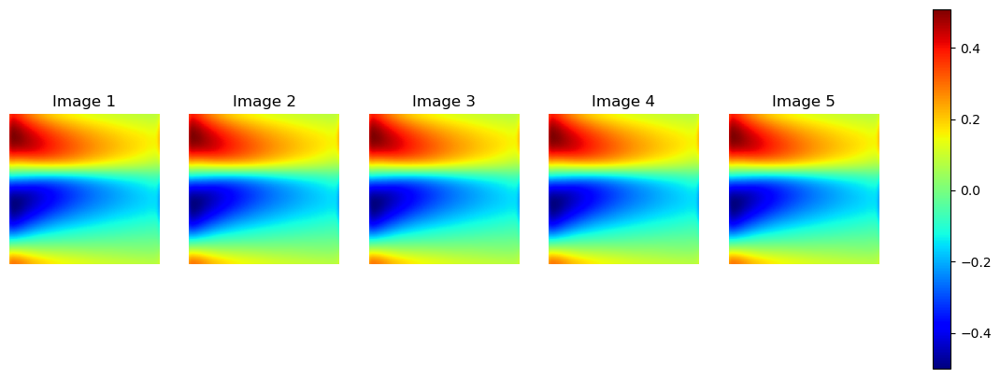

Epoch: 105, time: 2.379, Train Loss: 1.478e-03, Train l2: 0.1522, Test l2: 0.1520
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


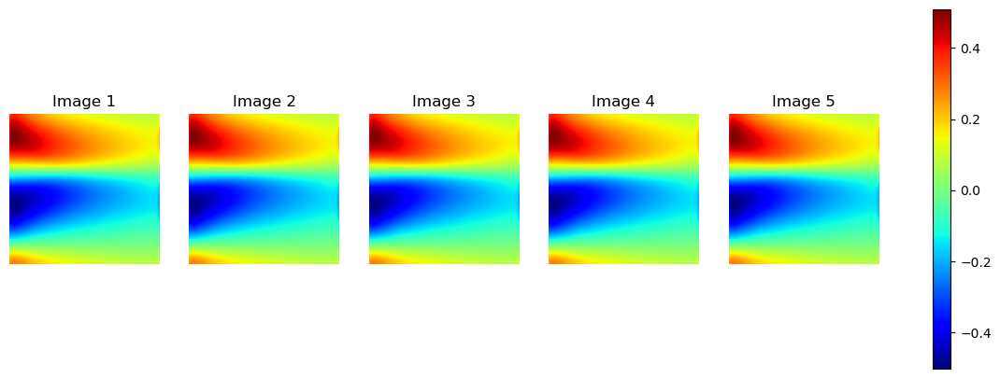

Epoch: 106, time: 2.438, Train Loss: 1.475e-03, Train l2: 0.1520, Test l2: 0.1518
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


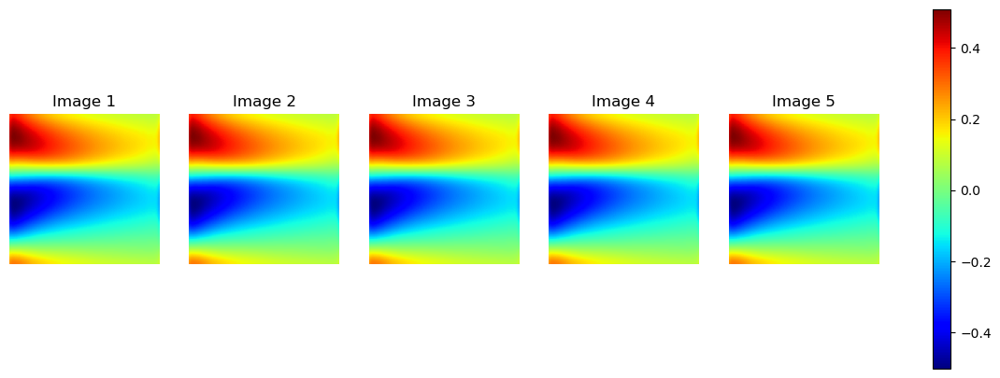

Epoch: 107, time: 2.392, Train Loss: 1.472e-03, Train l2: 0.1518, Test l2: 0.1516
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


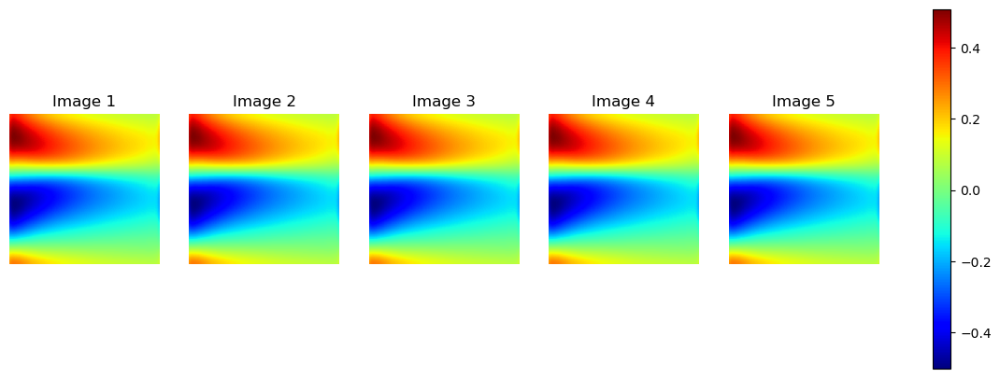

Epoch: 108, time: 2.401, Train Loss: 1.469e-03, Train l2: 0.1516, Test l2: 0.1514
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


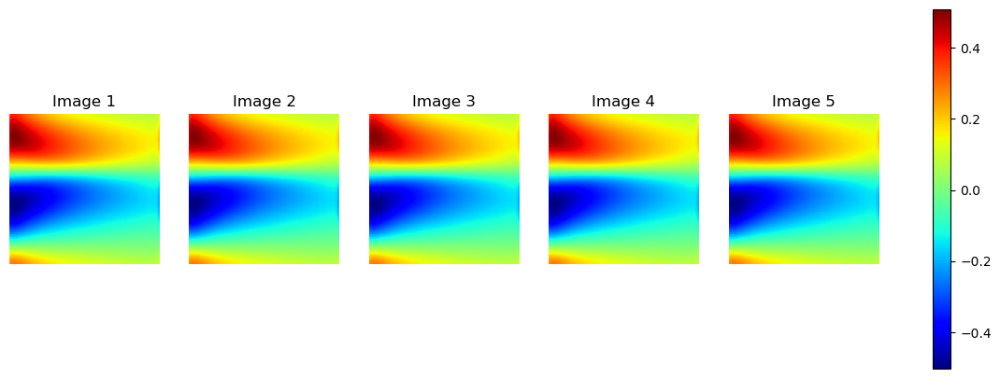

Epoch: 109, time: 2.563, Train Loss: 1.466e-03, Train l2: 0.1514, Test l2: 0.1512
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


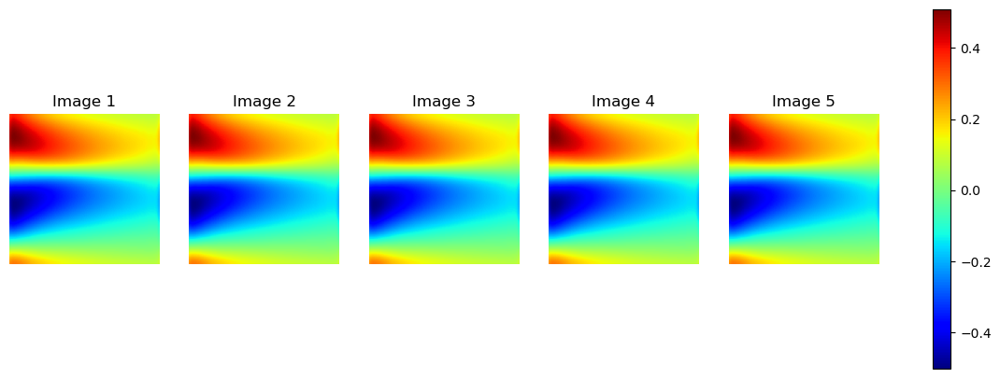

Epoch: 110, time: 2.531, Train Loss: 1.463e-03, Train l2: 0.1512, Test l2: 0.1510
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


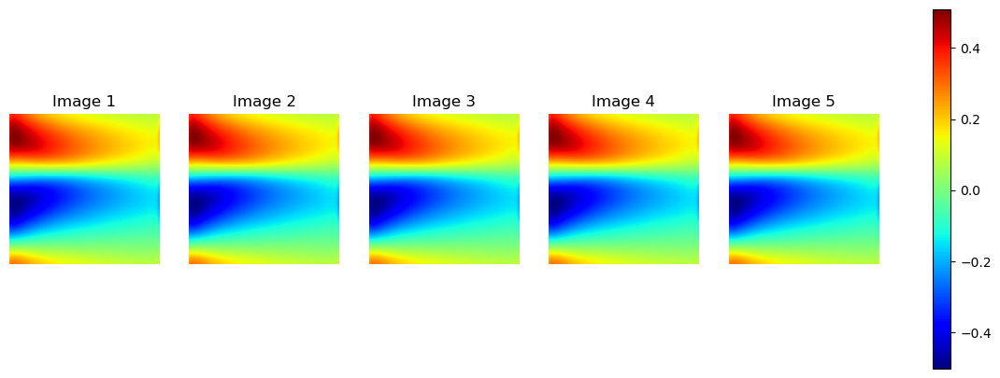

Epoch: 111, time: 2.380, Train Loss: 1.459e-03, Train l2: 0.1510, Test l2: 0.1508
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


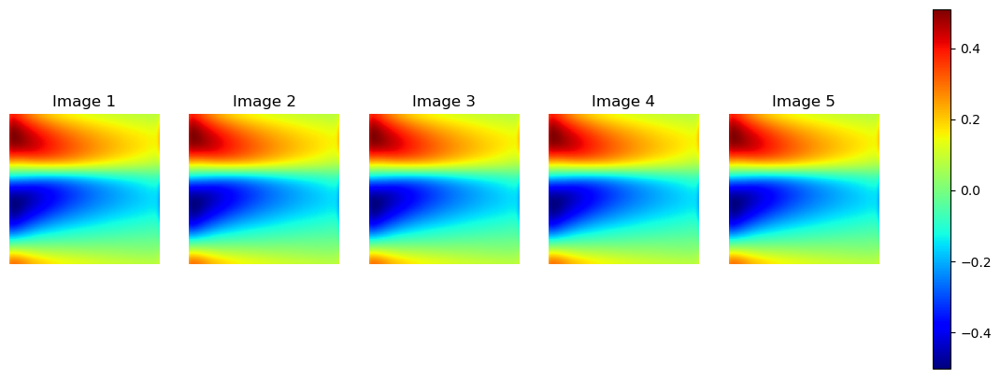

Epoch: 112, time: 2.449, Train Loss: 1.456e-03, Train l2: 0.1508, Test l2: 0.1506
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


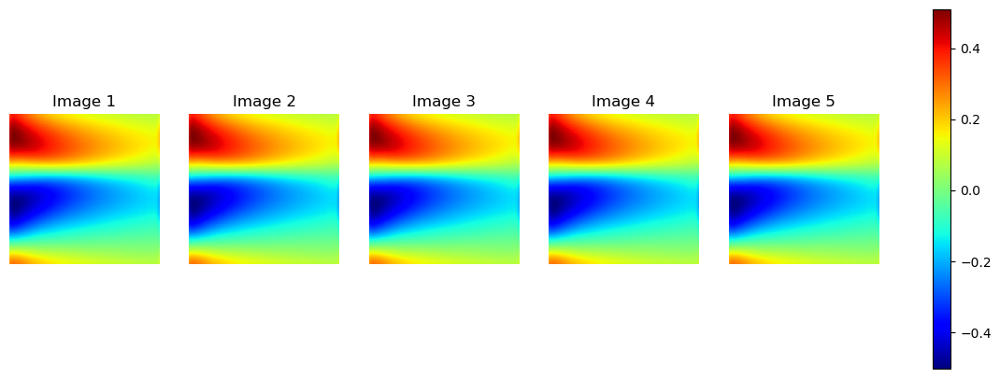

Epoch: 113, time: 2.416, Train Loss: 1.453e-03, Train l2: 0.1506, Test l2: 0.1504
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


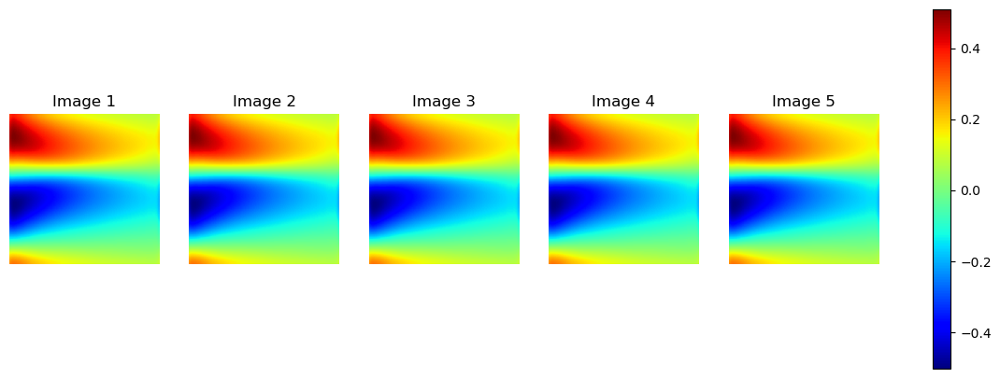

Epoch: 114, time: 2.468, Train Loss: 1.449e-03, Train l2: 0.1504, Test l2: 0.1502
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


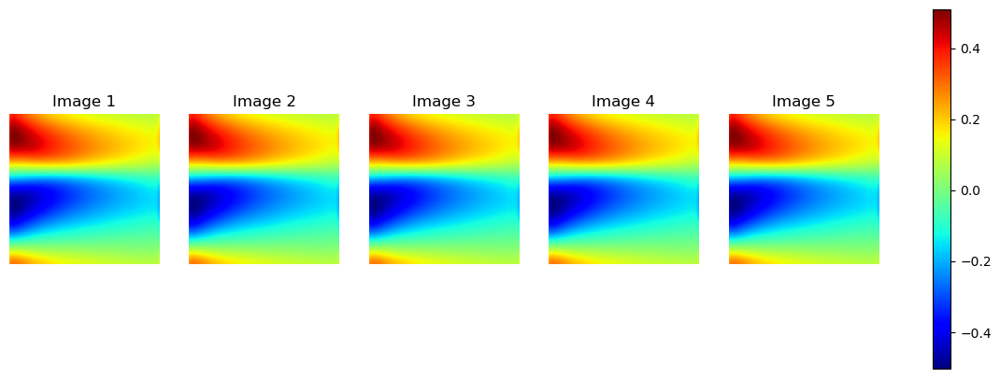

Epoch: 115, time: 2.583, Train Loss: 1.446e-03, Train l2: 0.1502, Test l2: 0.1499
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


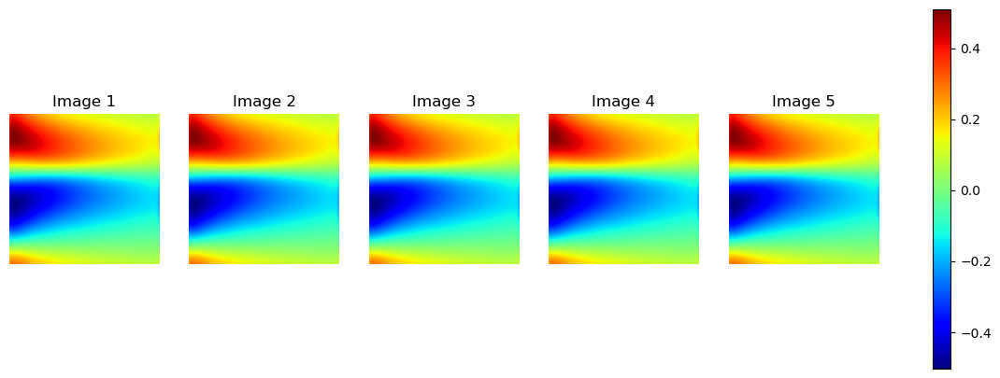

Epoch: 116, time: 2.455, Train Loss: 1.442e-03, Train l2: 0.1499, Test l2: 0.1497
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


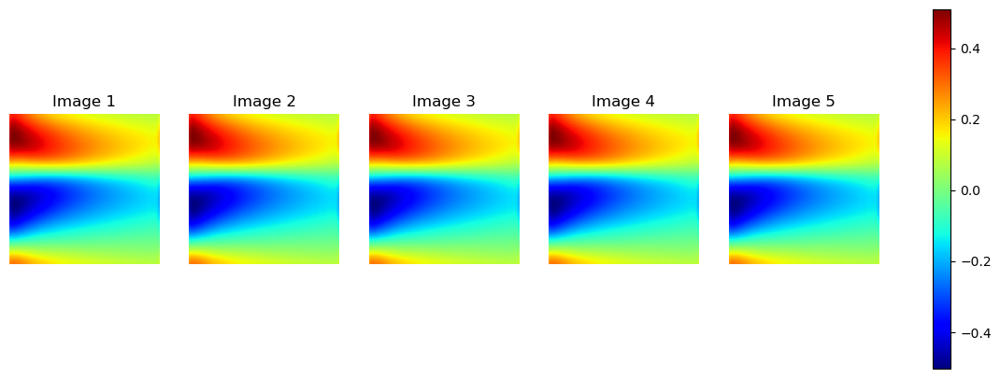

Epoch: 117, time: 2.417, Train Loss: 1.438e-03, Train l2: 0.1497, Test l2: 0.1494
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


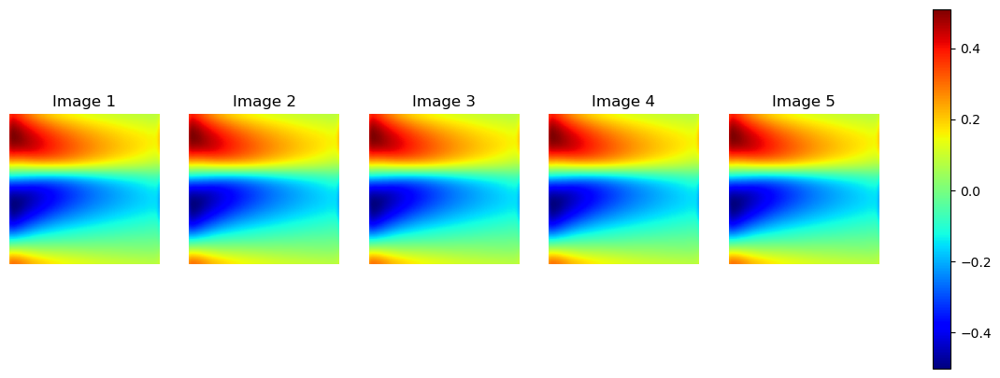

Epoch: 118, time: 2.444, Train Loss: 1.434e-03, Train l2: 0.1494, Test l2: 0.1492
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


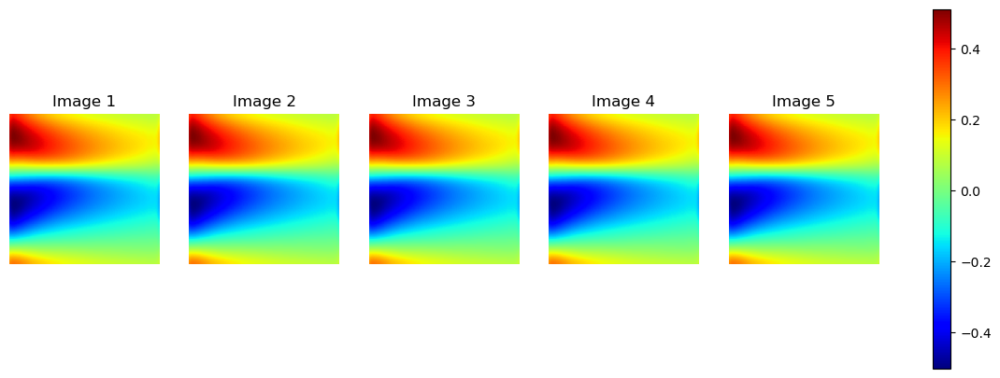

Epoch: 119, time: 2.451, Train Loss: 1.430e-03, Train l2: 0.1492, Test l2: 0.1490
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


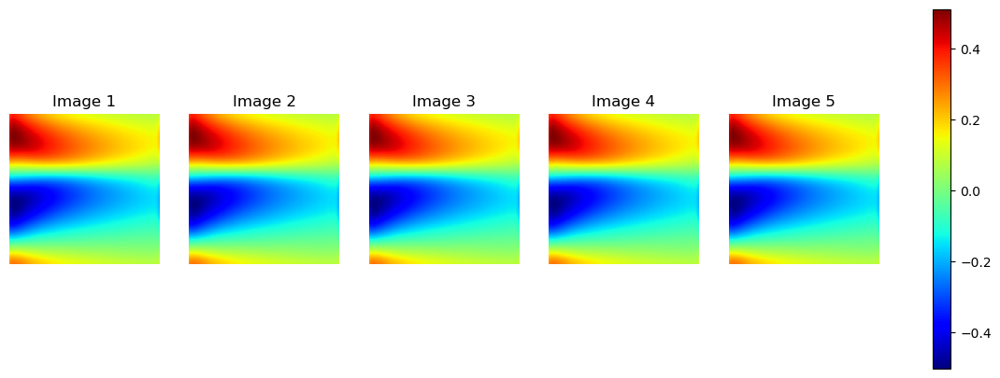

Epoch: 120, time: 2.501, Train Loss: 1.426e-03, Train l2: 0.1490, Test l2: 0.1487
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


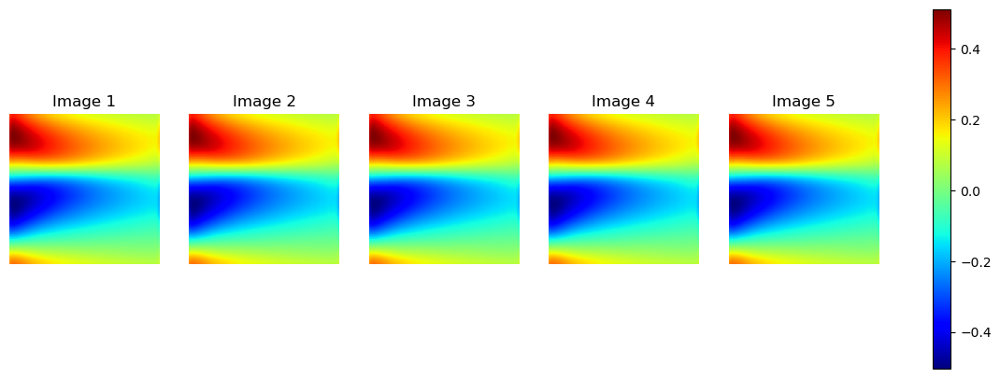

Epoch: 121, time: 2.371, Train Loss: 1.421e-03, Train l2: 0.1487, Test l2: 0.1485
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


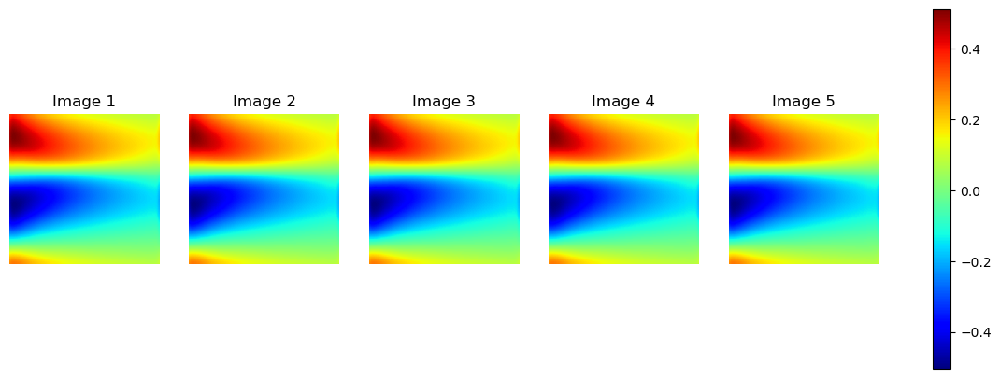

Epoch: 122, time: 2.547, Train Loss: 1.417e-03, Train l2: 0.1485, Test l2: 0.1482
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


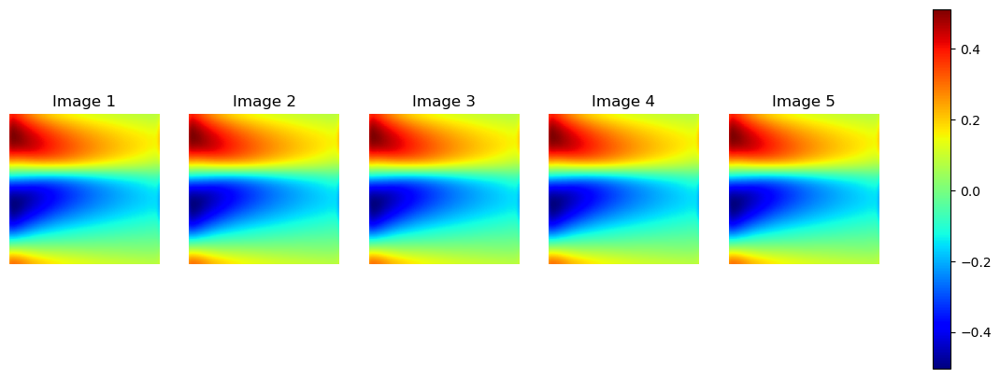

Epoch: 123, time: 2.438, Train Loss: 1.412e-03, Train l2: 0.1482, Test l2: 0.1479
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


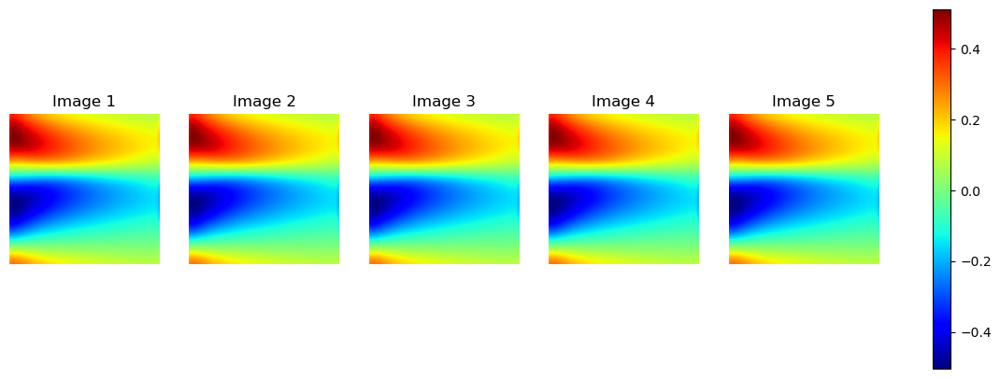

Epoch: 124, time: 2.430, Train Loss: 1.407e-03, Train l2: 0.1479, Test l2: 0.1476
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


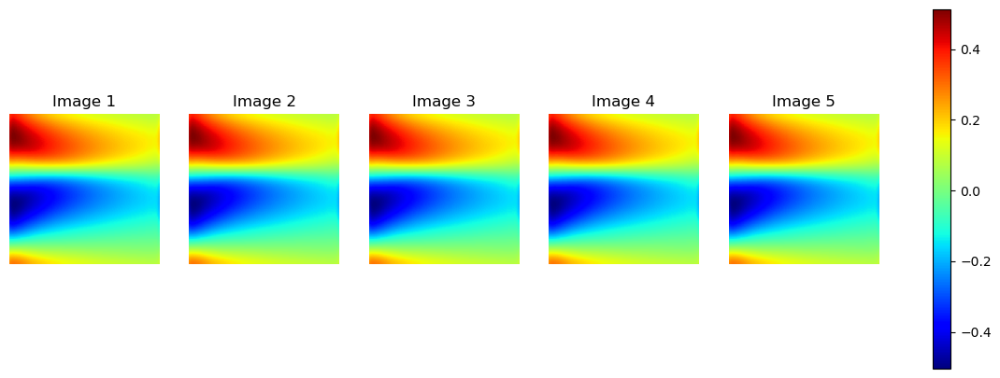

Epoch: 125, time: 2.400, Train Loss: 1.402e-03, Train l2: 0.1476, Test l2: 0.1473
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


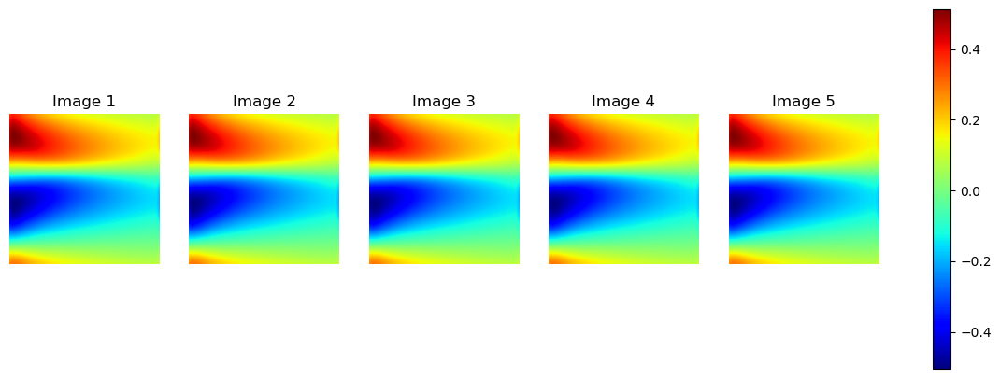

Epoch: 126, time: 2.388, Train Loss: 1.397e-03, Train l2: 0.1473, Test l2: 0.1470
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


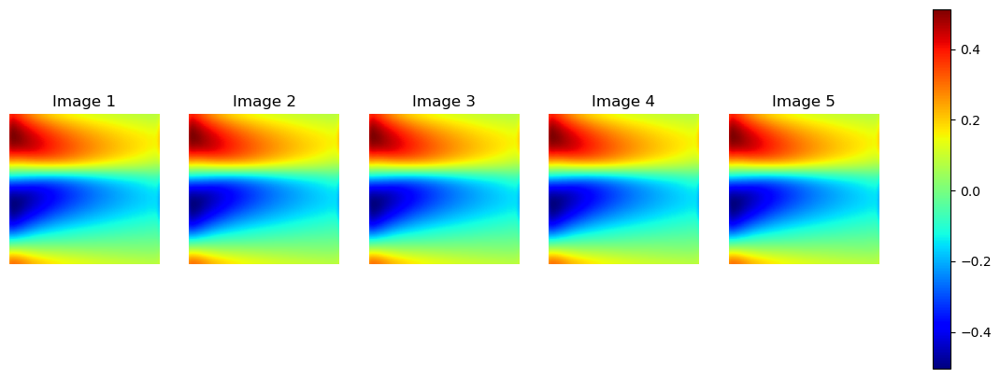

Epoch: 127, time: 2.424, Train Loss: 1.391e-03, Train l2: 0.1470, Test l2: 0.1466
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


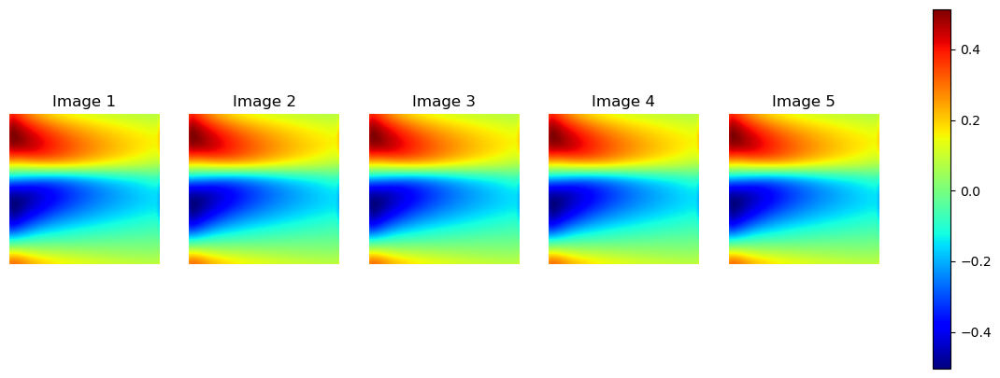

Epoch: 128, time: 2.531, Train Loss: 1.386e-03, Train l2: 0.1466, Test l2: 0.1463
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


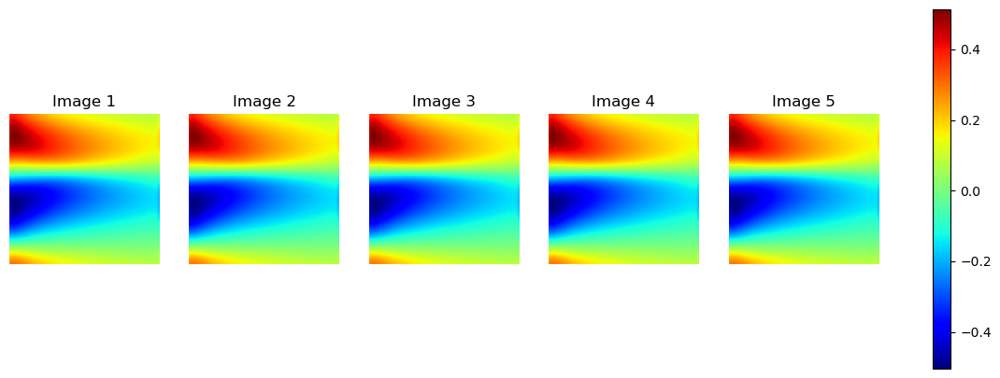

Epoch: 129, time: 2.501, Train Loss: 1.380e-03, Train l2: 0.1463, Test l2: 0.1459
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


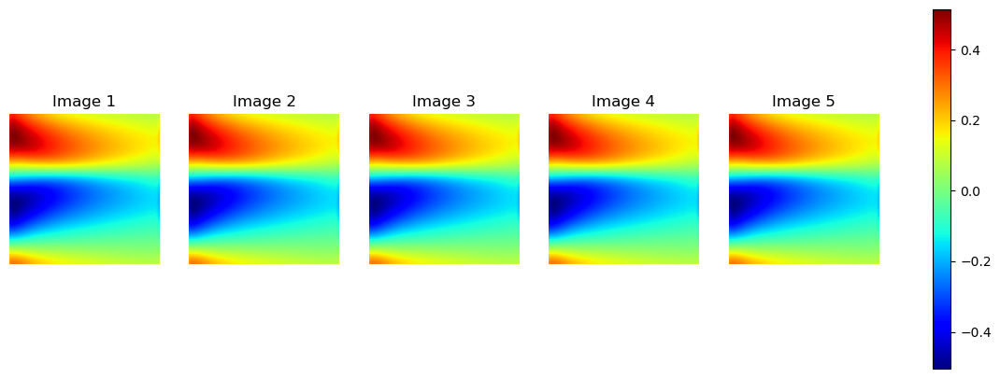

Epoch: 130, time: 2.405, Train Loss: 1.374e-03, Train l2: 0.1459, Test l2: 0.1457
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


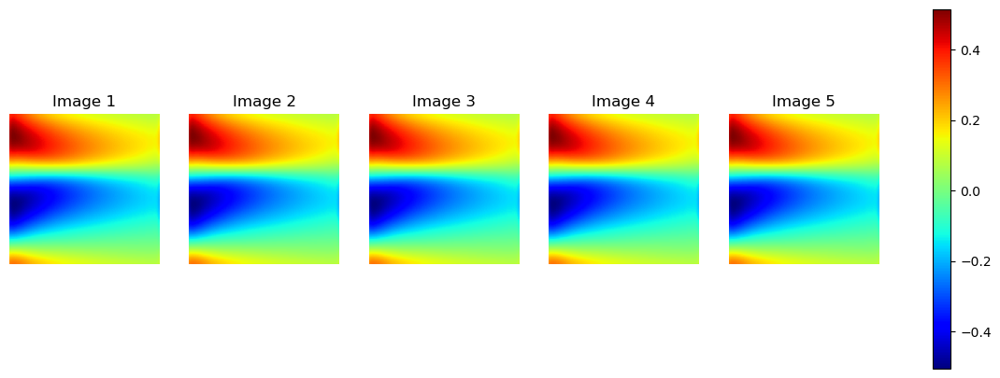

Epoch: 131, time: 2.468, Train Loss: 1.367e-03, Train l2: 0.1457, Test l2: 0.1451
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


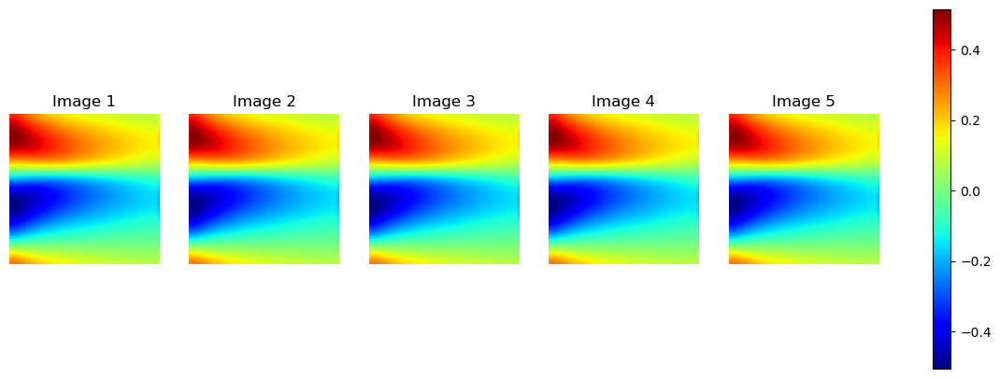

Epoch: 132, time: 2.418, Train Loss: 1.361e-03, Train l2: 0.1451, Test l2: 0.1450
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


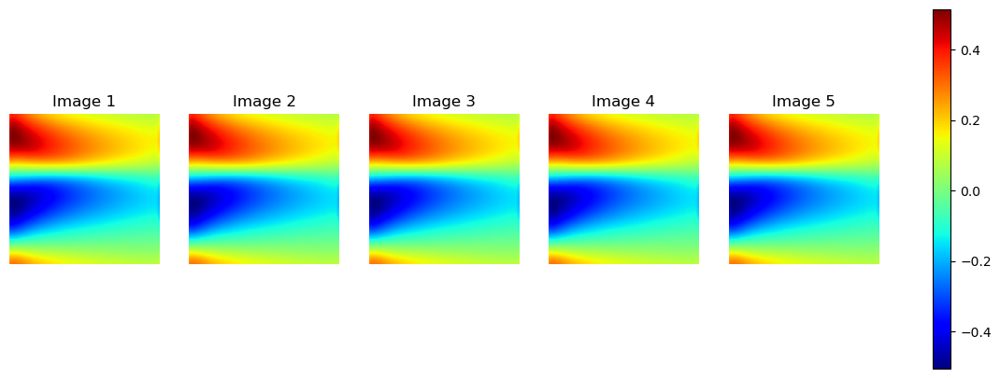

Epoch: 133, time: 2.394, Train Loss: 1.354e-03, Train l2: 0.1450, Test l2: 0.1441
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


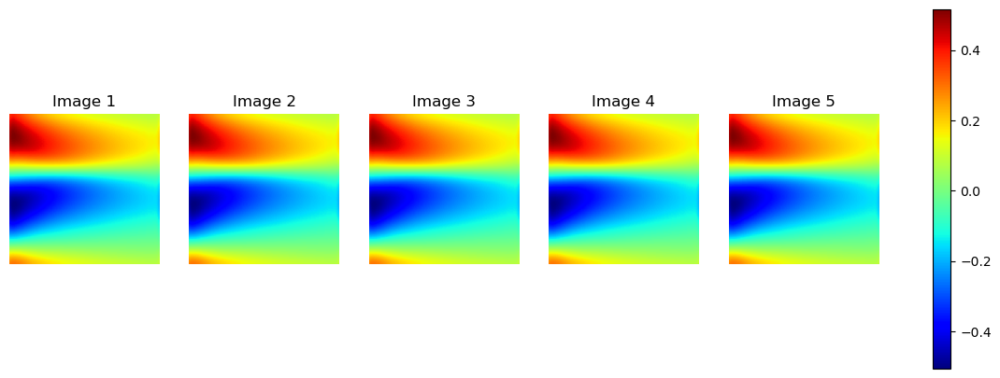

Epoch: 134, time: 2.397, Train Loss: 1.347e-03, Train l2: 0.1441, Test l2: 0.1444
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


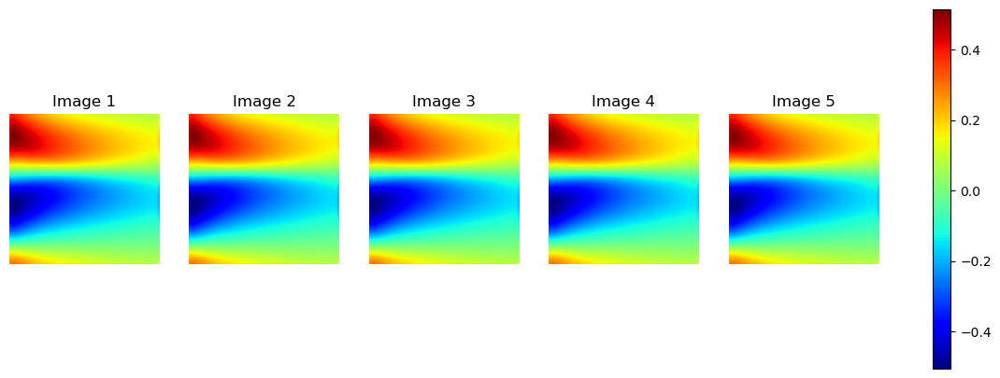

Epoch: 135, time: 2.552, Train Loss: 1.340e-03, Train l2: 0.1444, Test l2: 0.1434
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


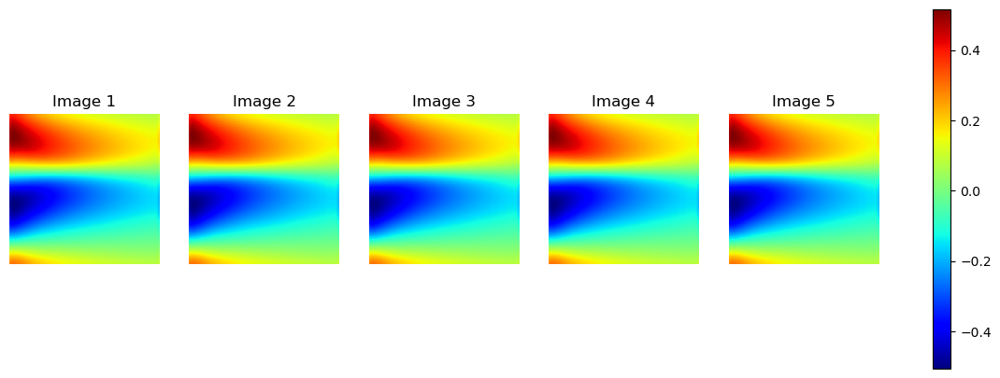

Epoch: 136, time: 2.420, Train Loss: 1.333e-03, Train l2: 0.1434, Test l2: 0.1432
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


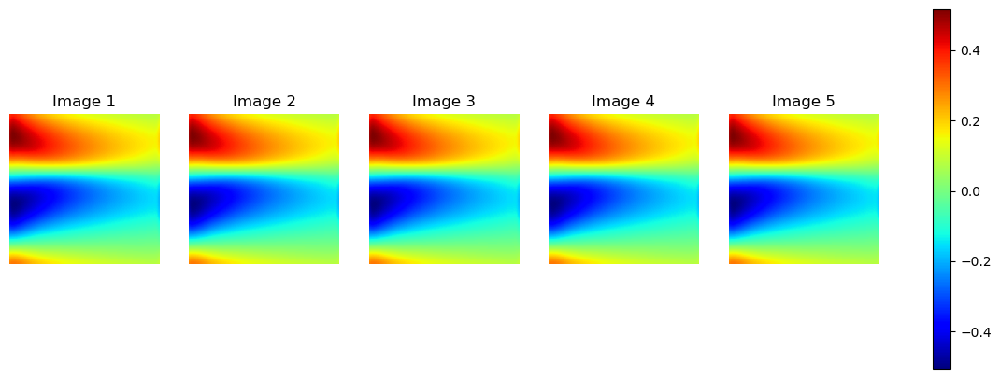

Epoch: 137, time: 2.429, Train Loss: 1.325e-03, Train l2: 0.1432, Test l2: 0.1429
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


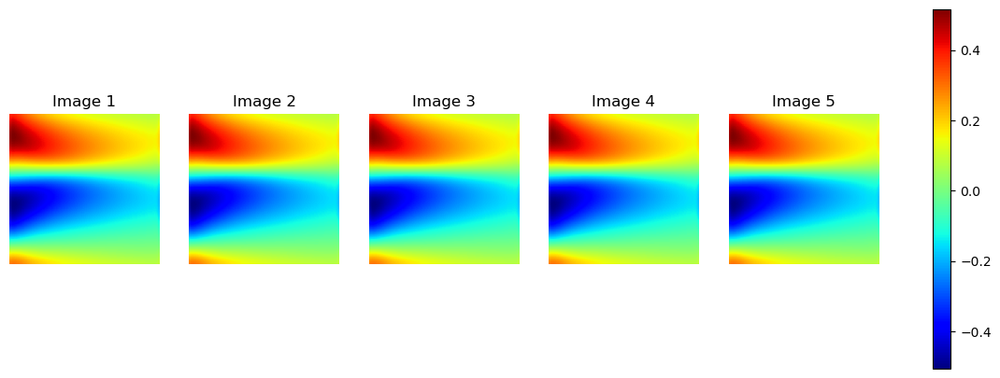

Epoch: 138, time: 2.502, Train Loss: 1.317e-03, Train l2: 0.1429, Test l2: 0.1419
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


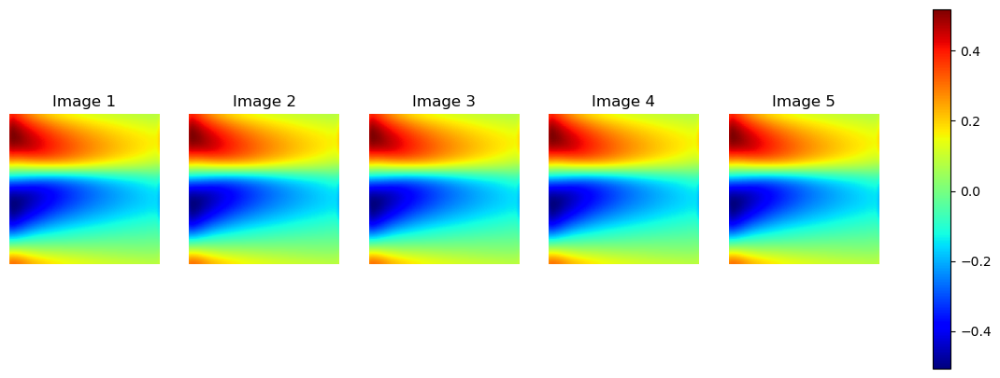

Epoch: 139, time: 2.389, Train Loss: 1.309e-03, Train l2: 0.1419, Test l2: 0.1422
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


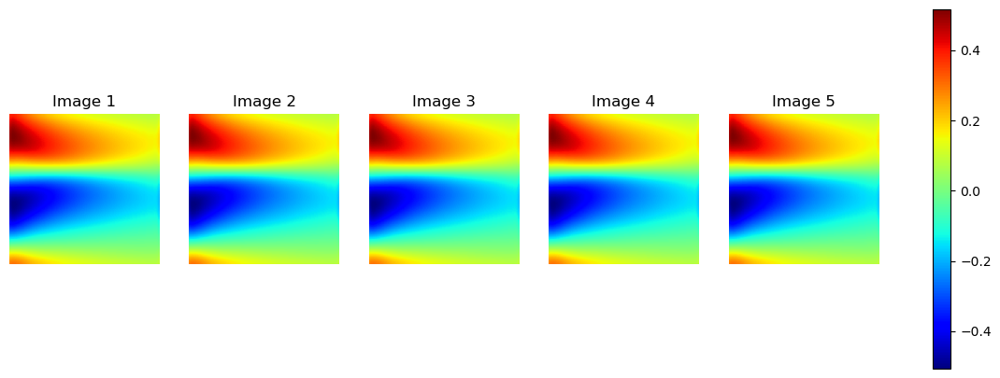

Epoch: 140, time: 2.410, Train Loss: 1.301e-03, Train l2: 0.1422, Test l2: 0.1409
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


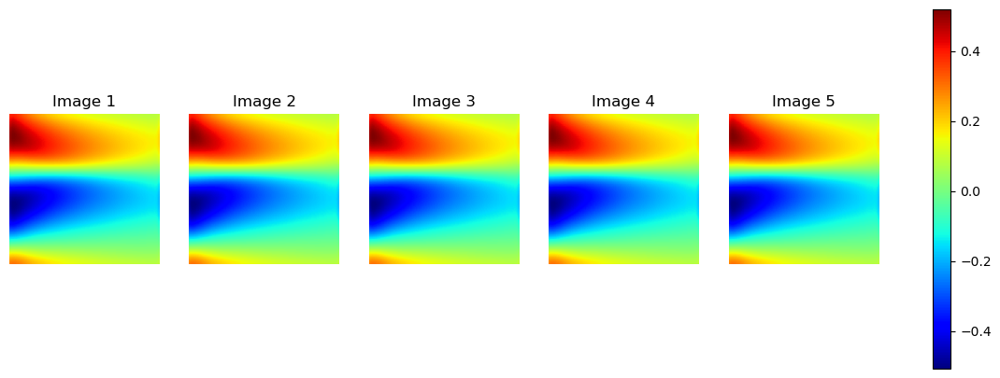

Epoch: 141, time: 2.523, Train Loss: 1.292e-03, Train l2: 0.1409, Test l2: 0.1411
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


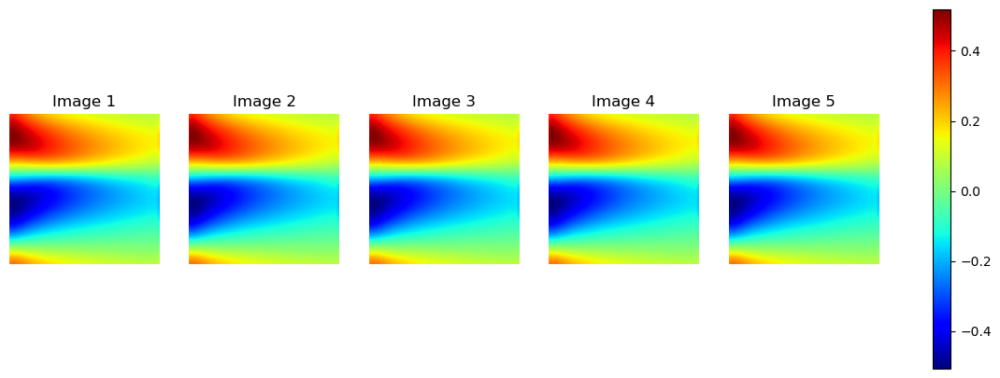

Epoch: 142, time: 2.432, Train Loss: 1.283e-03, Train l2: 0.1411, Test l2: 0.1401
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


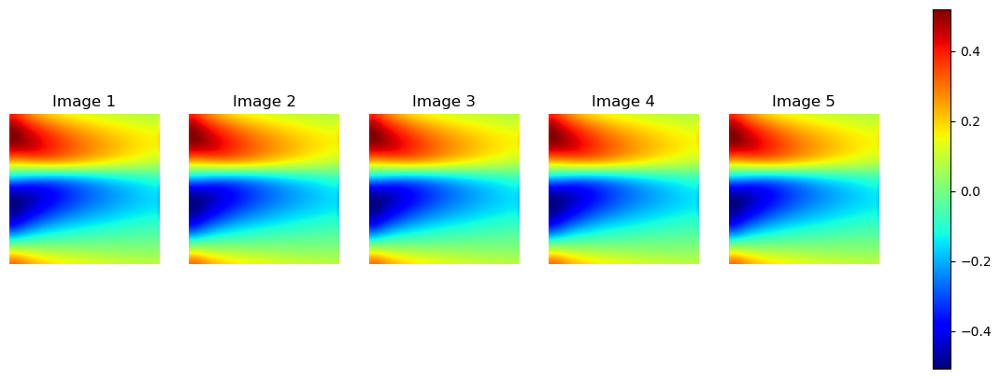

Epoch: 143, time: 2.471, Train Loss: 1.274e-03, Train l2: 0.1401, Test l2: 0.1397
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


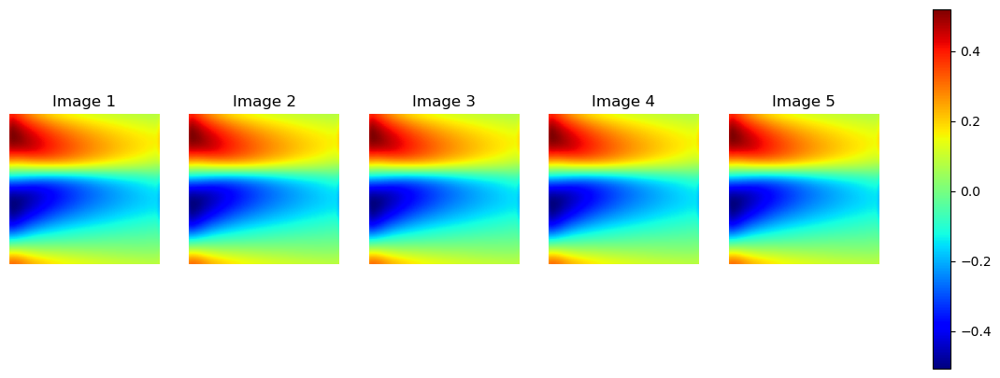

Epoch: 144, time: 2.427, Train Loss: 1.264e-03, Train l2: 0.1397, Test l2: 0.1394
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


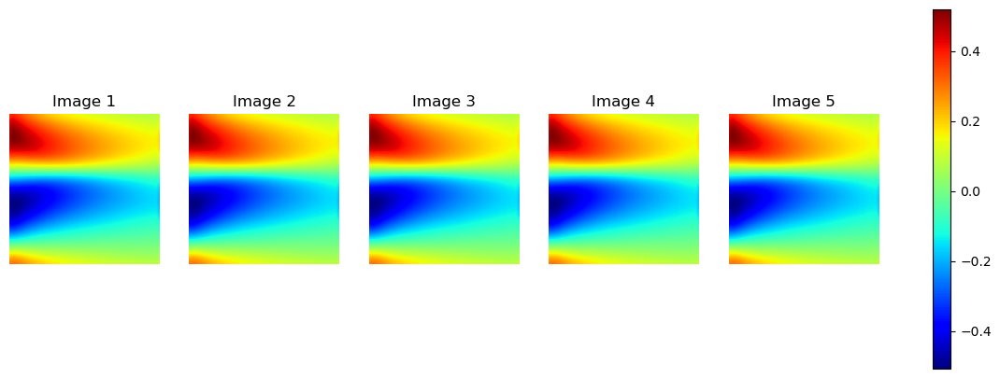

Epoch: 145, time: 2.458, Train Loss: 1.254e-03, Train l2: 0.1394, Test l2: 0.1381
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


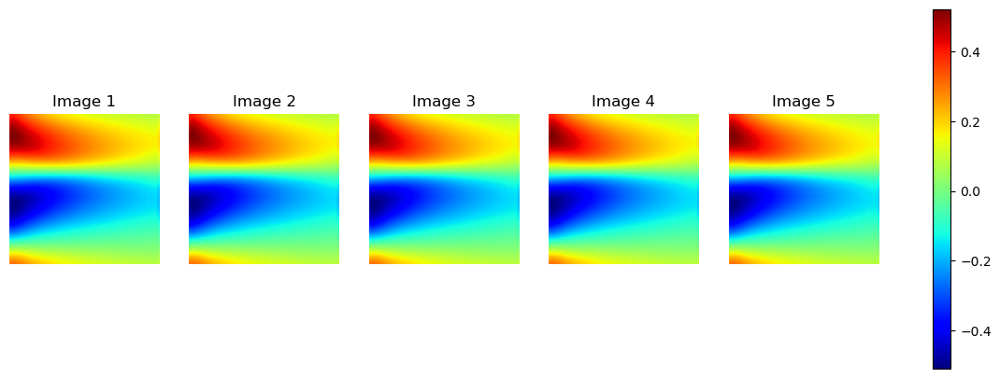

Epoch: 146, time: 2.406, Train Loss: 1.243e-03, Train l2: 0.1381, Test l2: 0.1388
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


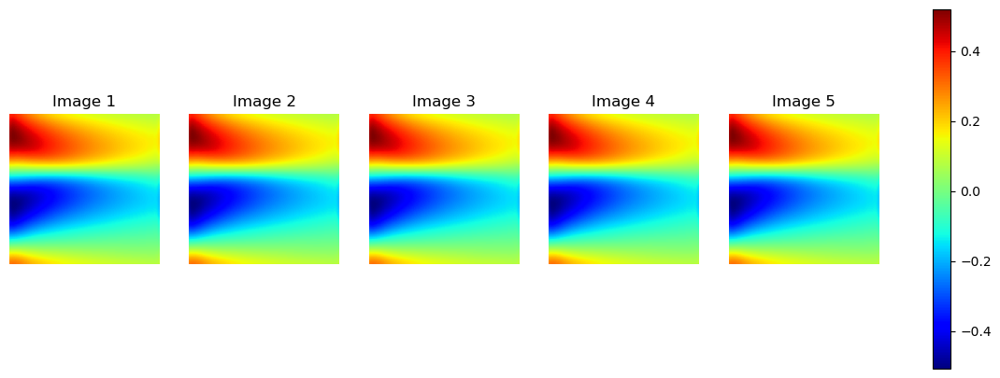

Epoch: 147, time: 2.413, Train Loss: 1.233e-03, Train l2: 0.1388, Test l2: 0.1362
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


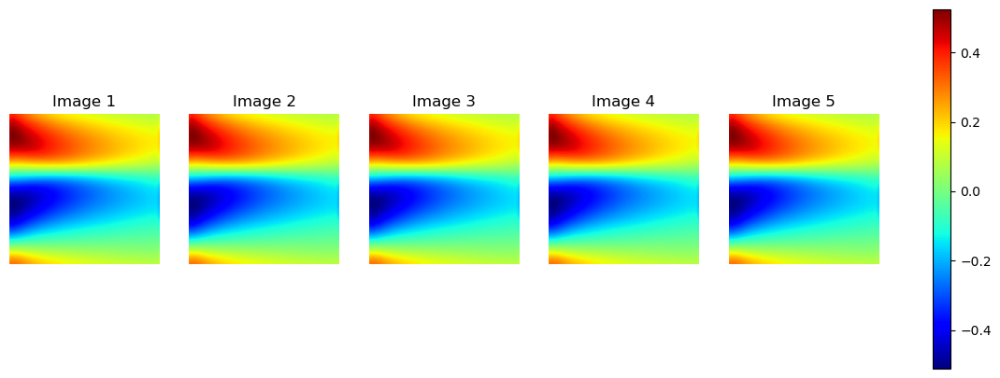

Epoch: 148, time: 2.655, Train Loss: 1.225e-03, Train l2: 0.1362, Test l2: 0.1385
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


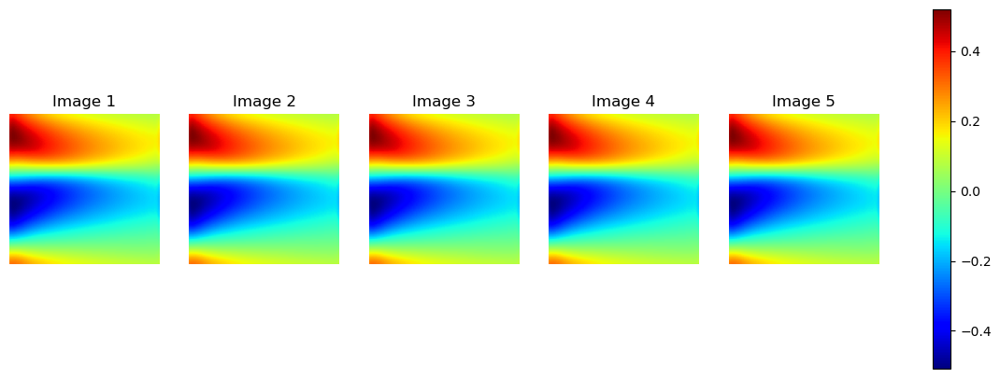

Epoch: 149, time: 2.443, Train Loss: 1.216e-03, Train l2: 0.1385, Test l2: 0.1352
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


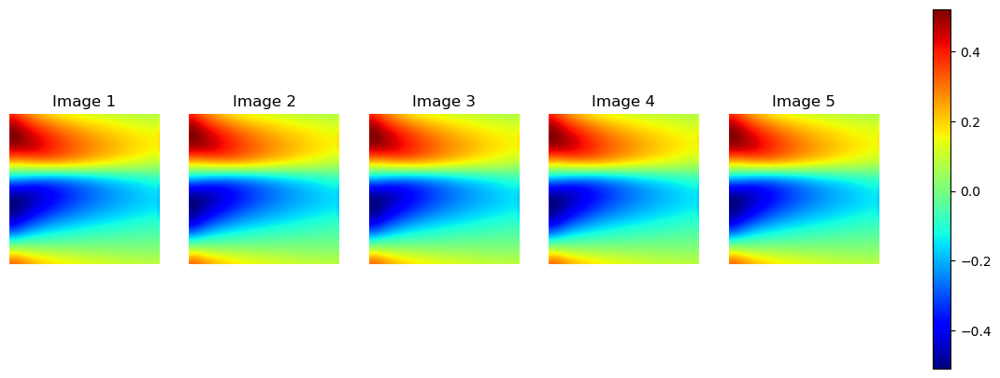

Epoch: 150, time: 2.462, Train Loss: 1.202e-03, Train l2: 0.1352, Test l2: 0.1353
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


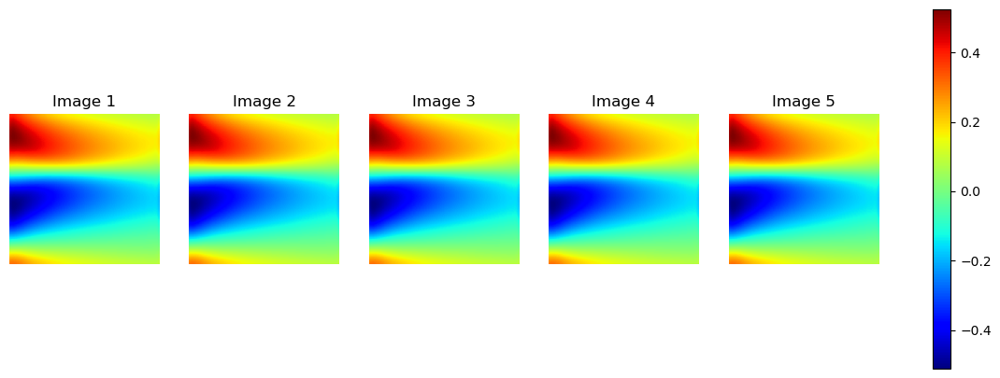

Epoch: 151, time: 2.417, Train Loss: 1.189e-03, Train l2: 0.1353, Test l2: 0.1362
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


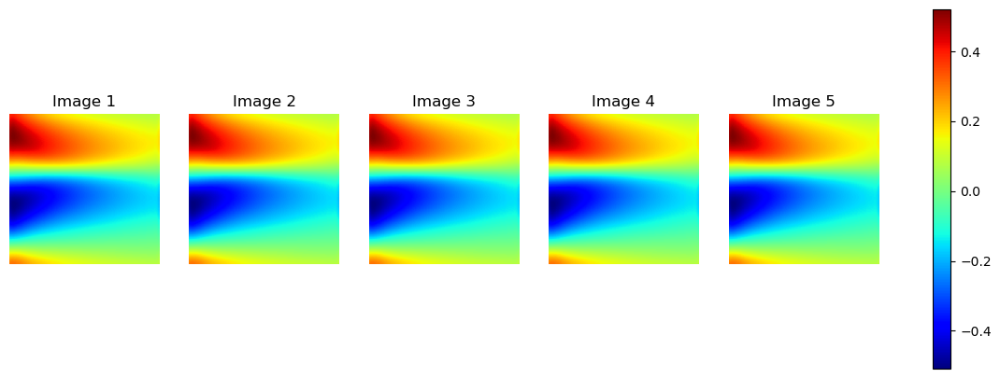

Epoch: 152, time: 2.426, Train Loss: 1.181e-03, Train l2: 0.1362, Test l2: 0.1330
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


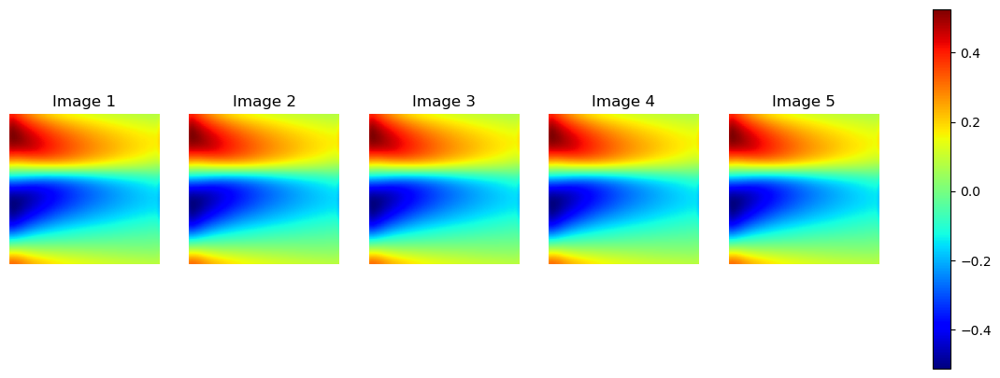

Epoch: 153, time: 2.430, Train Loss: 1.172e-03, Train l2: 0.1330, Test l2: 0.1345
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


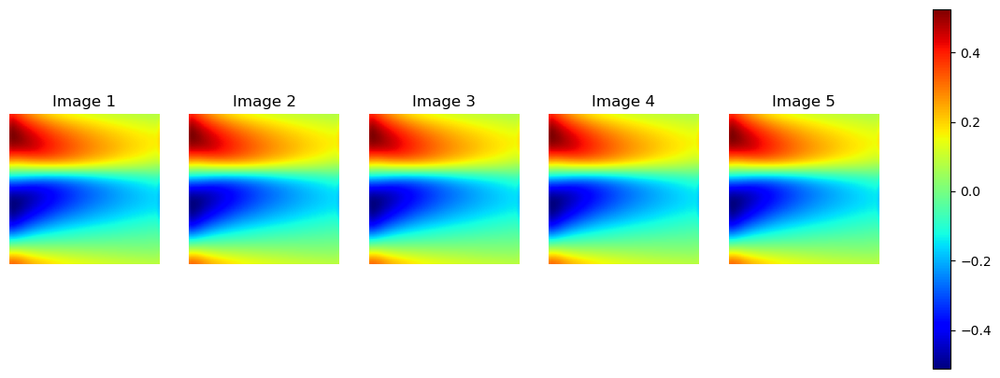

Epoch: 154, time: 2.456, Train Loss: 1.157e-03, Train l2: 0.1345, Test l2: 0.1329
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


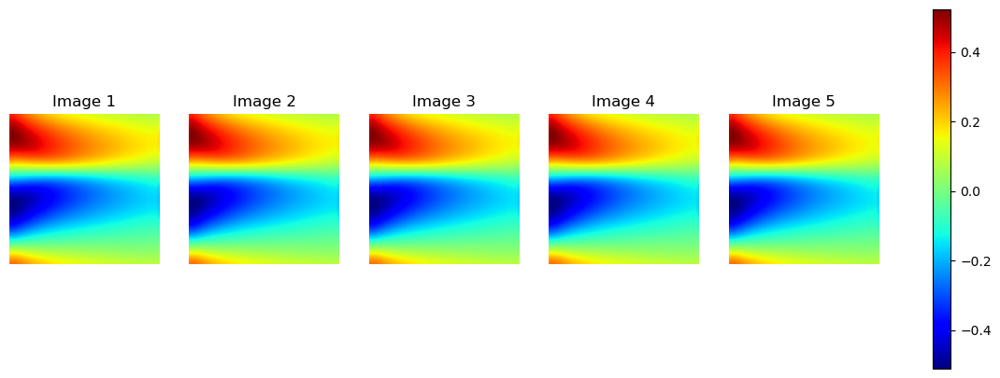

Epoch: 155, time: 2.518, Train Loss: 1.144e-03, Train l2: 0.1329, Test l2: 0.1312
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


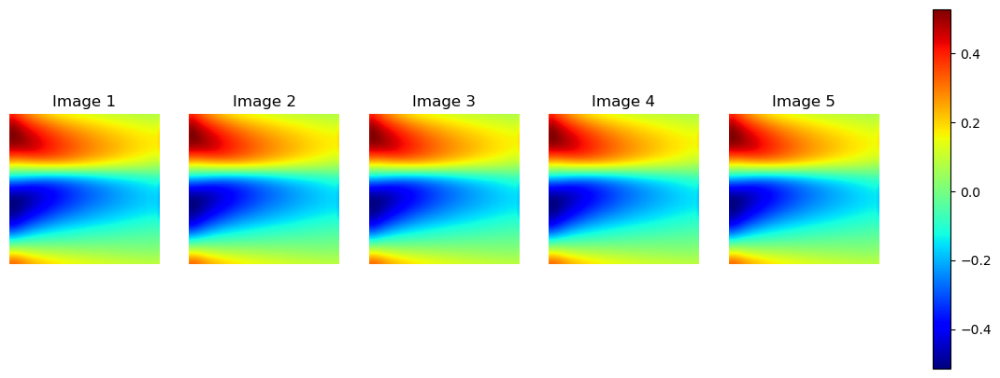

Epoch: 156, time: 2.410, Train Loss: 1.134e-03, Train l2: 0.1312, Test l2: 0.1330
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


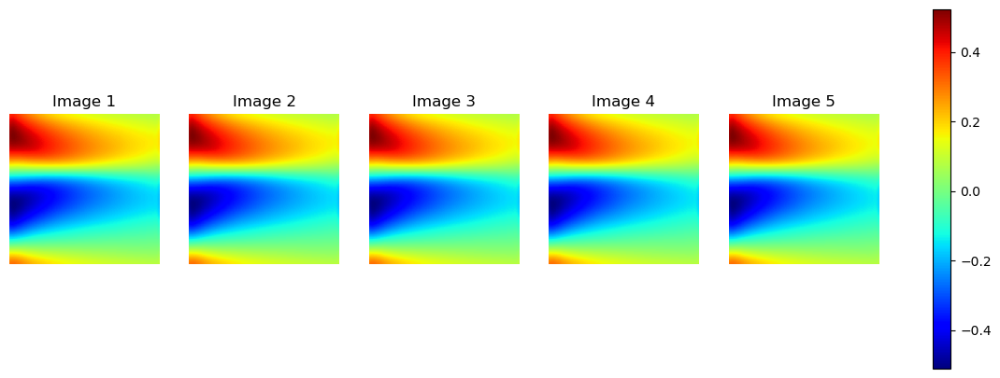

Epoch: 157, time: 2.532, Train Loss: 1.124e-03, Train l2: 0.1330, Test l2: 0.1295
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


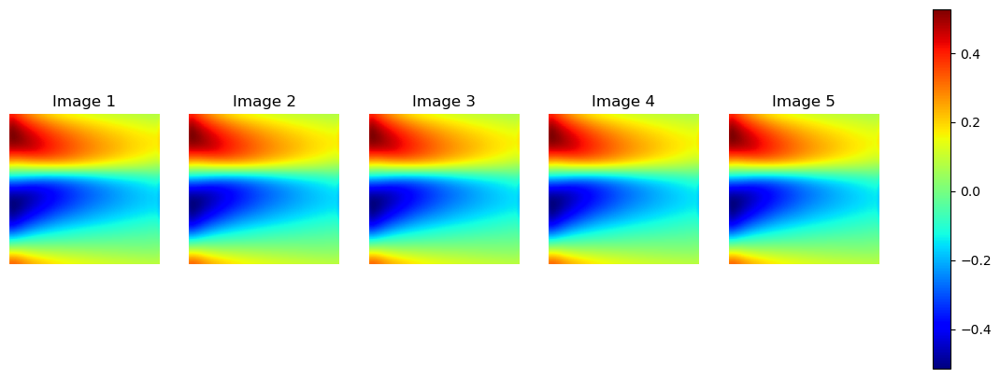

Epoch: 158, time: 2.413, Train Loss: 1.111e-03, Train l2: 0.1295, Test l2: 0.1306
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


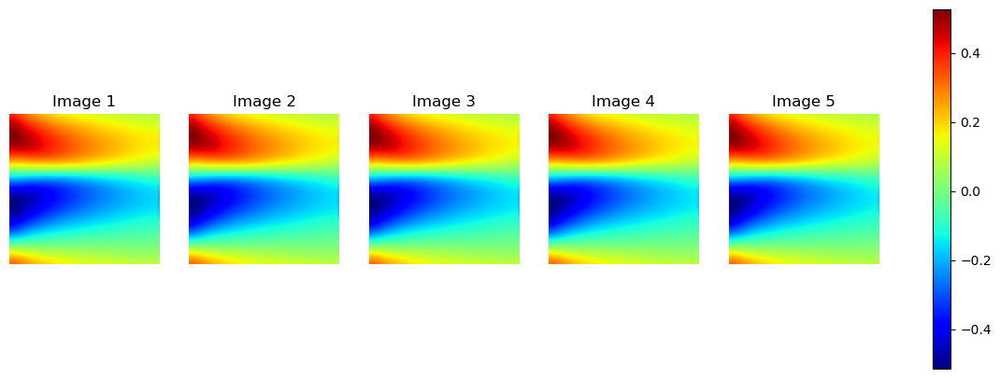

Epoch: 159, time: 2.418, Train Loss: 1.095e-03, Train l2: 0.1306, Test l2: 0.1290
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


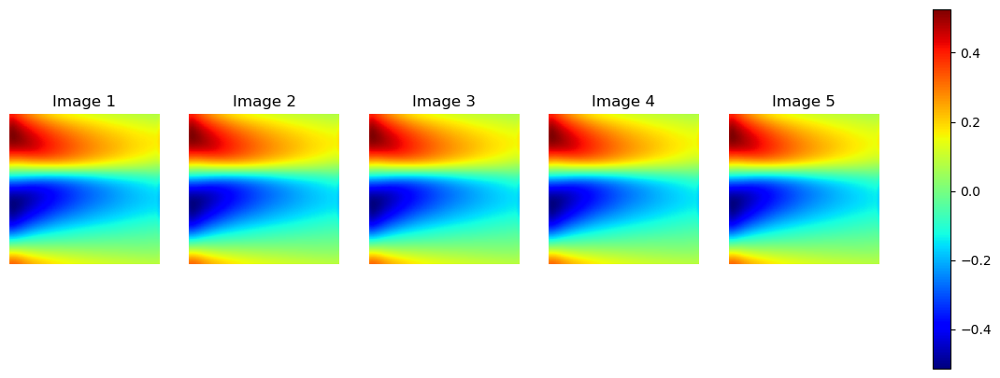

Epoch: 160, time: 2.387, Train Loss: 1.080e-03, Train l2: 0.1290, Test l2: 0.1275
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


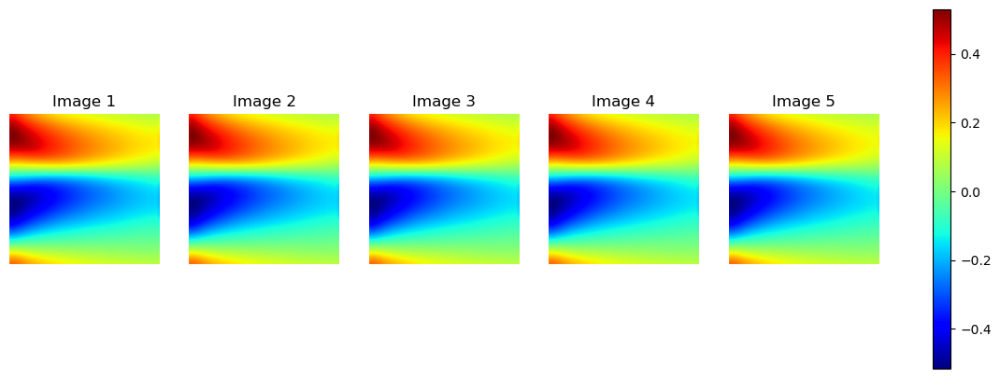

Epoch: 161, time: 2.578, Train Loss: 1.068e-03, Train l2: 0.1275, Test l2: 0.1291
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


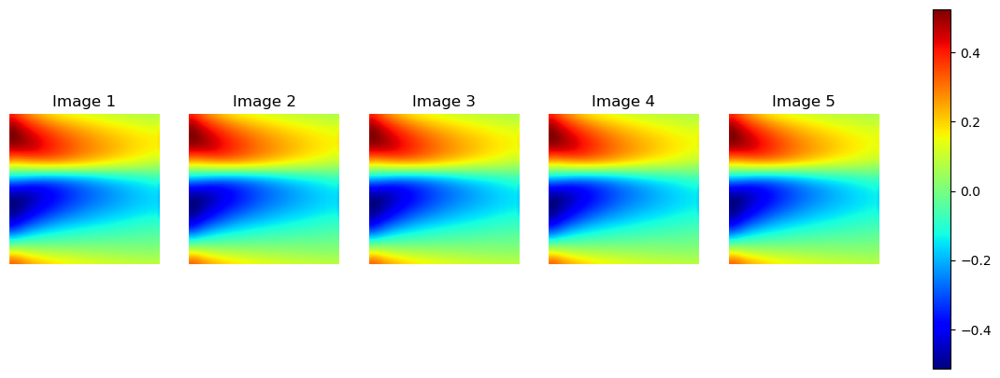

Epoch: 162, time: 2.439, Train Loss: 1.057e-03, Train l2: 0.1291, Test l2: 0.1250
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


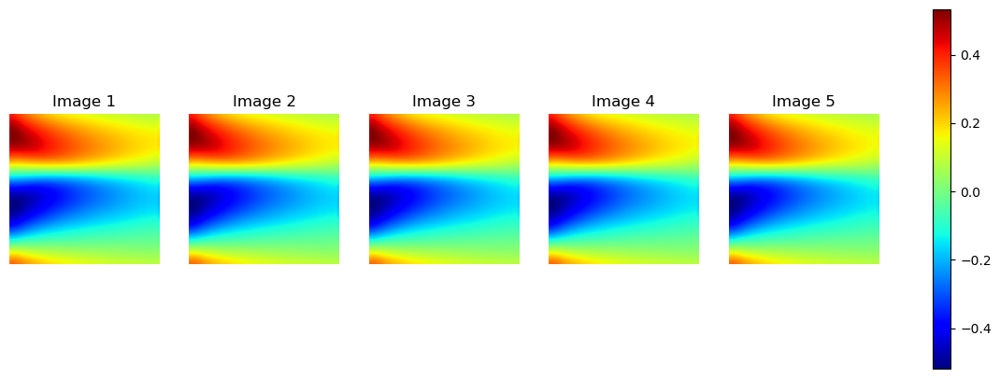

Epoch: 163, time: 2.450, Train Loss: 1.049e-03, Train l2: 0.1250, Test l2: 0.1293
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


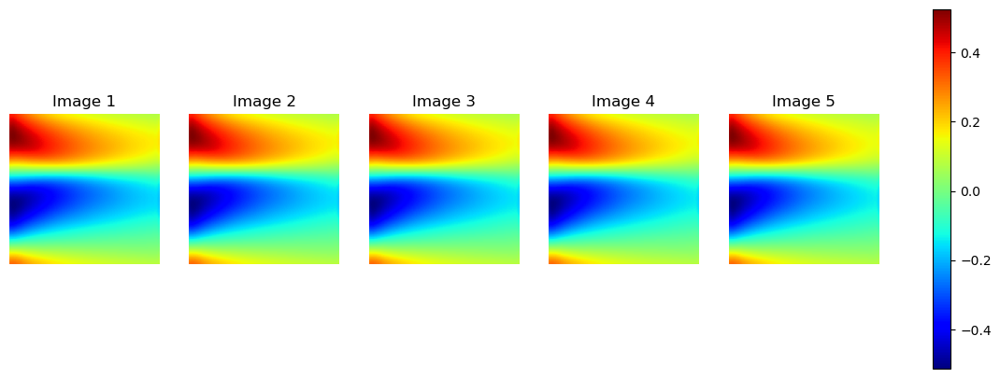

Epoch: 164, time: 2.403, Train Loss: 1.041e-03, Train l2: 0.1293, Test l2: 0.1233
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


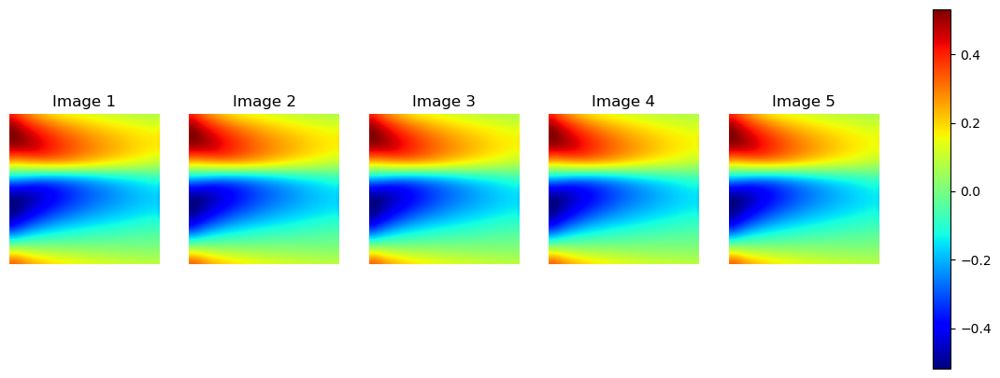

Epoch: 165, time: 2.391, Train Loss: 1.027e-03, Train l2: 0.1233, Test l2: 0.1260
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


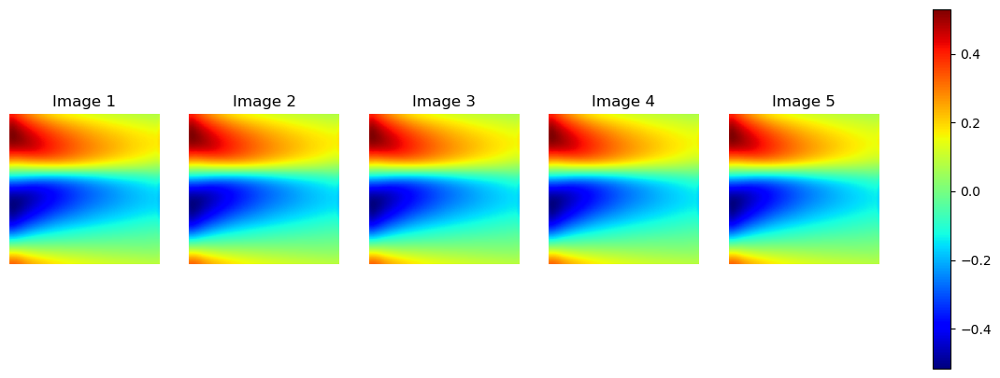

Epoch: 166, time: 2.490, Train Loss: 1.004e-03, Train l2: 0.1260, Test l2: 0.1230
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


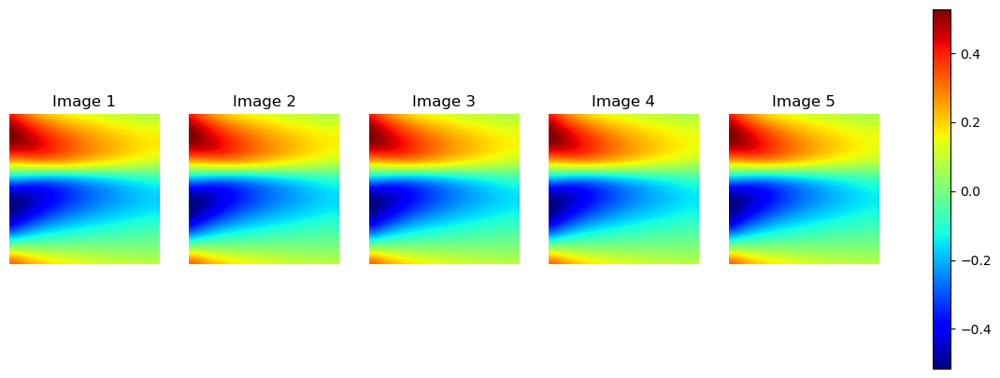

Epoch: 167, time: 2.460, Train Loss: 9.851e-04, Train l2: 0.1230, Test l2: 0.1212
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


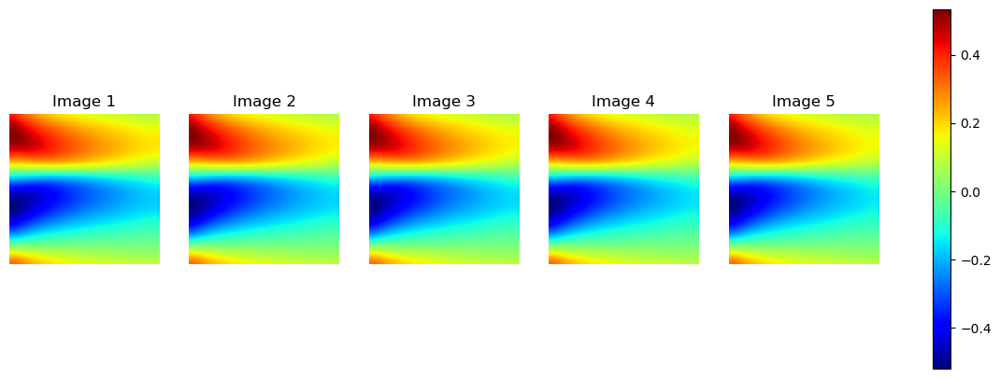

Epoch: 168, time: 2.520, Train Loss: 9.751e-04, Train l2: 0.1212, Test l2: 0.1246
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


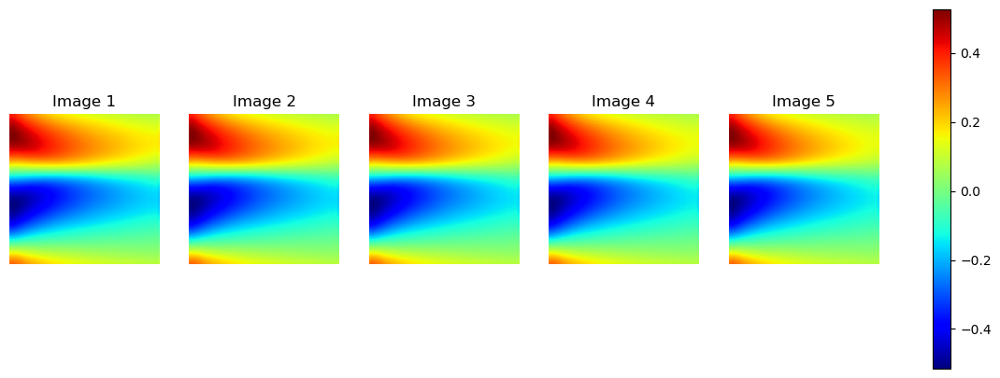

Epoch: 169, time: 2.426, Train Loss: 9.702e-04, Train l2: 0.1246, Test l2: 0.1189
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


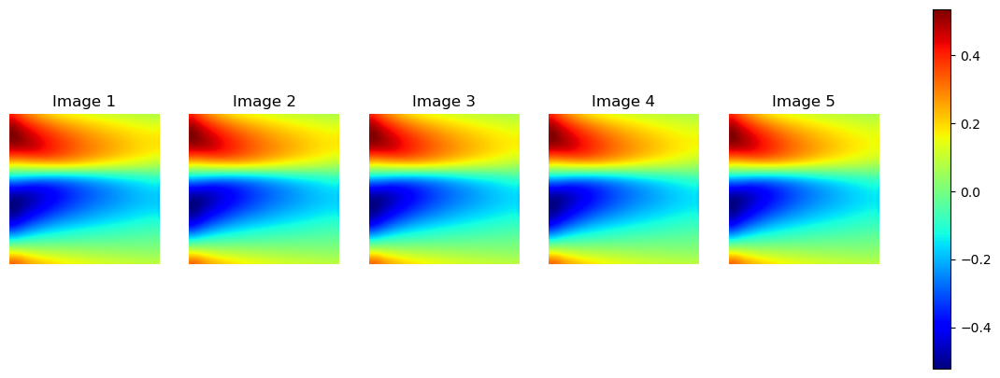

Epoch: 170, time: 2.398, Train Loss: 9.655e-04, Train l2: 0.1189, Test l2: 0.1240
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


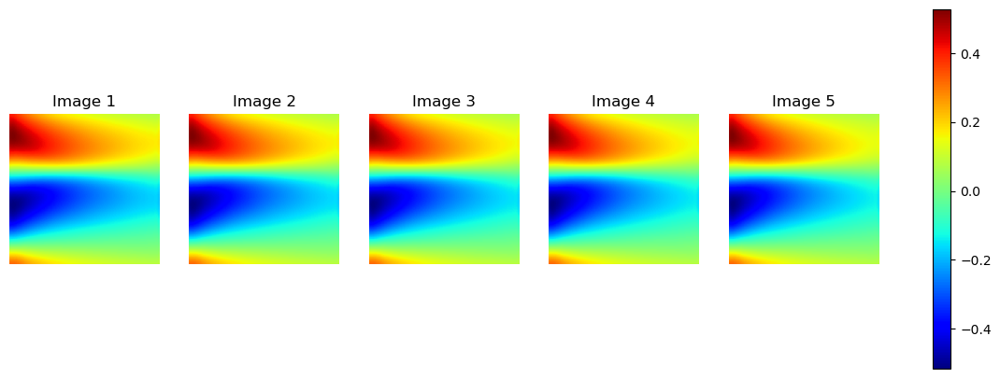

Epoch: 171, time: 2.392, Train Loss: 9.509e-04, Train l2: 0.1240, Test l2: 0.1172
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


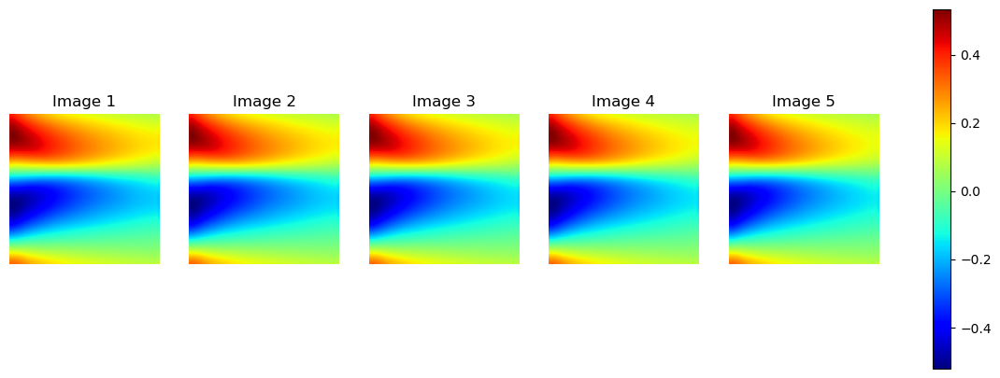

Epoch: 172, time: 2.440, Train Loss: 9.278e-04, Train l2: 0.1172, Test l2: 0.1188
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


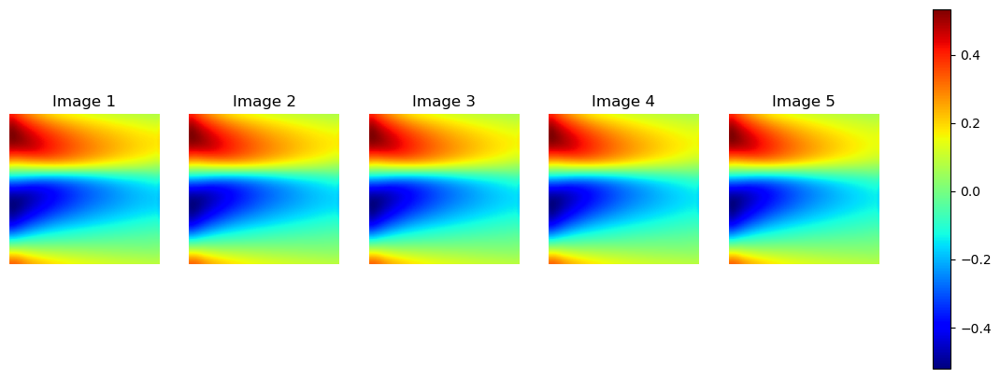

Epoch: 173, time: 2.411, Train Loss: 9.038e-04, Train l2: 0.1188, Test l2: 0.1176
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


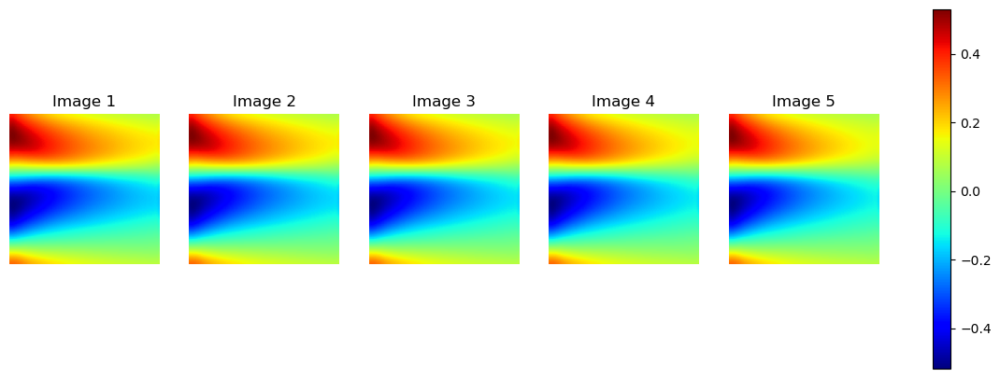

Epoch: 174, time: 2.612, Train Loss: 8.889e-04, Train l2: 0.1176, Test l2: 0.1145
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


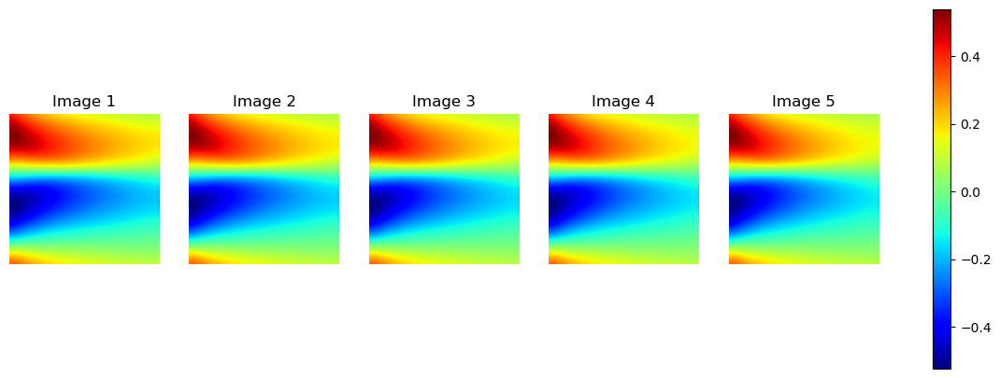

Epoch: 175, time: 2.404, Train Loss: 8.826e-04, Train l2: 0.1145, Test l2: 0.1196
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


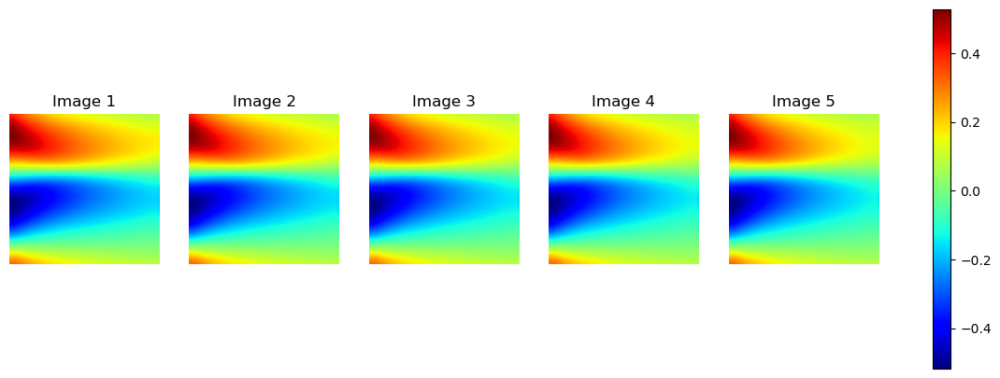

Epoch: 176, time: 2.544, Train Loss: 8.824e-04, Train l2: 0.1196, Test l2: 0.1128
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


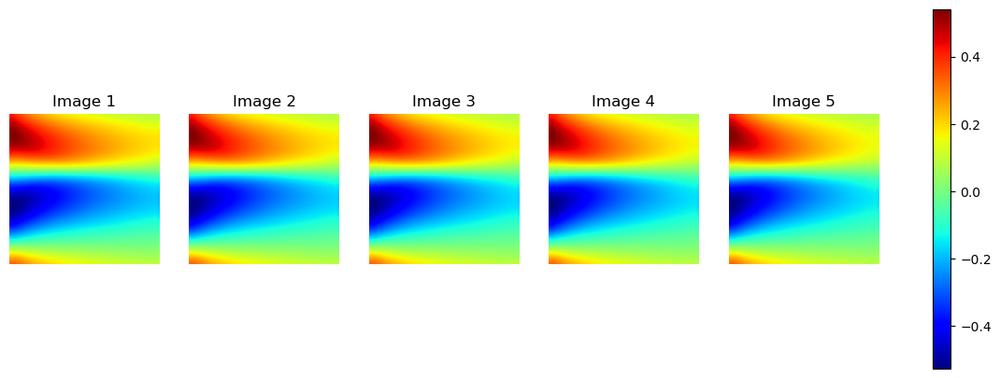

Epoch: 177, time: 2.407, Train Loss: 8.890e-04, Train l2: 0.1128, Test l2: 0.1214
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


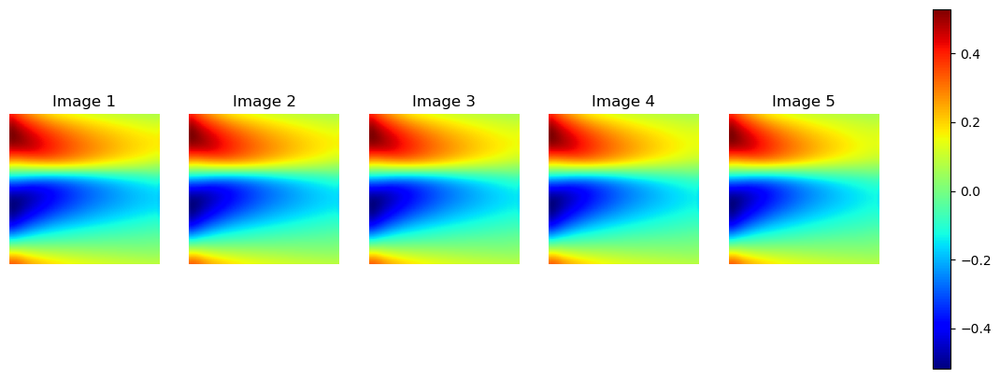

Epoch: 178, time: 2.383, Train Loss: 8.865e-04, Train l2: 0.1214, Test l2: 0.1110
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


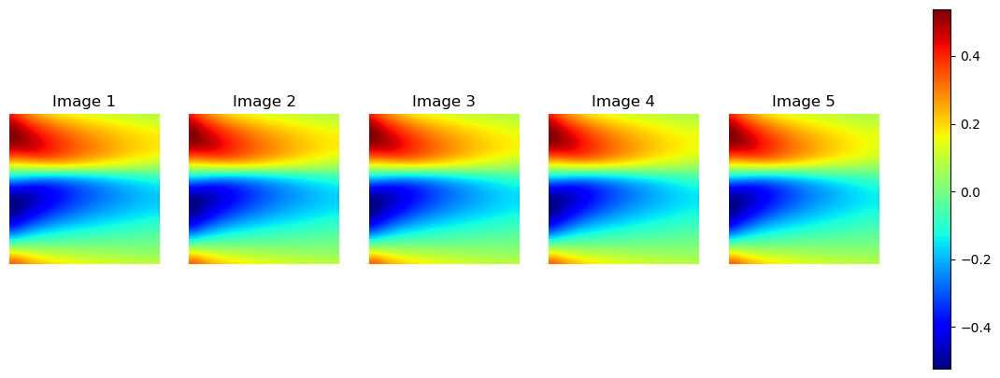

Epoch: 179, time: 2.393, Train Loss: 8.602e-04, Train l2: 0.1110, Test l2: 0.1141
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


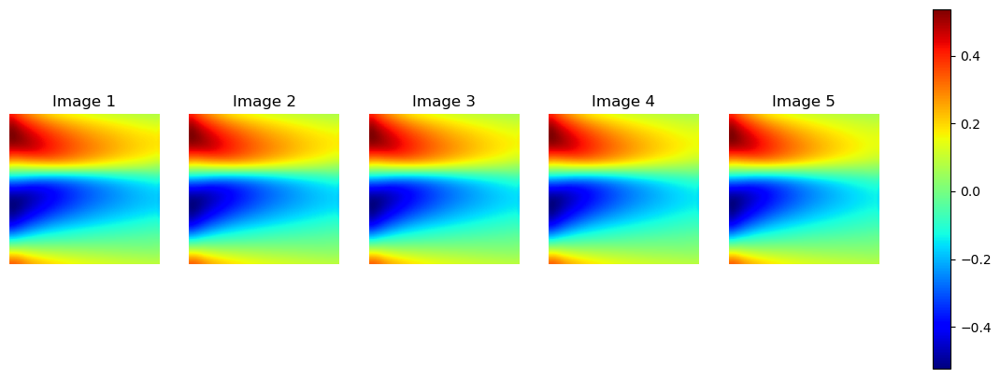

Epoch: 180, time: 2.446, Train Loss: 8.164e-04, Train l2: 0.1141, Test l2: 0.1113
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


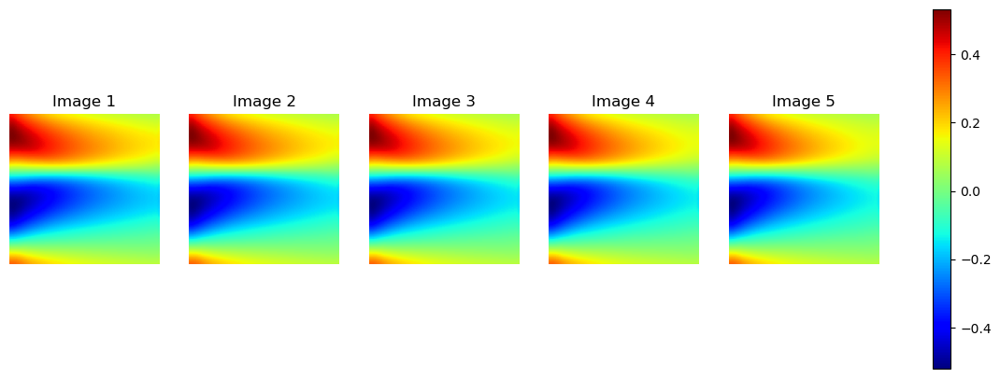

Epoch: 181, time: 2.741, Train Loss: 7.961e-04, Train l2: 0.1113, Test l2: 0.1081
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


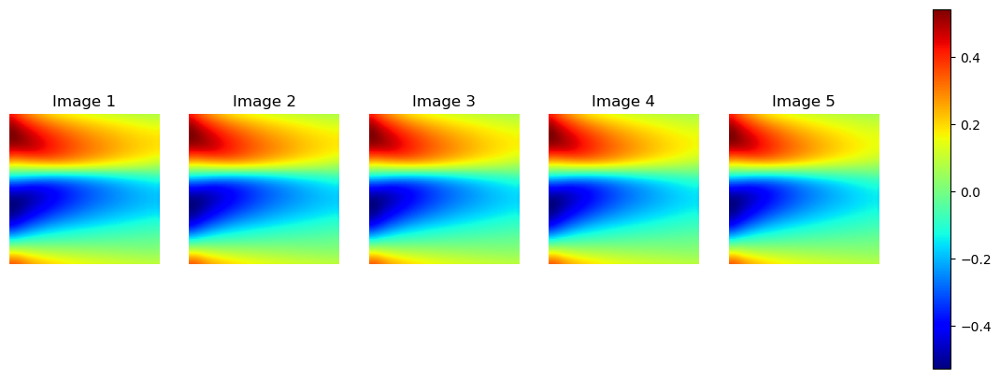

Epoch: 182, time: 2.462, Train Loss: 8.035e-04, Train l2: 0.1081, Test l2: 0.1161
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


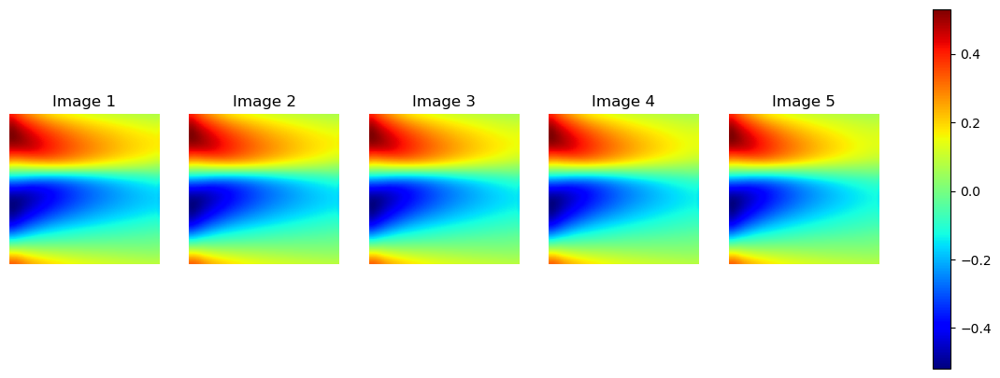

Epoch: 183, time: 2.408, Train Loss: 8.144e-04, Train l2: 0.1161, Test l2: 0.1070
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


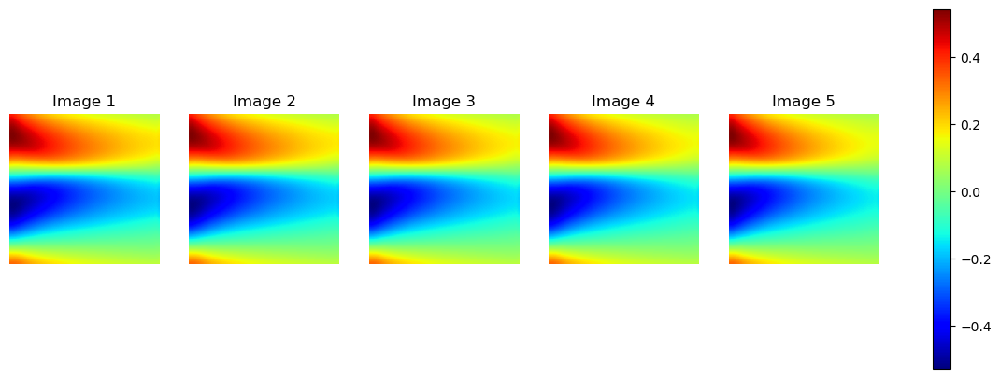

Epoch: 184, time: 2.427, Train Loss: 8.075e-04, Train l2: 0.1070, Test l2: 0.1122
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


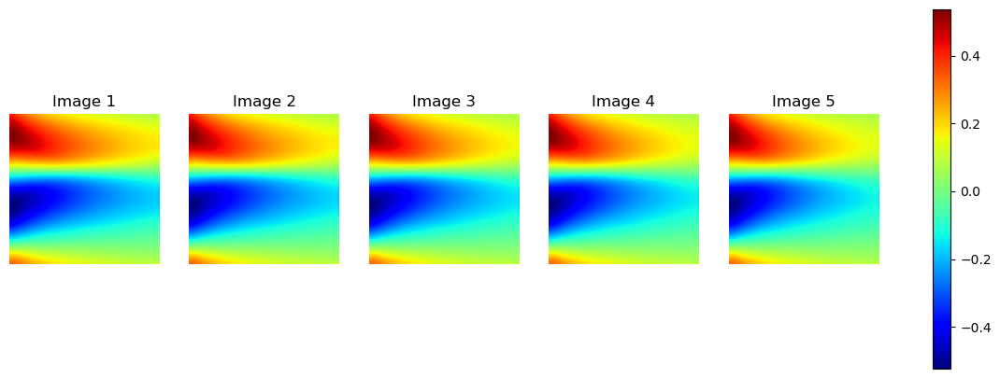

Epoch: 185, time: 2.536, Train Loss: 7.716e-04, Train l2: 0.1122, Test l2: 0.1051
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


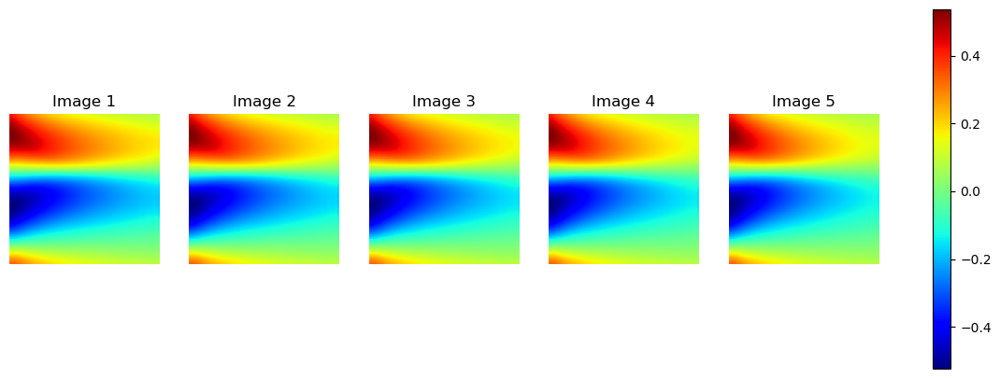

Epoch: 186, time: 2.441, Train Loss: 7.373e-04, Train l2: 0.1051, Test l2: 0.1042
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


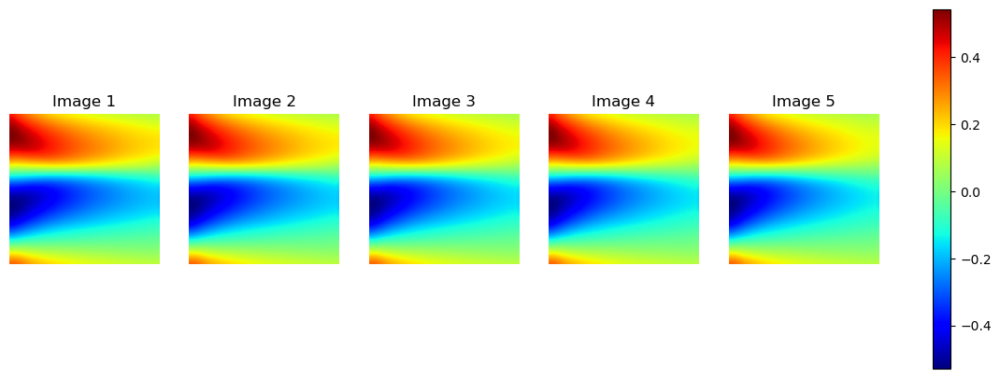

Epoch: 187, time: 2.548, Train Loss: 7.259e-04, Train l2: 0.1042, Test l2: 0.1092
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


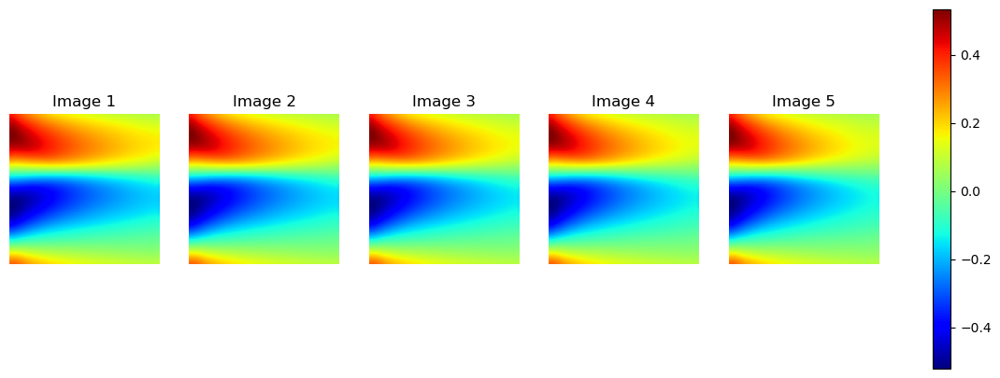

Epoch: 188, time: 2.412, Train Loss: 7.331e-04, Train l2: 0.1092, Test l2: 0.1027
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


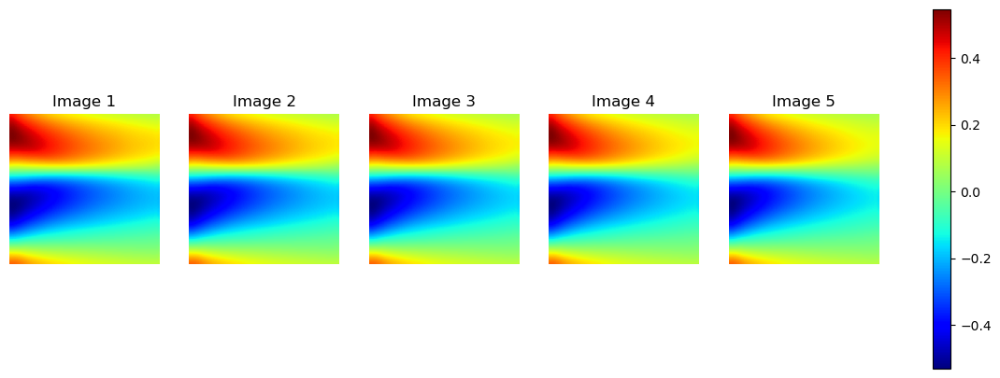

Epoch: 189, time: 2.376, Train Loss: 7.459e-04, Train l2: 0.1027, Test l2: 0.1118
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


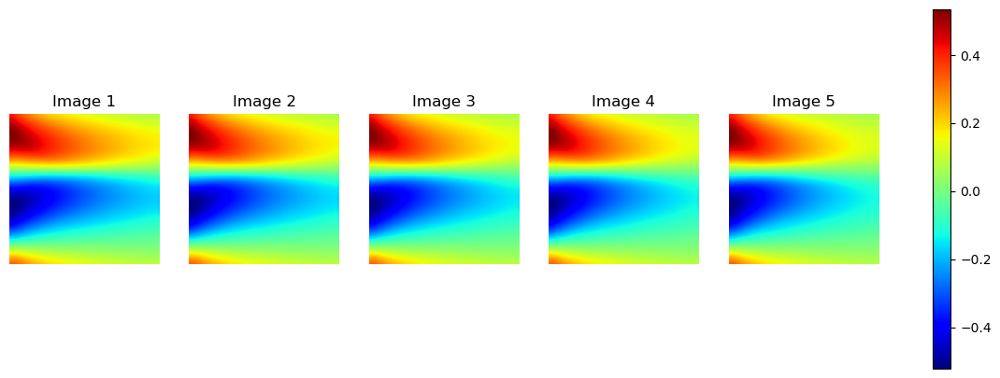

Epoch: 190, time: 2.372, Train Loss: 7.455e-04, Train l2: 0.1118, Test l2: 0.1011
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


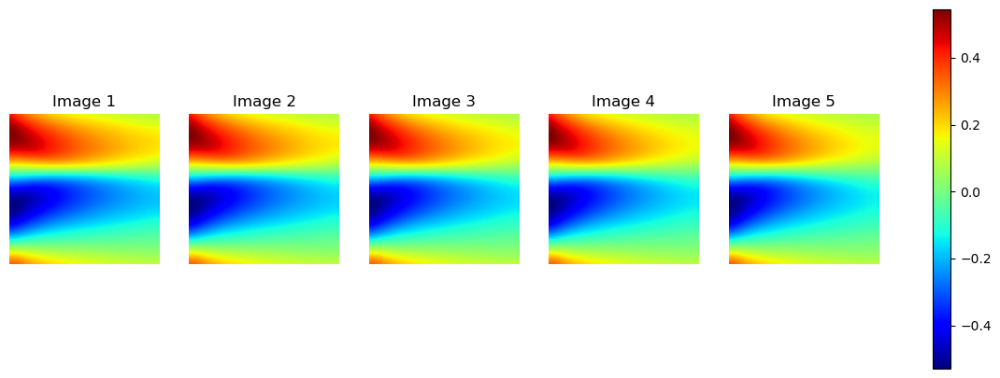

Epoch: 191, time: 2.387, Train Loss: 7.260e-04, Train l2: 0.1011, Test l2: 0.1058
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


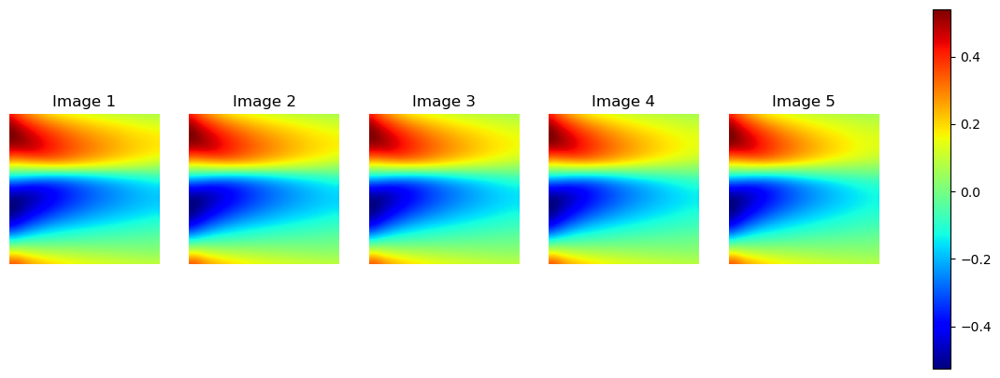

Epoch: 192, time: 2.493, Train Loss: 6.868e-04, Train l2: 0.1058, Test l2: 0.0991
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


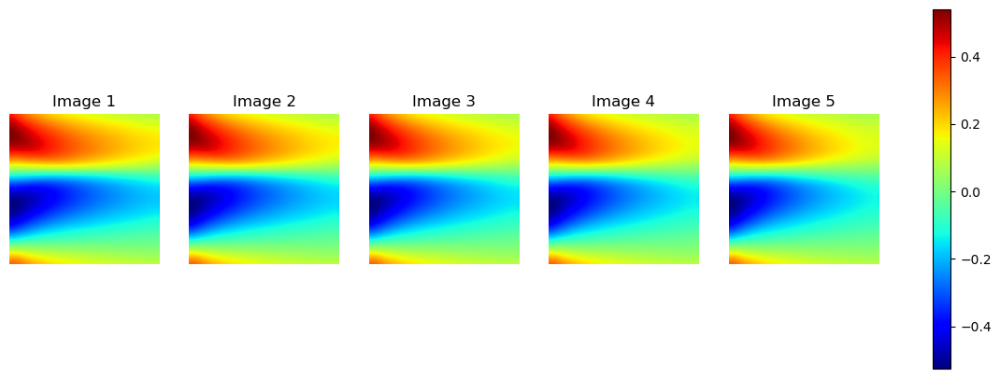

Epoch: 193, time: 2.389, Train Loss: 6.557e-04, Train l2: 0.0991, Test l2: 0.0982
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


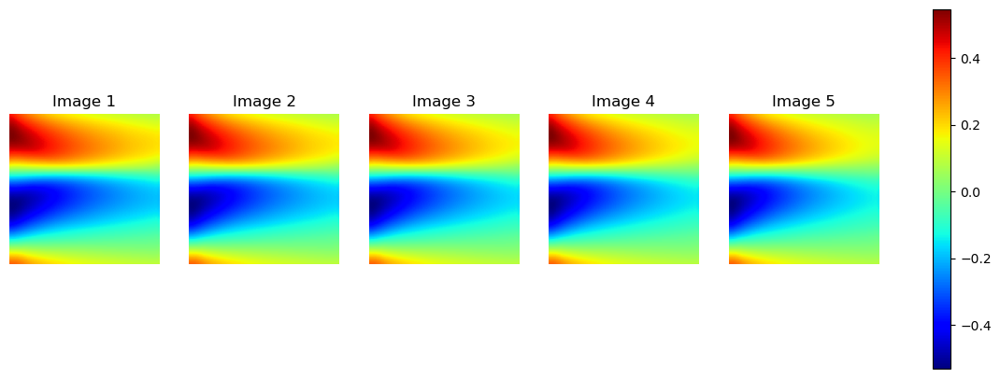

Epoch: 194, time: 2.734, Train Loss: 6.449e-04, Train l2: 0.0982, Test l2: 0.1029
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


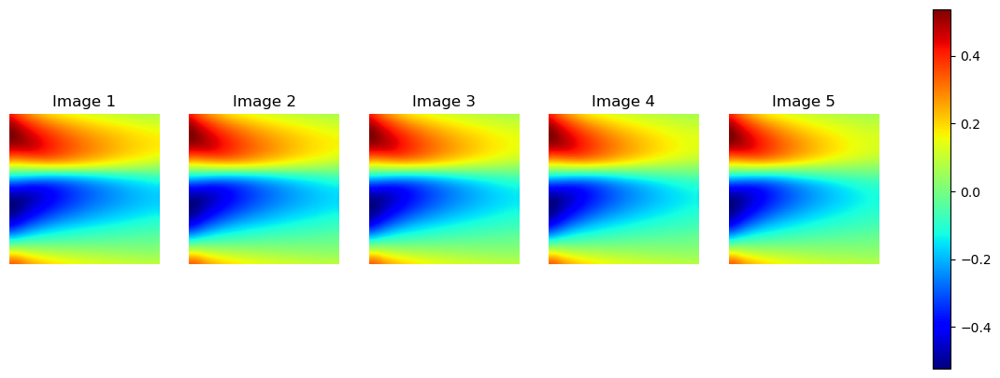

Epoch: 195, time: 2.484, Train Loss: 6.507e-04, Train l2: 0.1029, Test l2: 0.0969
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


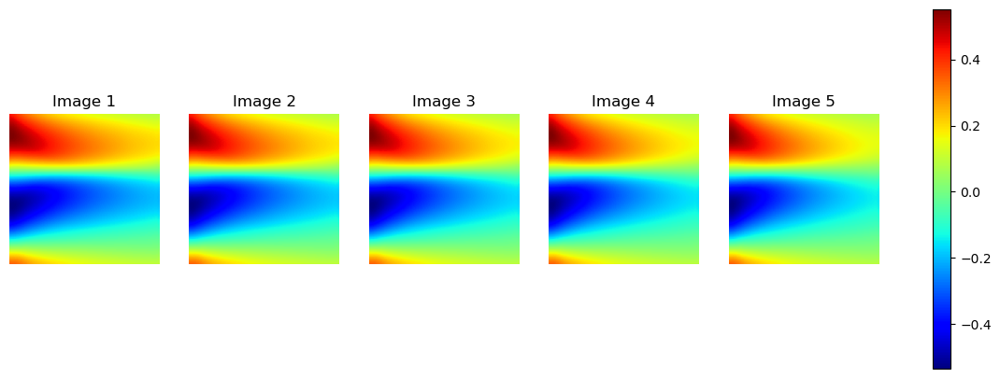

Epoch: 196, time: 3.051, Train Loss: 6.684e-04, Train l2: 0.0969, Test l2: 0.1085
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


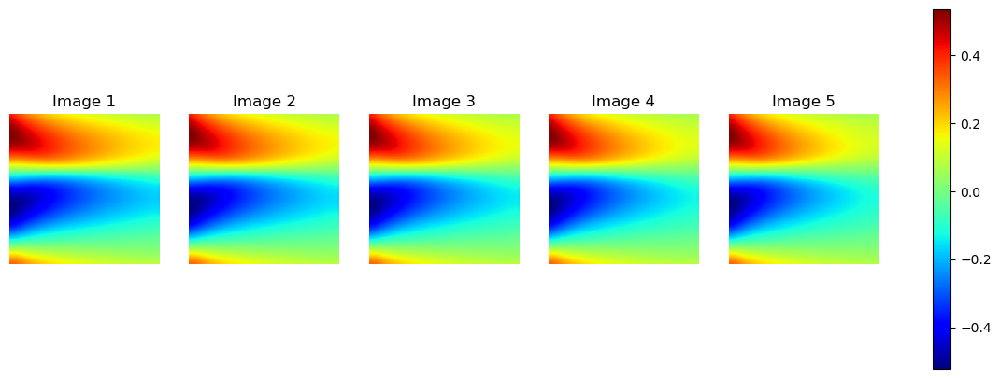

Epoch: 197, time: 2.877, Train Loss: 6.887e-04, Train l2: 0.1085, Test l2: 0.0981
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


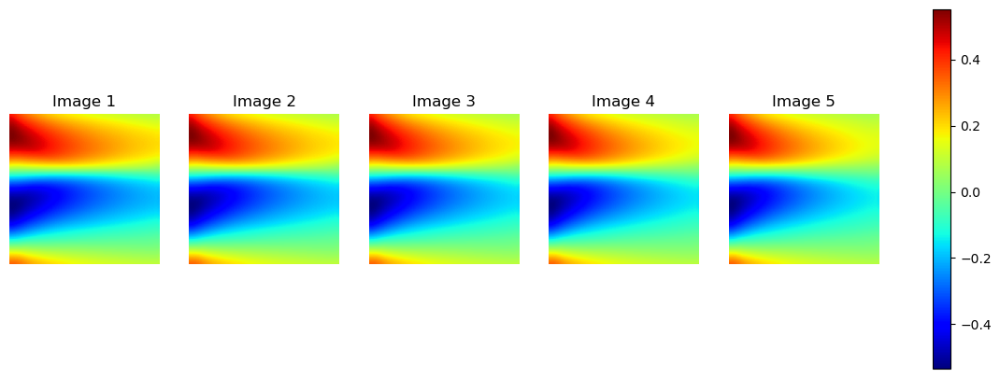

Epoch: 198, time: 2.916, Train Loss: 7.030e-04, Train l2: 0.0981, Test l2: 0.1074
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


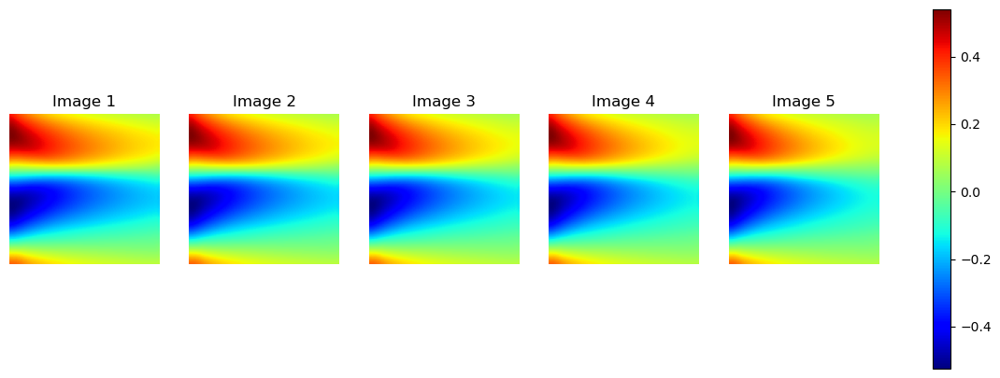

Epoch: 199, time: 2.782, Train Loss: 6.722e-04, Train l2: 0.1074, Test l2: 0.0932


In [71]:
if __name__ == "__main__":
    
    training_data_resolution = 101
    run_index = 0
    FNO_main(training_data_resolution, run_index)

In [72]:
train_data_res=101
ntrain = 5   
ntest = 1        
batch_size = 1
learning_rate = 0.001    
epochs = 2000
step_size = 100
gamma = 0.5    
modes = 12
width = 32   
TRAIN_PATH = 'fno_tr_pre.mat'
TEST_PATH_INTER = 'fno_te_pre_inter.mat' 
TEST_PATH_EXTRA = 'fno_te_pre_extra.mat'

################################################################
# interpolation testing
################################################################
model = torch.load('model/TrainRes_101/0/fourier_burger')

test_data_res = train_data_res
s = test_data_res
r = (101-1) // (s-1) 

reader = MatReader(TEST_PATH_INTER)
reader.load_file(TEST_PATH_INTER)
x_test = reader.read_field('coet2')[:ntest,::r,::r][:,:s,:s]
y_test = reader.read_field('test_yinter')[:ntest,::r,::r][:,:s,:s]

grids = []
grid_all = np.linspace(0, 1, 101).reshape(101, 1).astype(np.float64)
grid_all_3 = np.linspace(0,1,101).reshape(101, 1).astype(np.float64)
grids.append(grid_all_3[::r,:])
grids.append(grid_all[::r,:])
grid = np.vstack([xx.ravel() for xx in np.meshgrid(*grids)]).T
grid = grid.reshape(1,s,s,2)
grid = torch.tensor(grid, dtype=torch.float)
x_test = torch.cat([x_test.reshape(ntest,s,s,1), grid.repeat(ntest,1,1,1)], dim=3)
test_loader = torch.utils.data.DataLoader(torch.utils.data.TensorDataset(x_test, y_test), batch_size=batch_size, shuffle=False)

pred = torch.zeros(y_test.shape)
index = 0
t1 = default_timer()
test_l2 = 0
with torch.no_grad():
    for x, y in test_loader:
        # x, y = x.cuda(), y.cuda()
        x, y = x.to(device), y.to(device)
        out = model(x).reshape(1, s, s)
        pred[index:index+1,:,:] = out

        test_l2 += np.linalg.norm(out.view(1, -1).cpu().numpy() 
                                  - y.view(1, -1).cpu().numpy()) / np.linalg.norm(y.view(1, -1).cpu().numpy())
        index = index + 1
t2 = default_timer()
testing_time = t2-t1
print('interpolation testing time: ', testing_time)
test_l2 = test_l2/index
# ====================================
current_directory = os.getcwd()
resolution = "TrainRes_"+str(train_data_res)
save_index=0
folder_index = str(save_index)

results_dir = "/results/" + resolution +"/" + folder_index +"/"
save_results_to = current_directory + results_dir

scipy.io.savemat(save_results_to+'FNO_burger_test_inter_'+str(test_data_res)+'.mat', 
                    mdict={'x_test': reader.read_field('coet2')[:ntest,::r,::r][:,:s,:s].numpy(),
                           'y_test': y_test.numpy(), 
                           'y_pred': pred.cpu().numpy(),
                           'testing_time': testing_time})

print('finished')

################################################################
# extrapolation testing
################################################################

reader = MatReader(TEST_PATH_EXTRA)
reader.load_file(TEST_PATH_EXTRA)
x_test = reader.read_field('coet1')[:ntest,::r,::r][:,:s,:s]
y_test = reader.read_field('test_yextra')[:ntest,::r,::r][:,:s,:s]

grids = []
grid_all = np.linspace(0, 1, 101).reshape(101, 1).astype(np.float64)
grid_all_3 = np.linspace(0,1,101).reshape(101, 1).astype(np.float64)
grids.append(grid_all_3[::r,:])
grids.append(grid_all[::r,:])
grid = np.vstack([xx.ravel() for xx in np.meshgrid(*grids)]).T
grid = grid.reshape(1,s,s,2)
grid = torch.tensor(grid, dtype=torch.float)
x_test = torch.cat([x_test.reshape(ntest,s,s,1), grid.repeat(ntest,1,1,1)], dim=3)
test_loader = torch.utils.data.DataLoader(torch.utils.data.TensorDataset(x_test, y_test), batch_size=batch_size, shuffle=False)

pred = torch.zeros(y_test.shape)
index = 0
t1 = default_timer()
test_l2 = 0
with torch.no_grad():
    for x, y in test_loader:
        # x, y = x.cuda(), y.cuda()
        x, y = x.to(device), y.to(device)
        out = model(x).reshape(1, s, s)
        pred[index:index+1,:,:] = out

        test_l2 += np.linalg.norm(out.view(1, -1).cpu().numpy() 
                                  - y.view(1, -1).cpu().numpy()) / np.linalg.norm(y.view(1, -1).cpu().numpy())
        index = index + 1
t2 = default_timer()
testing_time = t2-t1
print('extrapolation testing time: ', testing_time)
test_l2 = test_l2/index
# ====================================
current_directory = os.getcwd()
resolution = "TrainRes_"+str(train_data_res)
save_index=0
folder_index = str(save_index)

results_dir = "/results/" + resolution +"/" + folder_index +"/"
save_results_to = current_directory + results_dir

scipy.io.savemat(save_results_to+'FNO_burger_test_extra_'+str(test_data_res)+'.mat', 
                    mdict={'x_test': reader.read_field('coet1')[:ntest,::r,::r][:,:s,:s].numpy(),
                           'y_test': y_test.numpy(), 
                           'y_pred': pred.cpu().numpy(),
                           'testing_time': testing_time})

print('finished')

interpolation testing time:  0.2128383749995919
finished
extrapolation testing time:  0.20673429099952045
finished


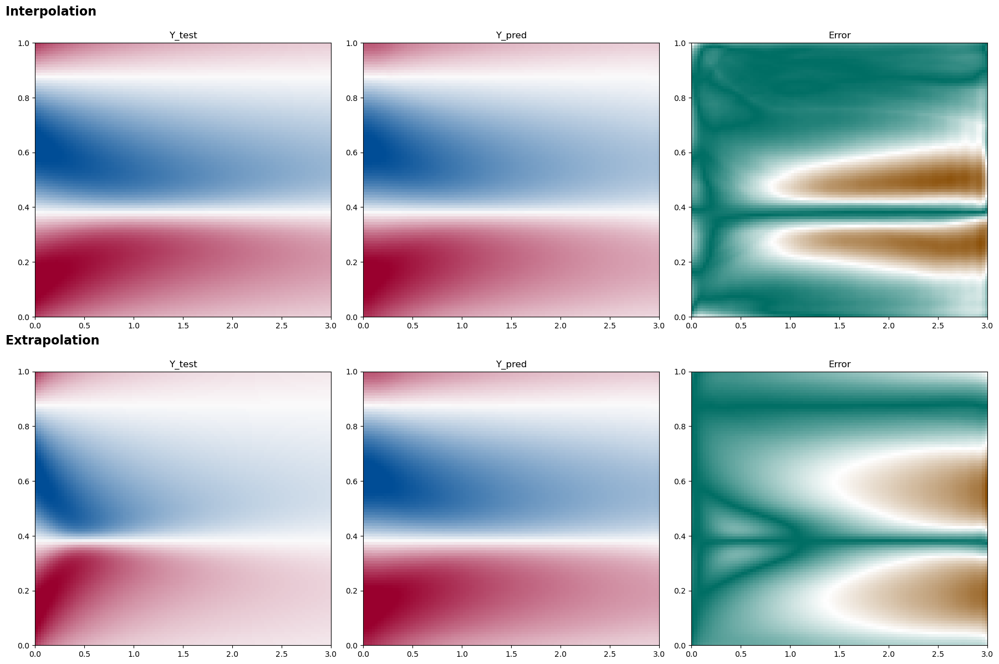

In [73]:
################################################################
# plotting
################################################################

# Load colormap data from MATLAB files
map_rebu_data = loadmat('Map_rebu.mat')
Map_rebu = map_rebu_data['Map_rebu']

map_grye_data = loadmat('Map_grye.mat')
Map_grye = map_grye_data['Map_grye']

# ---------------------------
# Add the folder 'FNO' to the Python path
current_folder = os.getcwd()
full_path = os.path.join(current_folder, 'FNO')
sys.path.append(full_path)

# Define t and x vectors (MATLAB: t = 0:0.01:3; x = 0:0.01:1)
t = np.arange(0, 3.01, 0.01)
x = np.arange(0, 1.01, 0.01)
t_reduced = t[::3]

# Create figure with 2 rows (interpolation, extrapolation) and 3 columns
fig, axs = plt.subplots(2, 3, figsize=(18, 12))

#######################
# Interpolation Section
#######################
# Load interpolation test data from MATLAB file
interp_data = loadmat('results/TrainRes_101/0/FNO_burger_test_inter_101.mat')
y_pred_interp = interp_data['y_pred']
y_test_interp = interp_data['y_test']

# Squeeze the dimensions to remove singleton dimensions
Y_test_interp = np.squeeze(y_test_interp)
Y_pred_interp = np.squeeze(y_pred_interp)

# Get number of columns (assumes Y_test_interp is 2D: shape = (num_x, N))
_, N = Y_test_interp.shape

# Compute relative error for each column
Err_interp = np.zeros_like(Y_test_interp)
for k in range(N):
    col_max = np.max(Y_test_interp[:, k])
    if col_max != 0:
        Err_interp[:, k] = np.abs(Y_pred_interp[:, k] - Y_test_interp[:, k]) / col_max
    else:
        Err_interp[:, k] = np.abs(Y_pred_interp[:, k] - Y_test_interp[:, k])

# Plot interpolation data in the top row (row 0)
# Plot 1: Y_test_interp
im = axs[0, 0].imshow(
    Y_test_interp,
    extent=[t_reduced[0], t_reduced[-1], x[0], x[-1]],
    origin='lower',
    aspect='auto'
)
im.set_cmap(ListedColormap(Map_rebu))
im.set_clim(-0.5, 0.5)
axs[0, 0].set_title('Y_test')
axs[0, 0].set_xlim(t_reduced[0], t_reduced[-1])
axs[0, 0].set_ylim(x[0], x[-1])

# Plot 2: Y_pred_interp
im = axs[0, 1].imshow(
    Y_pred_interp,
    extent=[t_reduced[0], t_reduced[-1], x[0], x[-1]],
    origin='lower',
    aspect='auto'
)
im.set_cmap(ListedColormap(Map_rebu))
im.set_clim(-0.5, 0.5)
axs[0, 1].set_title('Y_pred')
axs[0, 1].set_xlim(t_reduced[0], t_reduced[-1])
axs[0, 1].set_ylim(x[0], x[-1])

# Plot 3: Error for interpolation
im = axs[0, 2].imshow(
    Err_interp,
    extent=[t_reduced[0], t_reduced[-1], x[0], x[-1]],
    origin='lower',
    aspect='auto'
)
im.set_cmap(ListedColormap(Map_grye))
axs[0, 2].set_title('Error')
axs[0, 2].set_xlim(t_reduced[0], t_reduced[-1])
axs[0, 2].set_ylim(x[0], x[-1])

# Add a label on top of the interpolation row
axs[0, 0].annotate('Interpolation', xy=(-0.1, 1.1), xycoords='axes fraction', fontsize=16, weight='bold')


#######################
# Extrapolation Section
#######################
# Load extrapolation test data from MATLAB file
extra_data = loadmat('results/TrainRes_101/0/FNO_burger_test_extra_101.mat')
y_pred_extra = extra_data['y_pred']
y_test_extra = extra_data['y_test']

# Squeeze the dimensions to remove singleton dimensions
Y_test_extra = np.squeeze(y_test_extra)
Y_pred_extra = np.squeeze(y_pred_extra)

# Get number of columns (assumes Y_test_extra is 2D: shape = (num_x, N))
_, N = Y_test_extra.shape

# Compute relative error for each column
Err_extra = np.zeros_like(Y_test_extra)
for k in range(N):
    col_max = np.max(Y_test_extra[:, k])
    if col_max != 0:
        Err_extra[:, k] = np.abs(Y_pred_extra[:, k] - Y_test_extra[:, k]) / col_max
    else:
        Err_extra[:, k] = np.abs(Y_pred_extra[:, k] - Y_test_extra[:, k])

# Plot extrapolation data in the bottom row (row 1)
# Plot 1: Y_test_extra
im = axs[1, 0].imshow(
    Y_test_extra,
    extent=[t_reduced[0], t_reduced[-1], x[0], x[-1]],
    origin='lower',
    aspect='auto'
)
im.set_cmap(ListedColormap(Map_rebu))
im.set_clim(-0.5, 0.5)
axs[1, 0].set_title('Y_test')
axs[1, 0].set_xlim(t_reduced[0], t_reduced[-1])
axs[1, 0].set_ylim(x[0], x[-1])

# Plot 2: Y_pred_extra
im = axs[1, 1].imshow(
    Y_pred_extra,
    extent=[t_reduced[0], t_reduced[-1], x[0], x[-1]],
    origin='lower',
    aspect='auto'
)
im.set_cmap(ListedColormap(Map_rebu))
im.set_clim(-0.5, 0.5)
axs[1, 1].set_title('Y_pred')
axs[1, 1].set_xlim(t_reduced[0], t_reduced[-1])
axs[1, 1].set_ylim(x[0], x[-1])

# Plot 3: Error for extrapolation
im = axs[1, 2].imshow(
    Err_extra,
    extent=[t_reduced[0], t_reduced[-1], x[0], x[-1]],
    origin='lower',
    aspect='auto'
)
im.set_cmap(ListedColormap(Map_grye))
axs[1, 2].set_title('Error')
axs[1, 2].set_xlim(t_reduced[0], t_reduced[-1])
axs[1, 2].set_ylim(x[0], x[-1])

# Add a label on top of the extrapolation row
axs[1, 0].annotate('Extrapolation', xy=(-0.1, 1.1), xycoords='axes fraction', fontsize=16, weight='bold')

plt.tight_layout()
plt.show()
